In [59]:
import sys
sys.path.append("../") # adding the path to read the utils file
from sklearnex import patch_sklearn
patch_sklearn(global_patch=True)
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn import metrics, tree
from shap import TreeExplainer
import fasttreeshap
from shap import plots, Explanation
import graphviz 
from yellowbrick.model_selection import LearningCurve
import time
import shap
from utils import *
import pickle
import glob
from yellowbrick.classifier import ROCAUC
from yellowbrick.contrib.wrapper import wrap
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier

pd.set_option('display.max_columns', None)

Scikit-learn was successfully globally patched by Intel(R) Extension for Scikit-learn


Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [60]:
ds = pd.concat([pd.read_csv(csv_file, engine='pyarrow', index_col='id') for csv_file in glob.glob('../datasets/NFS-2023-nTE/*.csv')], ignore_index=True)
ds.head()

,expiration_id,src_ip,src_mac,src_oui,src_port,dst_ip,dst_mac,dst_oui,dst_port,protocol,ip_version,vlan_id,bidirectional_first_seen_ms,bidirectional_last_seen_ms,bidirectional_duration_ms,bidirectional_packets,bidirectional_bytes,src2dst_first_seen_ms,src2dst_last_seen_ms,src2dst_duration_ms,src2dst_packets,src2dst_bytes,dst2src_first_seen_ms,dst2src_last_seen_ms,dst2src_duration_ms,dst2src_packets,dst2src_bytes,bidirectional_min_ps,bidirectional_mean_ps,bidirectional_stddev_ps,bidirectional_max_ps,src2dst_min_ps,src2dst_mean_ps,src2dst_stddev_ps,src2dst_max_ps,dst2src_min_ps,dst2src_mean_ps,dst2src_stddev_ps,dst2src_max_ps,bidirectional_min_piat_ms,bidirectional_mean_piat_ms,bidirectional_stddev_piat_ms,bidirectional_max_piat_ms,src2dst_min_piat_ms,src2dst_mean_piat_ms,src2dst_stddev_piat_ms,src2dst_max_piat_ms,dst2src_min_piat_ms,dst2src_mean_piat_ms,dst2src_stddev_piat_ms,dst2src_max_piat_ms,bidirectional_syn_packets,bidirectional_cwr_packets,bidirectional_ece_packets,bidirectional_urg_packets,bidirectional_ack_packets,bidirectional_psh_packets,bidirectional_rst_packets,bidirectional_fin_packets,src2dst_syn_packets,src2dst_cwr_packets,src2dst_ece_packets,src2dst_urg_packets,src2dst_ack_packets,src2dst_psh_packets,src2dst_rst_packets,src2dst_fin_packets,dst2src_syn_packets,dst2src_cwr_packets,dst2src_ece_packets,dst2src_urg_packets,dst2src_ack_packets,dst2src_psh_packets,dst2src_rst_packets,dst2src_fin_packets,label
0,1,192.168.10.50,00:19:b9:0a:69:f1,00:19:b9,33898,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,389,6,4,0,1499342340490,1499342453585,113095,36,12216,1499342340490,1499342453585,113095,24,6418,1499342340490,1499342453585,113095,12,5798,66,339.333333,236.650194,989,66,267.416667,205.748880,469,382,483.166667,236.274430,989,0,3231.285714,6169.592586,16483,0,4917.173913,7082.328024,16483,3,10281.363636,7053.298154,16483,0,0,0,0,36,24,0,0,0,0,0,0,24,12,0,0,0,0,0,0,12,12,0,0,BENIGN
1,1,192.168.10.50,00:19:b9:0a:69:f1,00:19:b9,33904,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,389,6,4,0,1499342340491,1499342453964,113473,54,15605,1499342340491,1499342453964,113473,34,7926,1499342340491,1499342453918,113427,20,7679,66,288.981481,200.112750,1205,66,233.117647,173.216936,469,192,383.950000,210.983780,1205,0,2141.000000,5223.952902,16483,0,3438.575758,6304.323294,16483,0,5969.842105,7399.526406,16483,0,0,0,0,54,40,0,0,0,0,0,0,34,20,0,0,0,0,0,0,20,20,0,0,BENIGN
2,0,192.168.10.14,b8:ac:6f:36:07:ee,b8:ac:6f,59555,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,53,17,4,0,1499342357298,1499342357299,1,2,296,1499342357298,1499342357298,0,1,93,1499342357299,1499342357299,0,1,203,93,148.000000,77.781746,203,93,93.000000,0.000000,93,203,203.000000,0.000000,203,1,1.000000,0.000000,1,0,0.000000,0.000000,0,0,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,BENIGN
3,0,192.168.10.14,b8:ac:6f:36:07:ee,b8:ac:6f,59135,65.55.44.109,00:c1:b1:14:eb:31,00:c1:b1,443,6,4,0,1499342357299,1499342417611,60312,18,7559,1499342357299,1499342417611,60312,10,2888,1499342357349,1499342417610,60261,8,4671,60,419.944444,522.680700,1514,60,288.800000,393.690177,1147,60,583.875000,639.465723,1514,0,3547.764706,14539.437969,59969,0,6701.333333,19975.413926,59969,0,8608.714286,22683.047882,60049,2,0,0,0,17,7,0,2,1,0,0,0,9,4,0,1,1,0,0,0,8,3,0,1,BENIGN
4,0,192.168.10.50,00:19:b9:0a:69:f1,00:19:b9,123,129.6.15.29,00:c1:b1:14:eb:31,00:c1:b1,123,17,4,0,1499342395411,1499342395442,31,2,180,1499342395411,1499342395411,0,1,90,1499342395442,1499342395442,0,1,90,90,90.000000,0.000000,90,90,90.000000,0.000000,90,90,90.000000,0.000000,90,31,31.000000,0.000000,31,0,0.000000,0.000000,0,0,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,BENIGN


In [63]:
compute_ratio(ds,'label')

                            Ratio
label                            
BENIGN                      76.37
PortScan                    10.61
DoS Hulk                     7.49
DDoS                         4.41
DoS GoldenEye                0.37
DoS slowloris                0.25
FTP-Patator                  0.19
SSH-Patator                  0.14
DoS Slowhttptest             0.13
Bot                          0.03
Web Attack - Brute Force     0.01
Web Attack - XSS             0.00
Infiltration                 0.00
Web Attack - Sql Injection   0.00
Heartbleed                   0.00


In [64]:
ds.label.value_counts()

label
BENIGN                        1612267
PortScan                       223886
DoS Hulk                       158027
DDoS                            93178
DoS GoldenEye                    7916
DoS slowloris                    5192
FTP-Patator                      3992
SSH-Patator                      2980
DoS Slowhttptest                 2727
Bot                               738
Web Attack - Brute Force          151
Web Attack - XSS                   27
Infiltration                       27
Web Attack - Sql Injection         12
Heartbleed                         11
Name: count, dtype: int64

In [65]:
ds = ds.drop(columns=feature_to_remove_NFS)

In [66]:
sample_weights = ds.label.value_counts().to_dict()

In [67]:
sample_weights['BENIGN'] = 738
sample_weights['PortScan'] = 738
sample_weights['DoS Hulk'] = 738
sample_weights['DDoS'] = 738
sample_weights['FTP-Patator'] = 738
sample_weights['DoS GoldenEye'] = 738
sample_weights['DoS slowloris'] = 738
sample_weights['SSH-Patator'] = 738
sample_weights['DoS Slowhttptest'] = 738

In [68]:
params = {
    "n_estimators": 60,
    "max_depth": 10,
    "objective": 'multi:softprob',
    "n_jobs": -1,
    "random_state": 12,
    "num_class": 15,
    "learning_rate": 0.3
}


bst = XGBClassifier(**params)

le = LabelEncoder()
le.fit(ds['label'])

rus = RandomUnderSampler(random_state=42, sampling_strategy=sample_weights)
X_res, y_res = rus.fit_resample(ds.drop(columns=['label']), ds['label'])
y_res = le.transform(y_res)

In [69]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size = 0.2, random_state=12, shuffle=True, stratify=y_res)

In [70]:
if False:
    cv = 5
    visualizer = LearningCurve(estimator=bst, cv=cv, scoring='f1_macro', n_jobs=1, random_state=123)
    visualizer.fit(X_train, y_train)
    visualizer.show(outpath="bst_data/learning_curve.png")


![Alt text](bst_data/learning_curve.png)

In [71]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
skf.get_n_splits(X_res, y_res)

5

In [72]:
"""
avg_train_f1 = []
avg_test_f1 = []

for i, (train_index, test_index) in enumerate(skf.split(X_res, y_res)):
    print(f"Fold {i}:")
    bst.fit(X_res.iloc[train_index], y_res[train_index])
    y_predicted_train = bst.predict(X_res.iloc[train_index])
    y_predicted_test = bst.predict(X_res.iloc[test_index])
    train_f1 = metrics.f1_score(y_res[train_index], y_predicted_train, average='macro')
    test_f1 = metrics.f1_score(y_res[test_index], y_predicted_test, average='macro')
    print(f"Train F1: {train_f1:.4f}")
    print(f"Test F1: {test_f1:.4f}")
    avg_train_f1.append(train_f1)
    avg_test_f1.append(test_f1)

print(f"Average Train F1: {np.mean(avg_train_f1):.4f}")
print(f"Average Test F1: {np.mean(avg_test_f1):.4f}")
"""

'\navg_train_f1 = []\navg_test_f1 = []\n\nfor i, (train_index, test_index) in enumerate(skf.split(X_res, y_res)):\n    print(f"Fold {i}:")\n    bst.fit(X_res.iloc[train_index], y_res[train_index])\n    y_predicted_train = bst.predict(X_res.iloc[train_index])\n    y_predicted_test = bst.predict(X_res.iloc[test_index])\n    train_f1 = metrics.f1_score(y_res[train_index], y_predicted_train, average=\'macro\')\n    test_f1 = metrics.f1_score(y_res[test_index], y_predicted_test, average=\'macro\')\n    print(f"Train F1: {train_f1:.4f}")\n    print(f"Test F1: {test_f1:.4f}")\n    avg_train_f1.append(train_f1)\n    avg_test_f1.append(test_f1)\n\nprint(f"Average Train F1: {np.mean(avg_train_f1):.4f}")\nprint(f"Average Test F1: {np.mean(avg_test_f1):.4f}")\n'

In [73]:
%time bst.fit(X_train, y_train)

CPU times: user 54.4 s, sys: 136 ms, total: 54.5 s
Wall time: 5.27 s


XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=True, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=60, n_jobs=-1, num_class=15,
              num_parallel_tree=None, ...)

In [74]:
with open('models/xgb.pickle', 'wb') as handle:

    
    pickle.dump(bst, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [75]:
%time y_predicted_train = bst.predict(X_train)
%timeit bst.predict(X_test)
y_predicted_test = bst.predict(X_test)

CPU times: user 395 ms, sys: 1.88 ms, total: 397 ms
Wall time: 52.1 ms


17.8 ms ± 7.67 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [76]:
performanceMetricsDFWeighted(metrics, y_train, y_predicted_train, y_test, y_predicted_test, 'macro')

,Measure,Train,Test
0,ACCURACY,0.997207,0.994087
1,PRECISION,0.998124,0.995999
2,RECALL,0.998082,0.944405
3,F1 SCORE,0.998080,0.963522


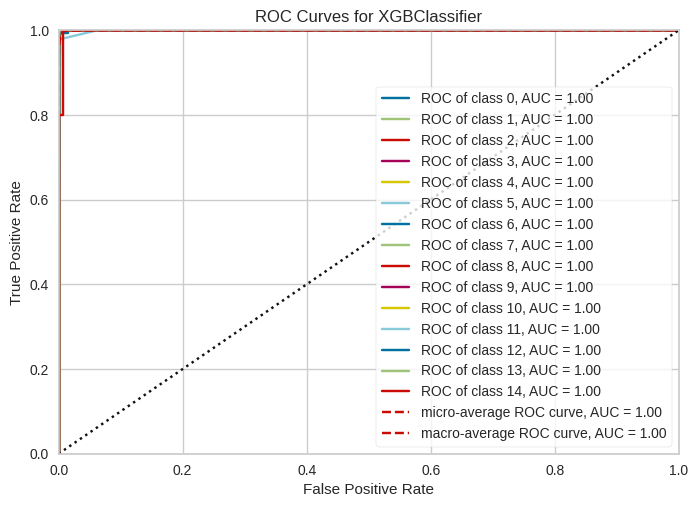

<Axes: title={'center': 'ROC Curves for XGBClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [77]:
model = wrap(bst)
visualizer = ROCAUC(model)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()

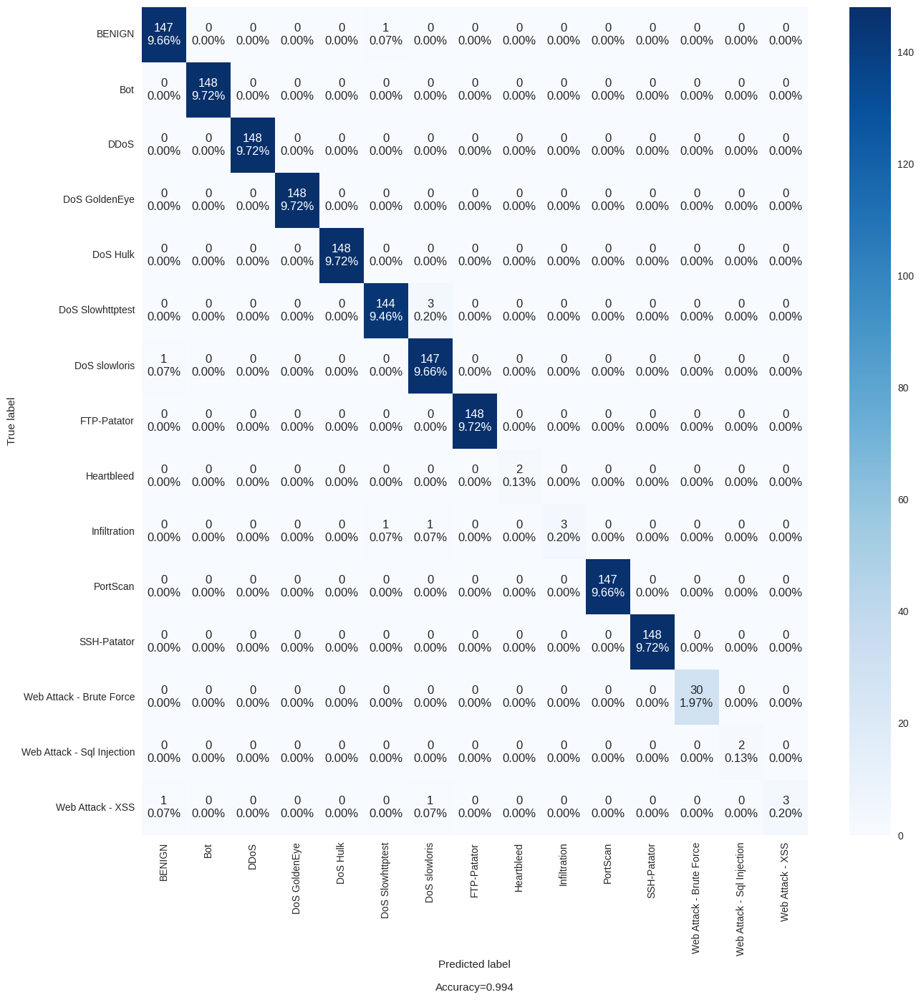

In [78]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(le.classes_)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [79]:
import xgboost as xgb

for tree_num in range(0,6):
    tree_viz = xgb.to_graphviz(bst, num_trees=0, rankdir='LR')
    tree_viz.render(f"bst_data/tree_{tree_num}")

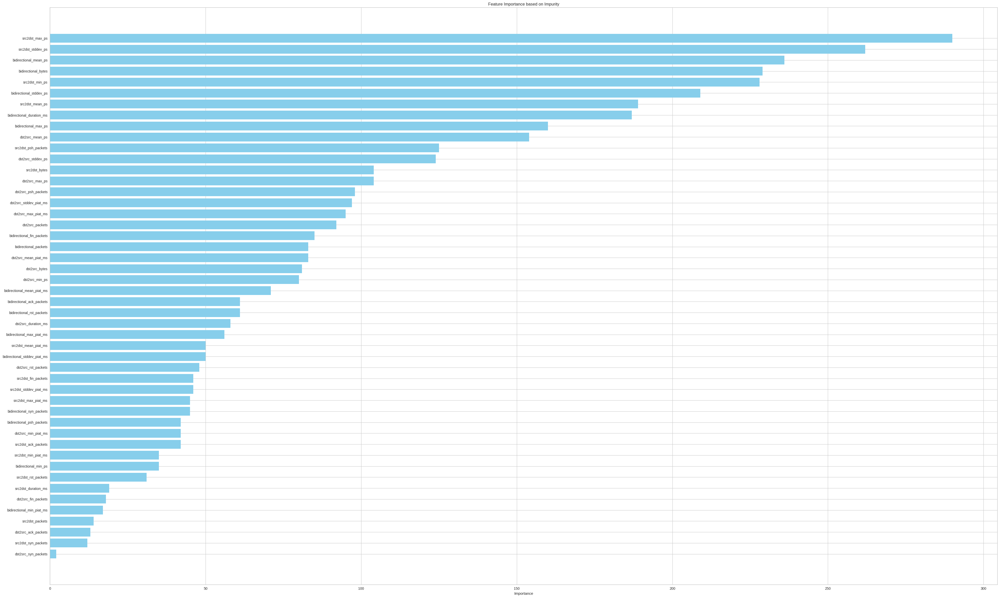

In [80]:
# Get feature importance based on impurity
impurity_importance = bst.get_booster().get_score(importance_type='weight')

# Convert the dictionary to a DataFrame
feature_importance_df = pd.DataFrame(list(impurity_importance.items()), columns=['Feature', 'Importance'])

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Reset index
feature_importance_df.reset_index(drop=True, inplace=True)

# Plotting feature importance
plt.figure(figsize=(40, 24))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.title('Feature Importance based on Impurity')
plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature at the top
plt.tight_layout()
plt.show()

Using interventional to stay "true to the model" since we will use this data to do feature reduction and we want also to understand how things work

In [81]:
%%time

explainer = fasttreeshap.TreeExplainer(bst, X_train, algorithm='auto', n_jobs=-1, feature_perturbation="interventional")
sv = explainer(X_train)

[18:02:40] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.
100%|===================| 91195/91290 [10:47<00:00]        

CPU times: user 10min 44s, sys: 1.38 s, total: 10min 46s
Wall time: 10min 47s


In [82]:
le.classes_

array(['BENIGN', 'Bot', 'DDoS', 'DoS GoldenEye', 'DoS Hulk',
       'DoS Slowhttptest', 'DoS slowloris', 'FTP-Patator', 'Heartbleed',
       'Infiltration', 'PortScan', 'SSH-Patator',
       'Web Attack - Brute Force', 'Web Attack - Sql Injection',
       'Web Attack - XSS'], dtype=object)

In [83]:
def make_plot(i):
    exp = Explanation(sv.values[:,:,i], 
                  sv.base_values[:,i], 
                  data=X_train, 
                  feature_names=X_res.columns)

    plots.bar(exp, max_display=20, show=False)
    # plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
    plt.show()
    plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)
    plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)
    plots.bar(exp.abs.cohorts(2).mean(0))
    plots.heatmap(exp, instance_order=exp.sum(1))

## Benign shap

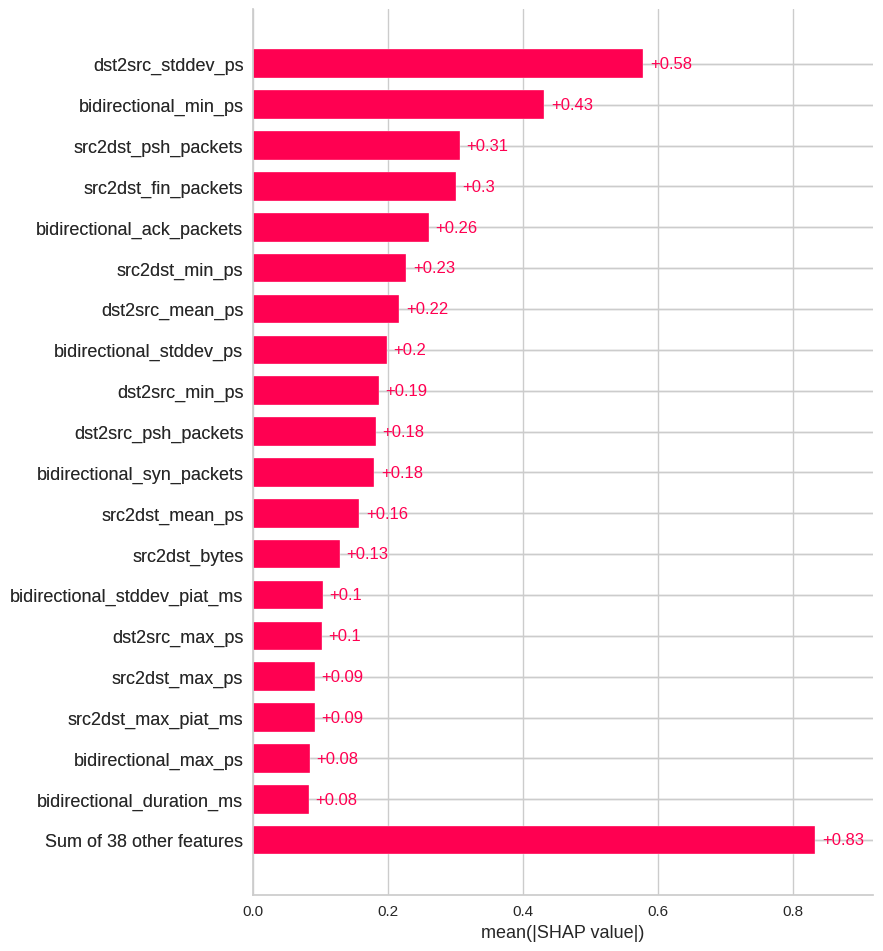

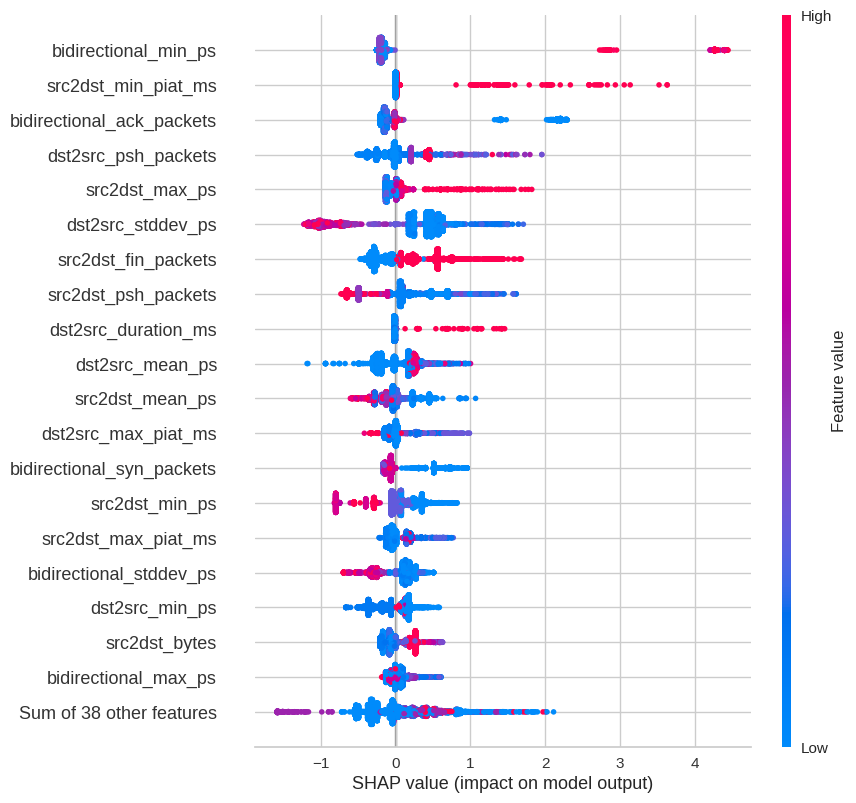

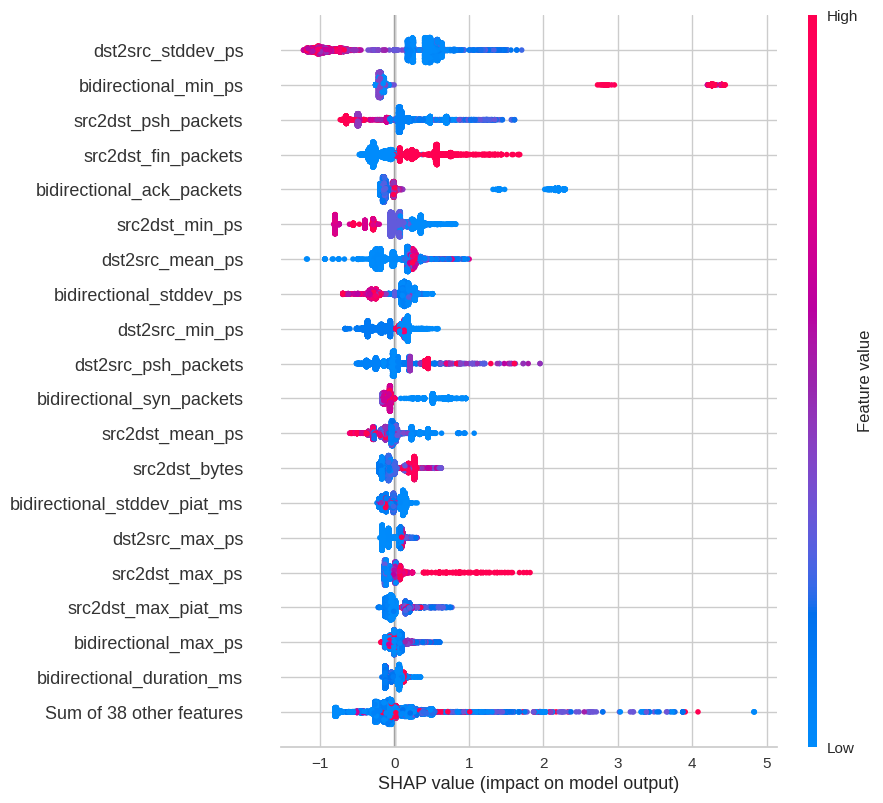

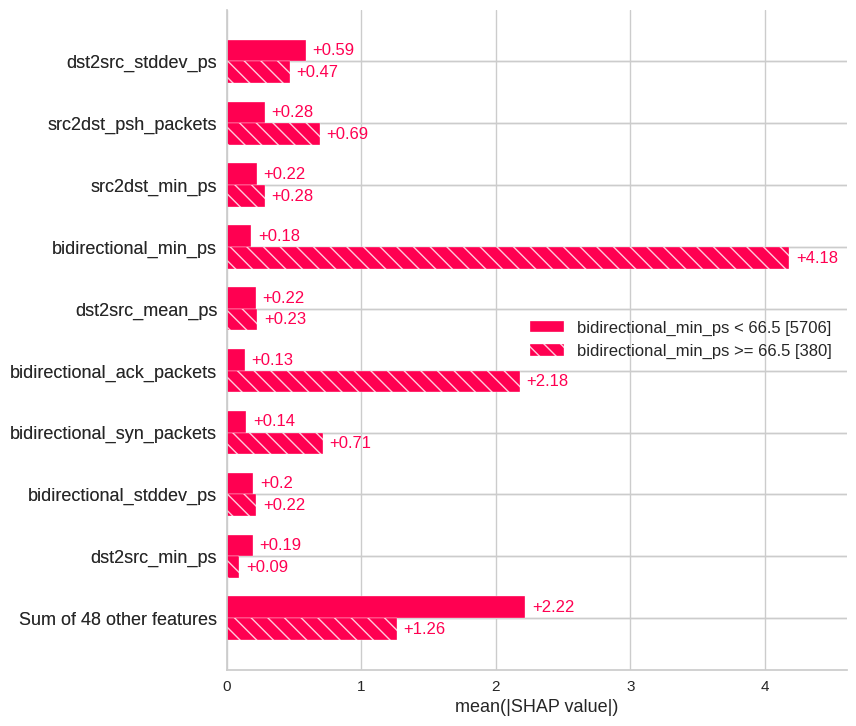

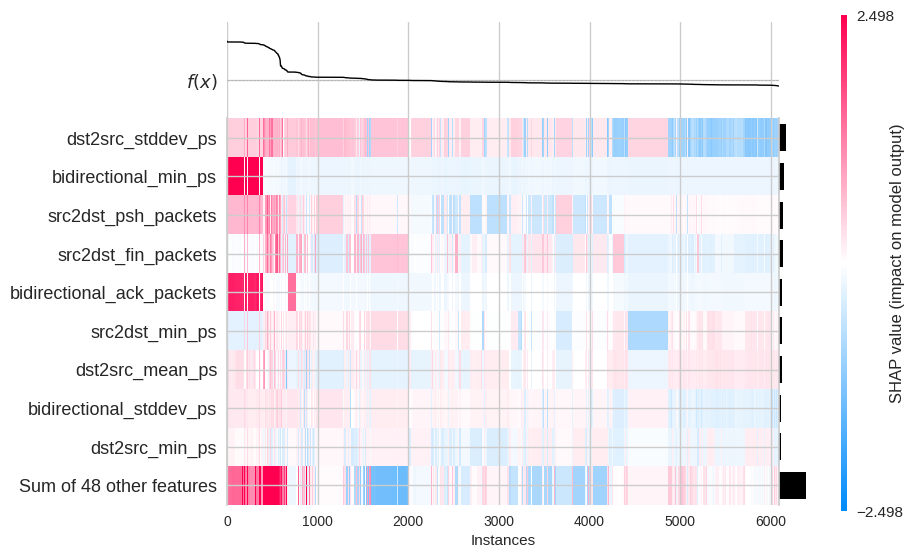

In [84]:
make_plot(0)

## Bot shap

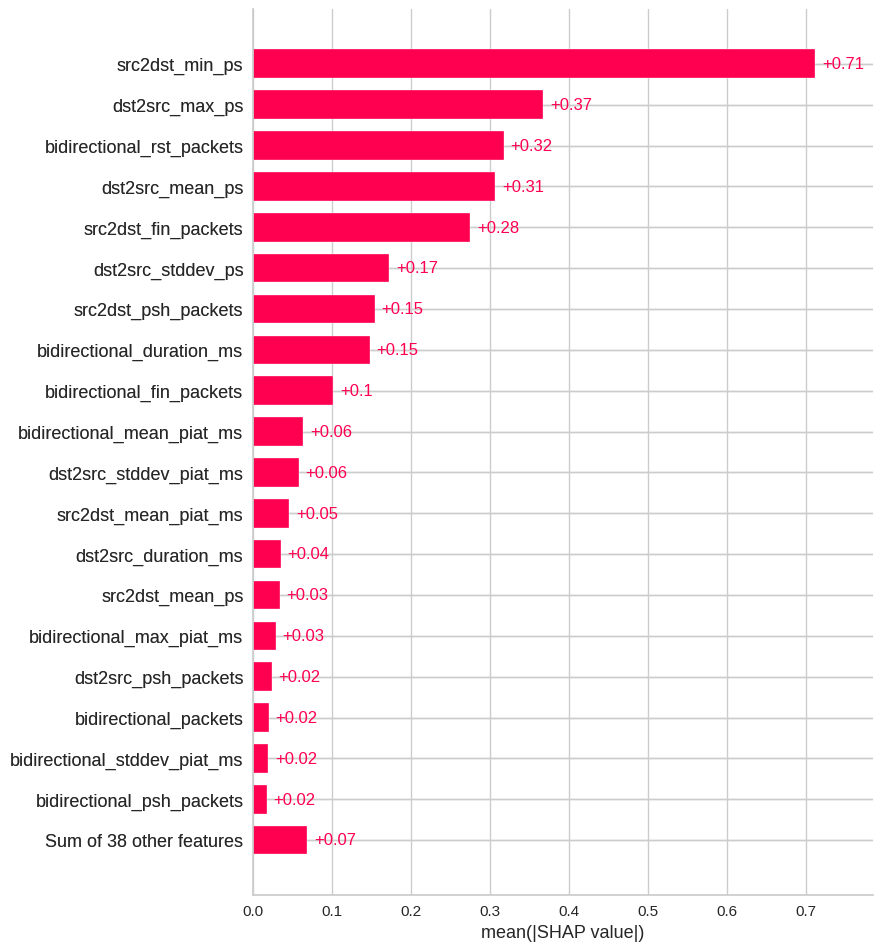

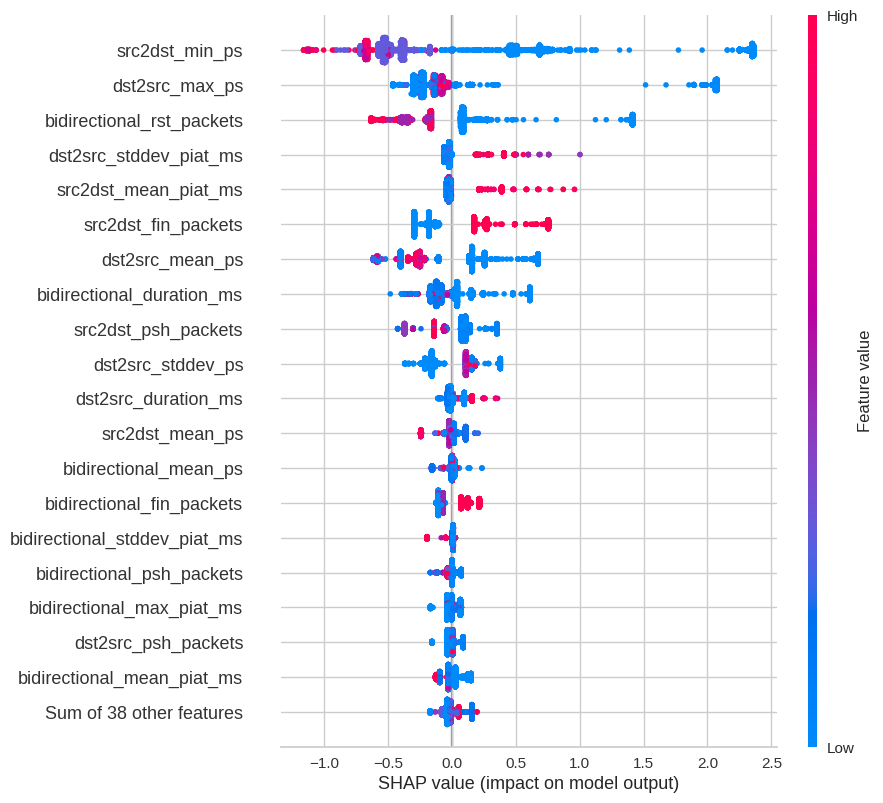

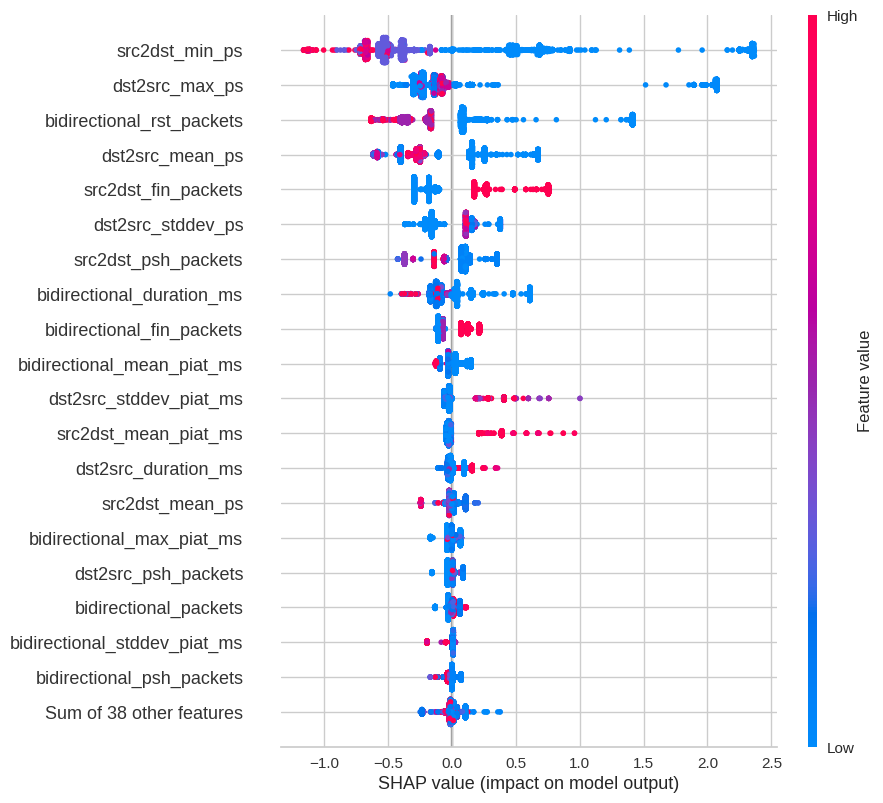

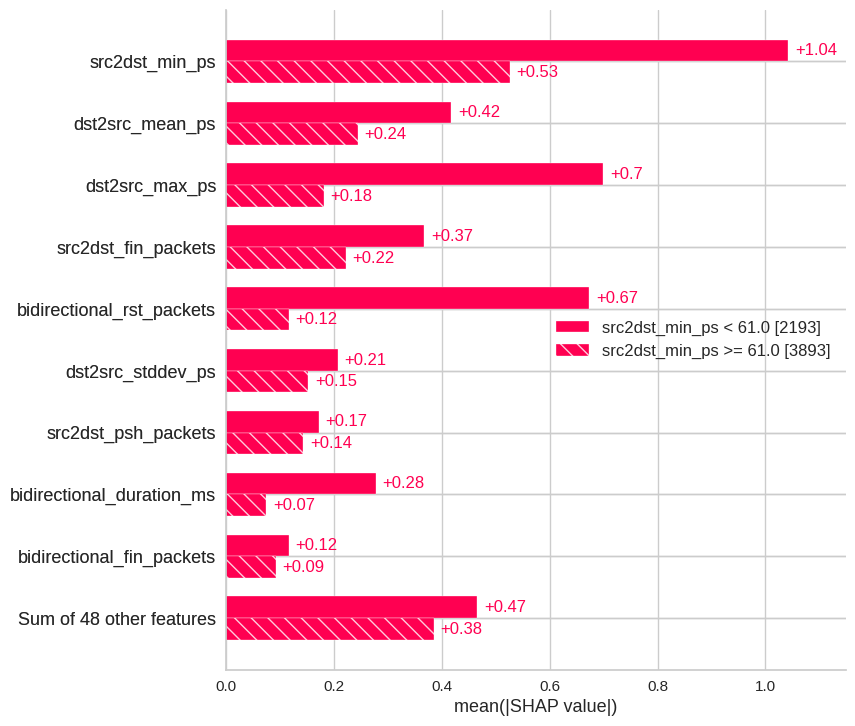

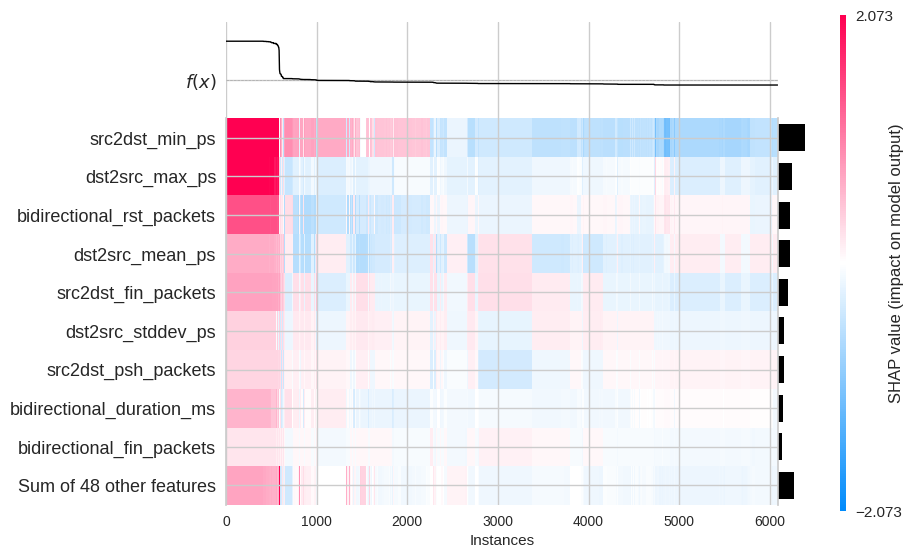

In [85]:
make_plot(1)

## DDoS shap

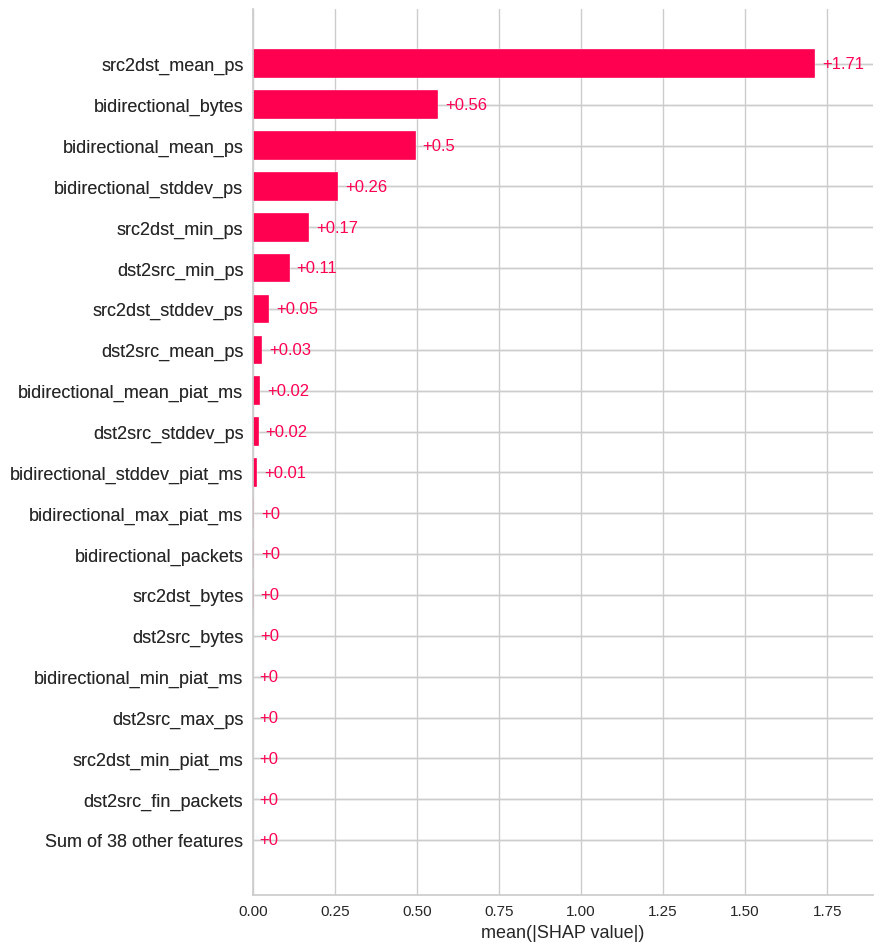

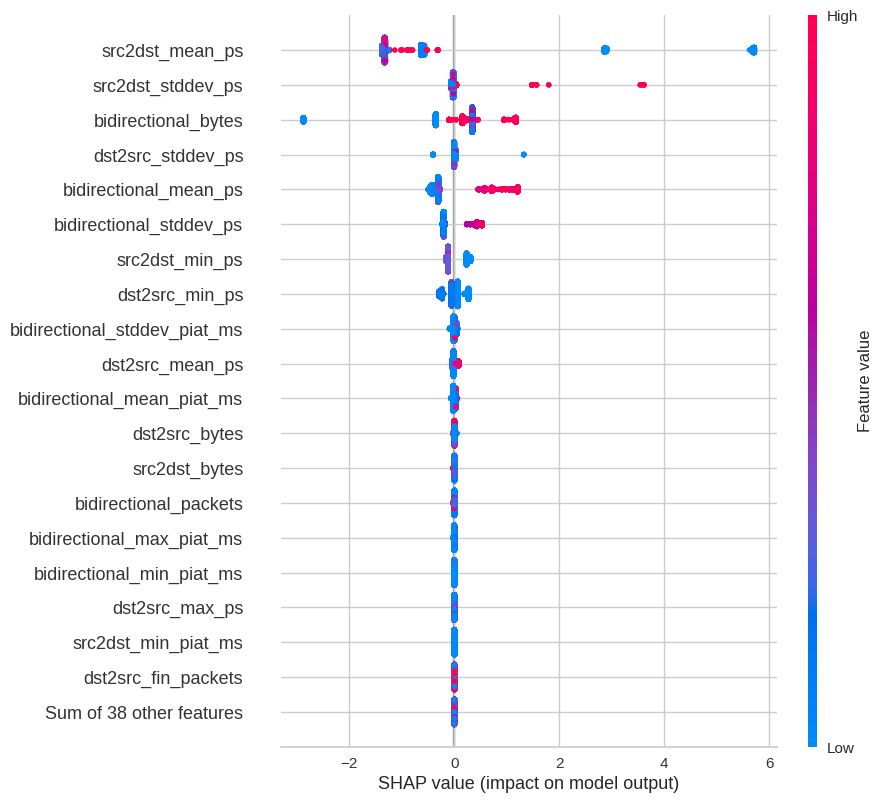

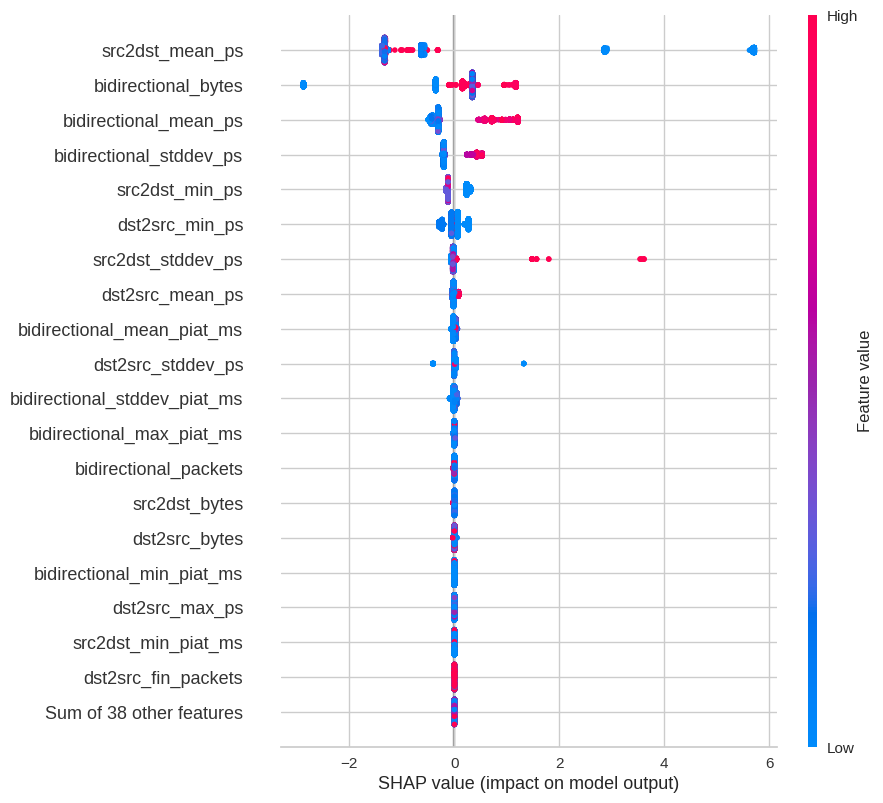

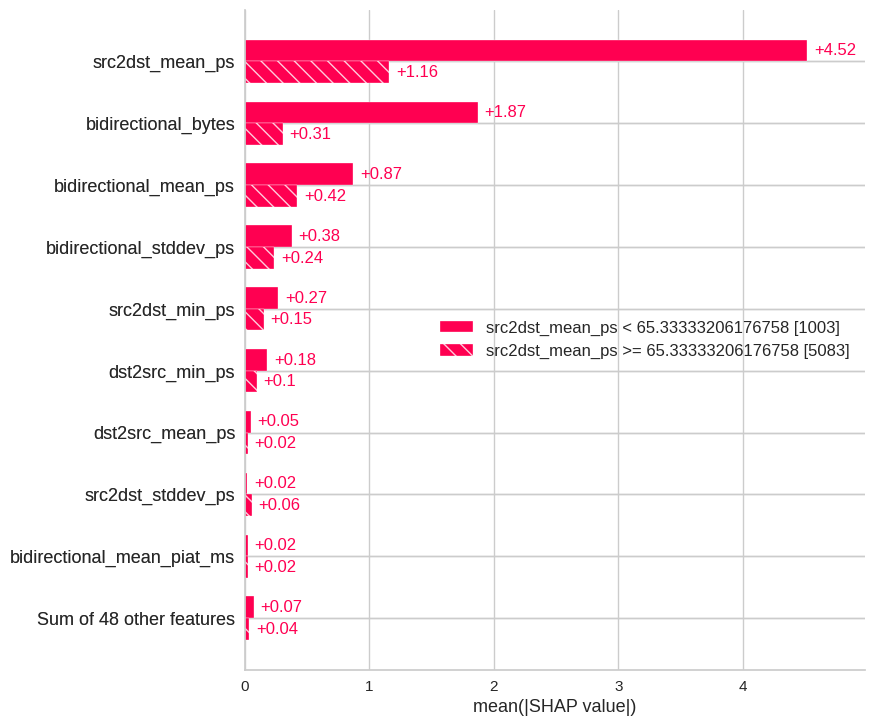

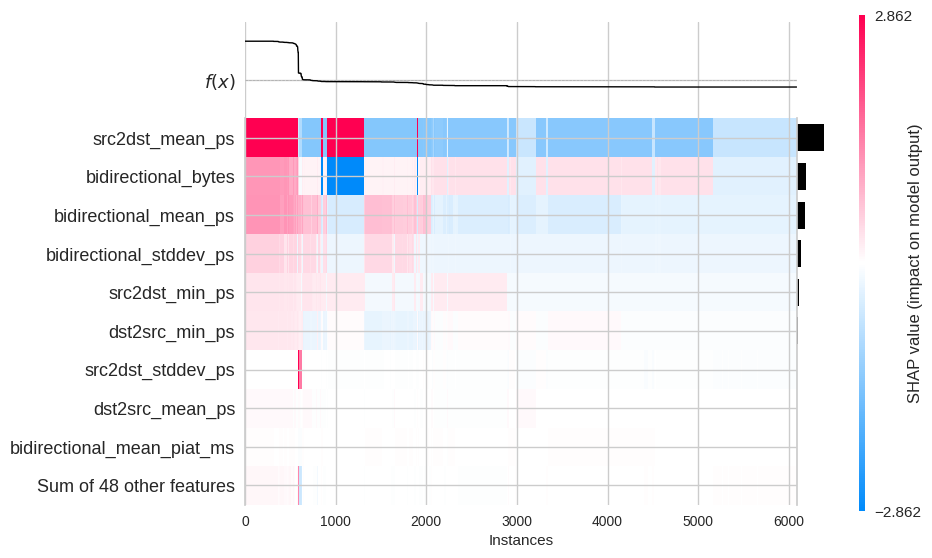

In [86]:
make_plot(2)

## DoS GoldenEye shap

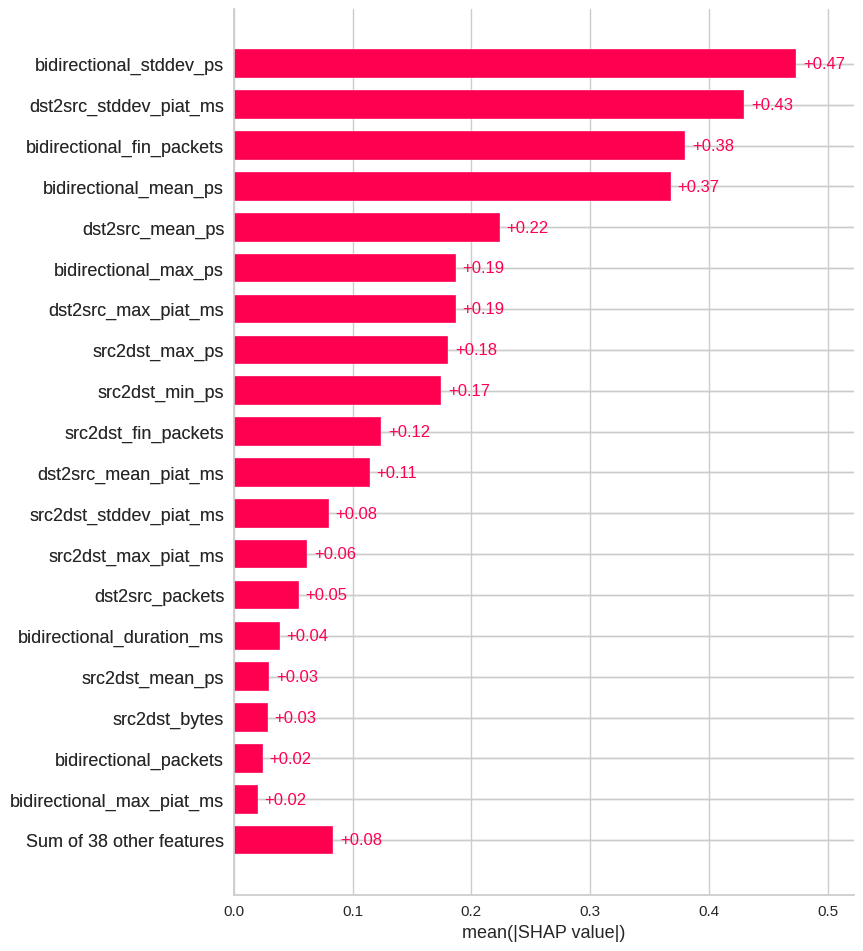

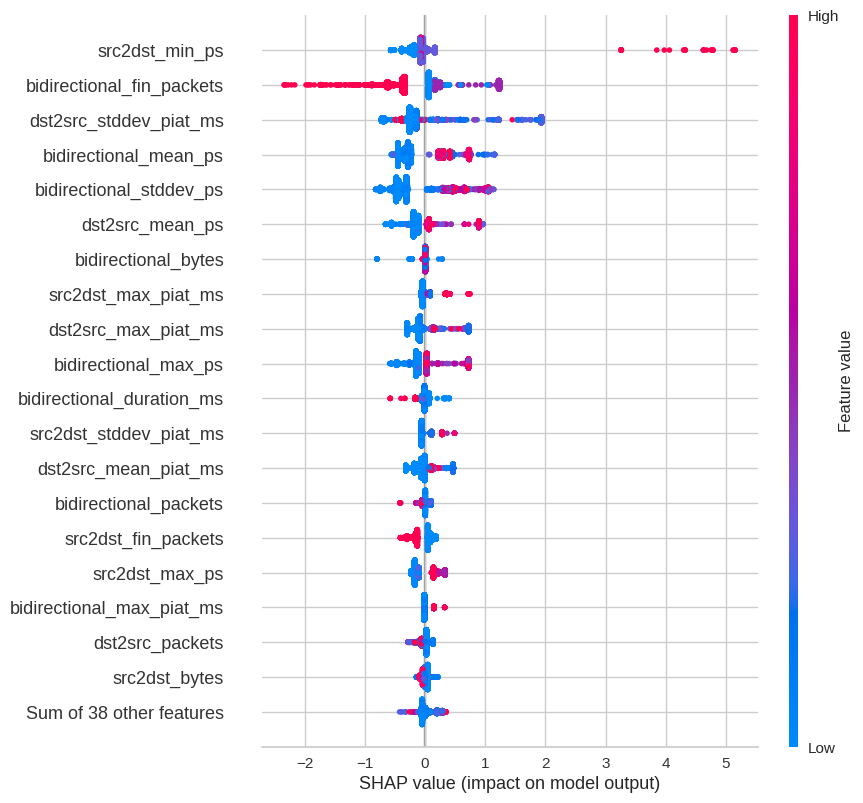

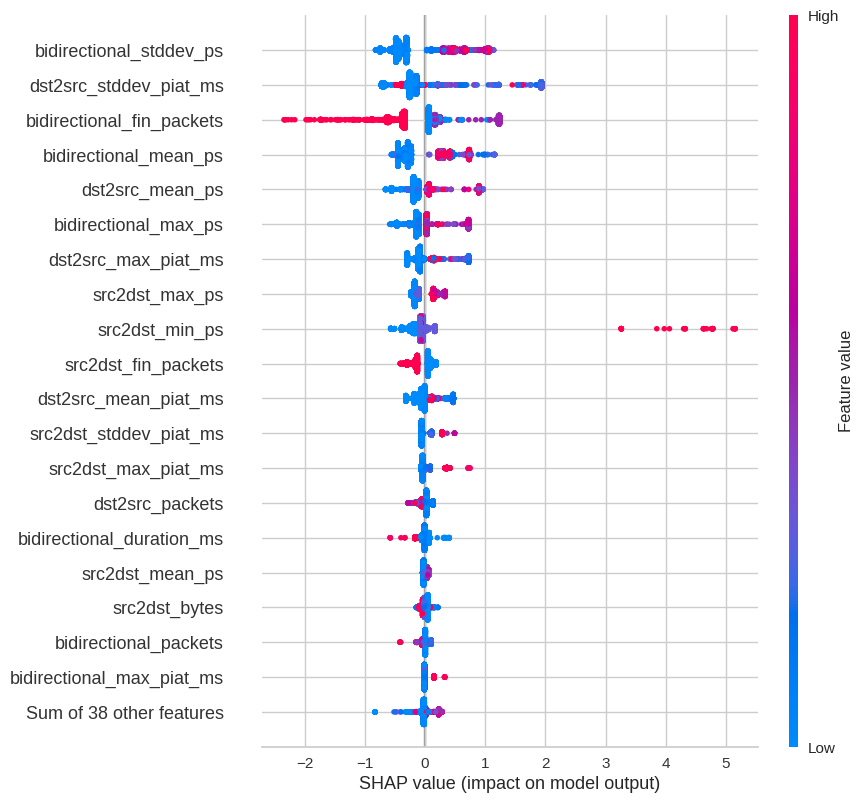

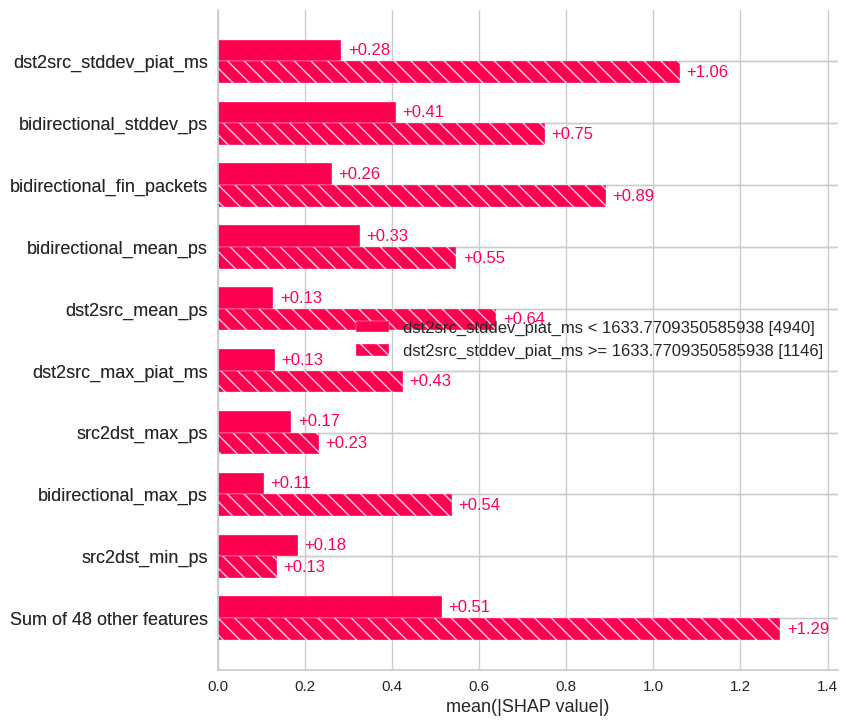

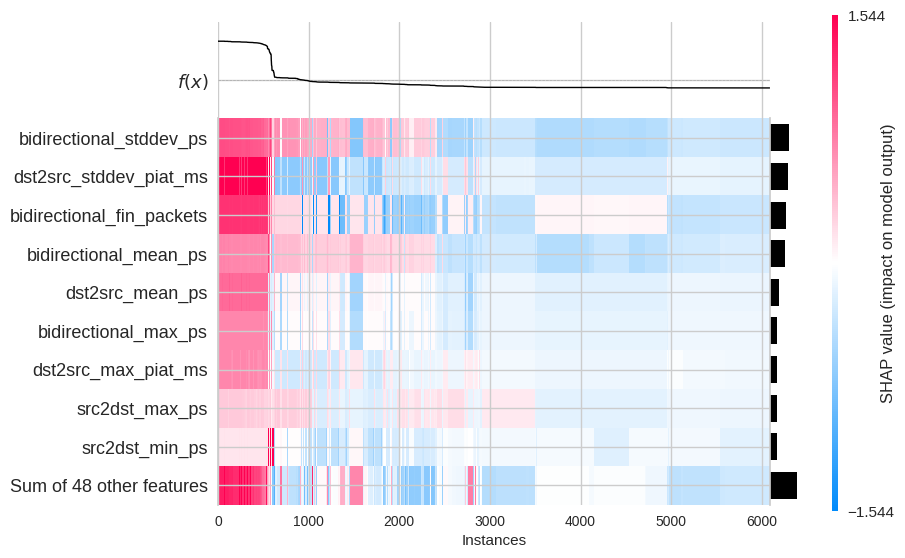

In [87]:
make_plot(3)

## DoS Hulk shap

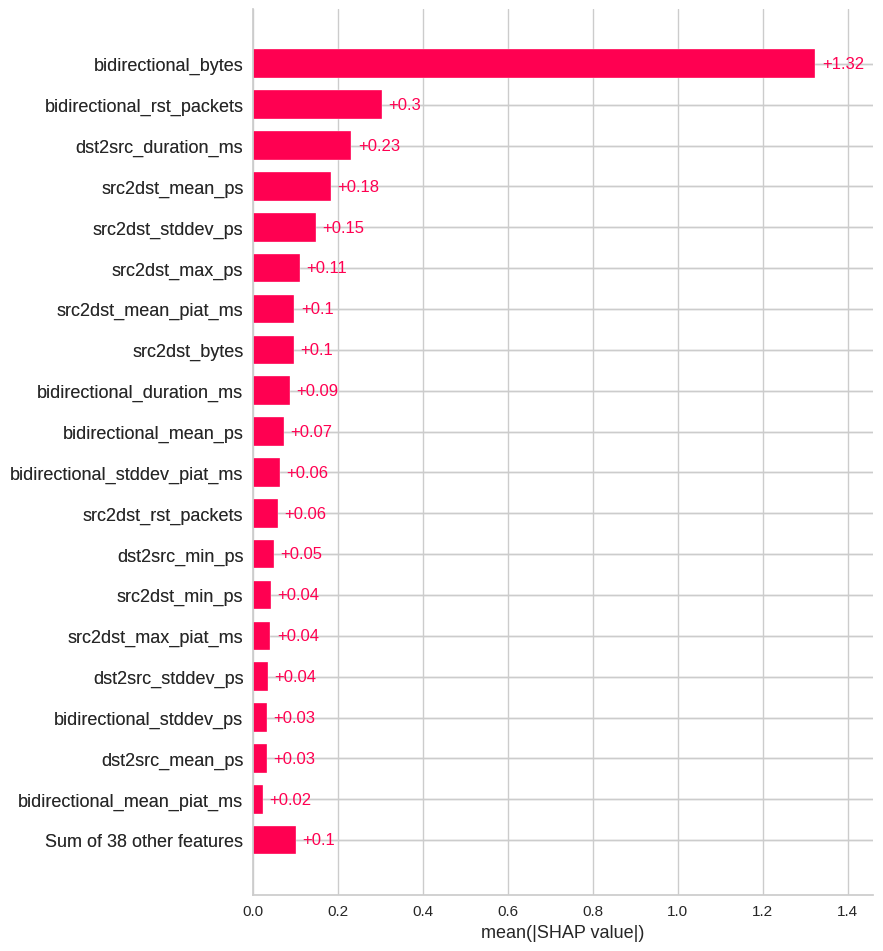

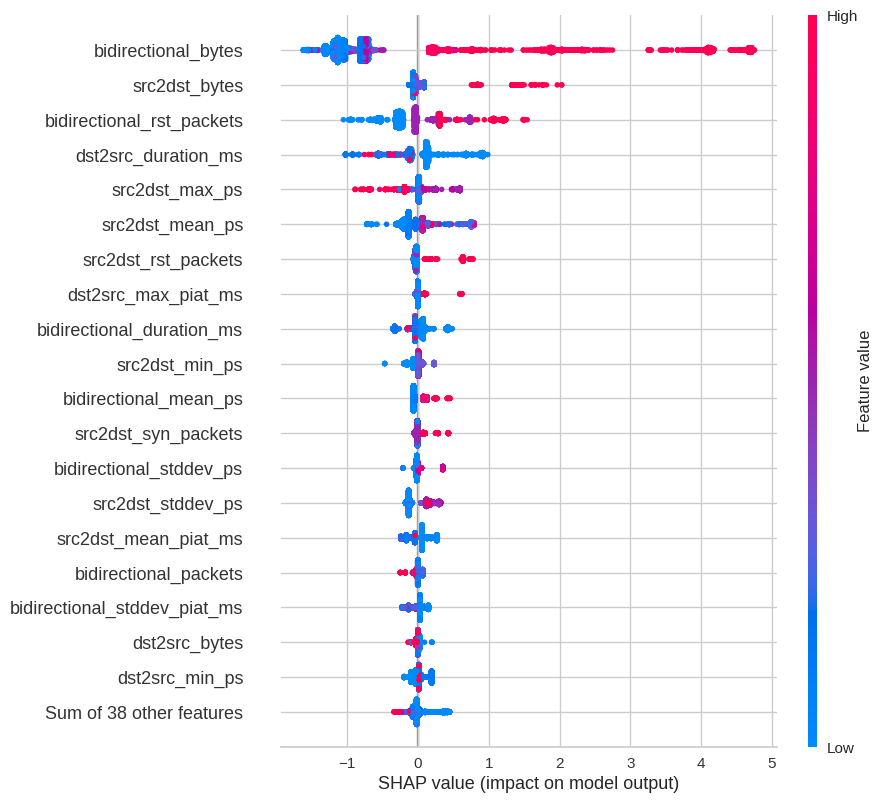

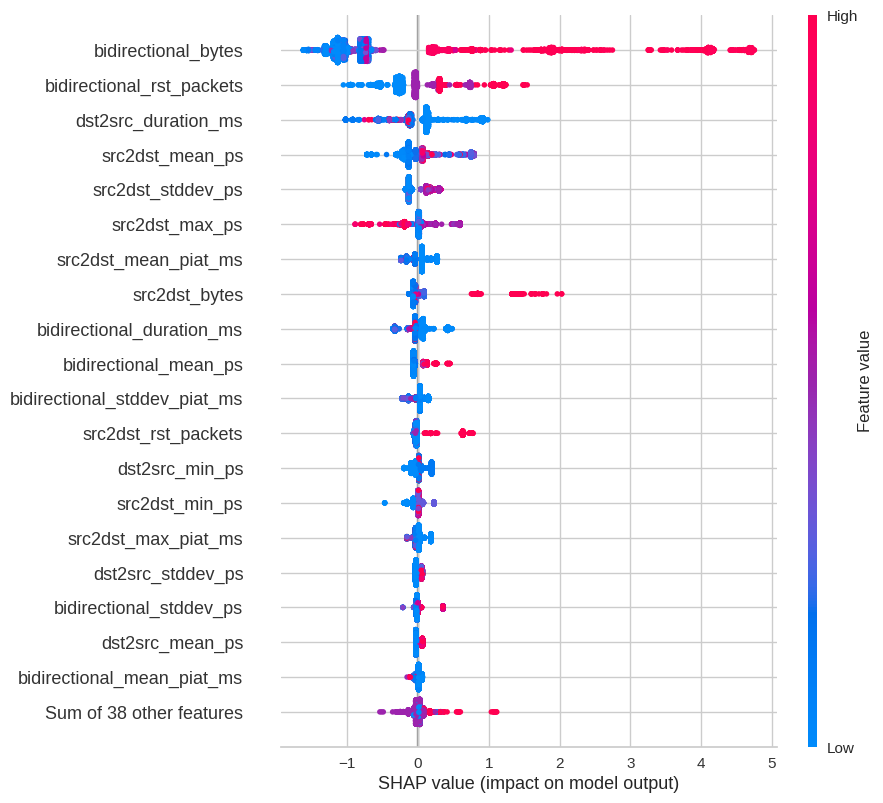

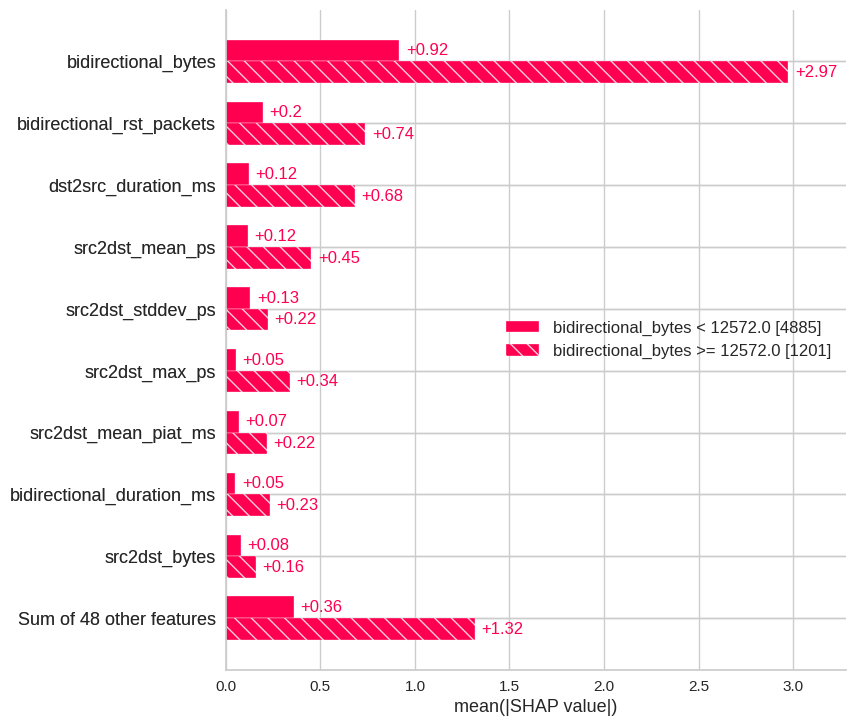

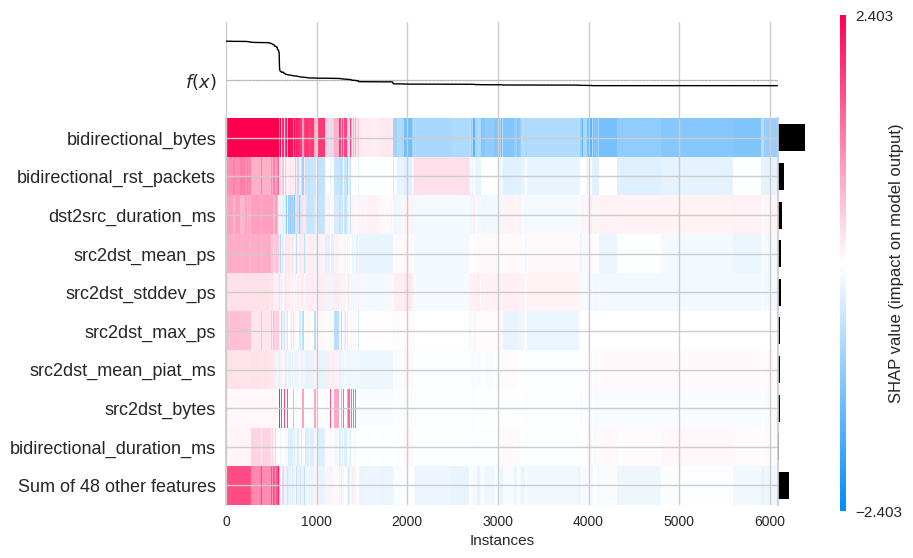

In [88]:
make_plot(4)

## DoS Slowhttptest shap

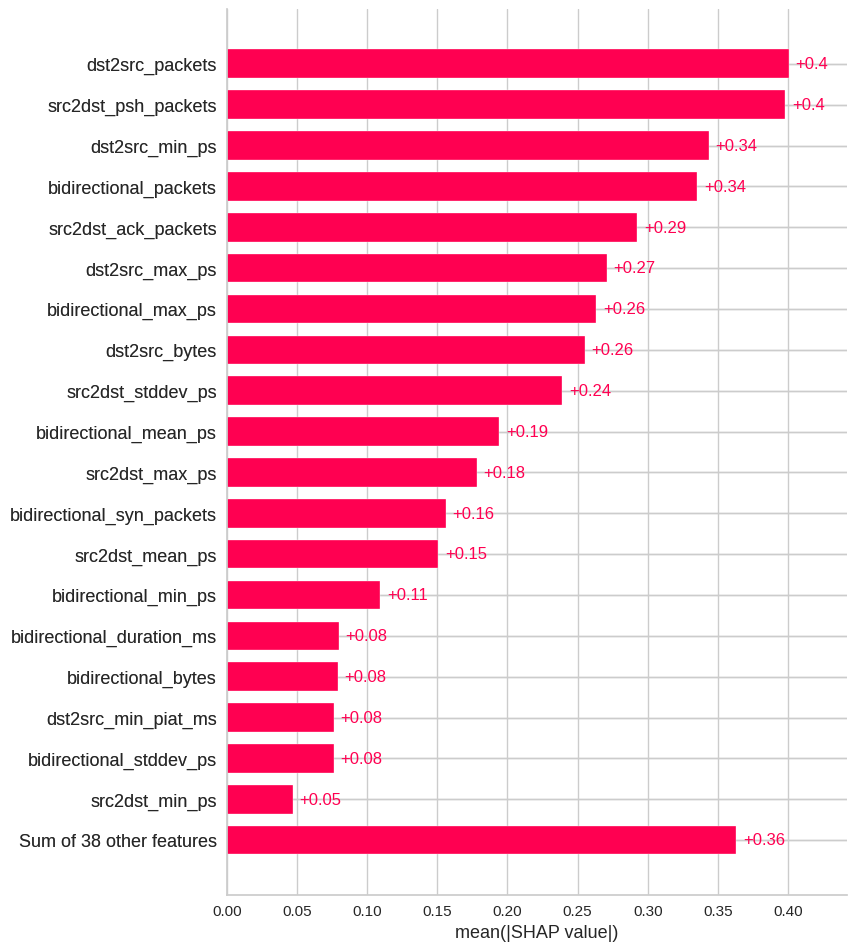

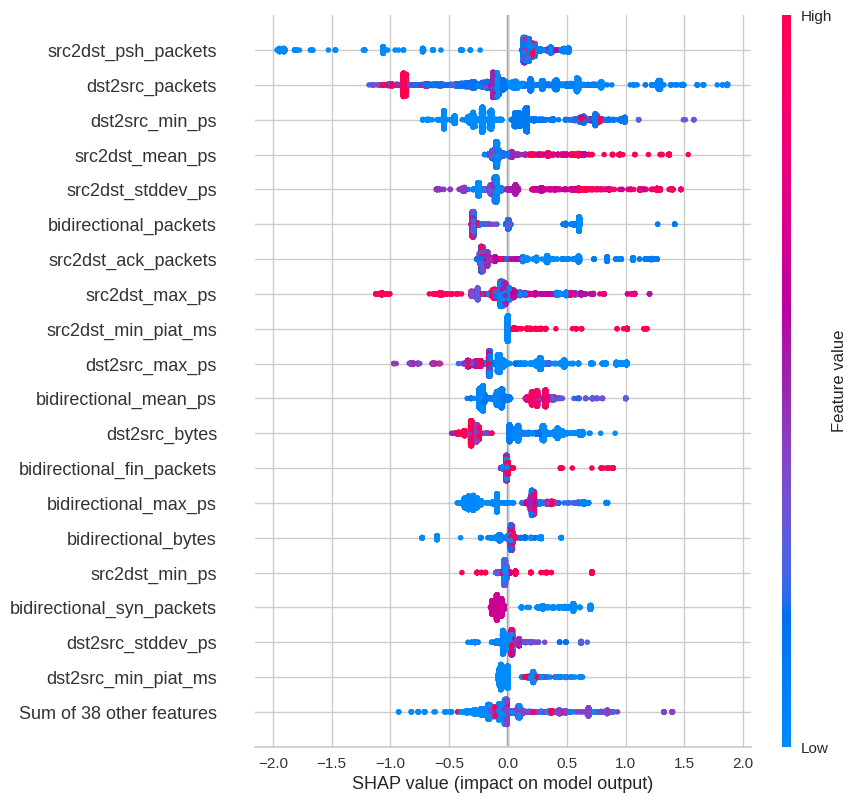

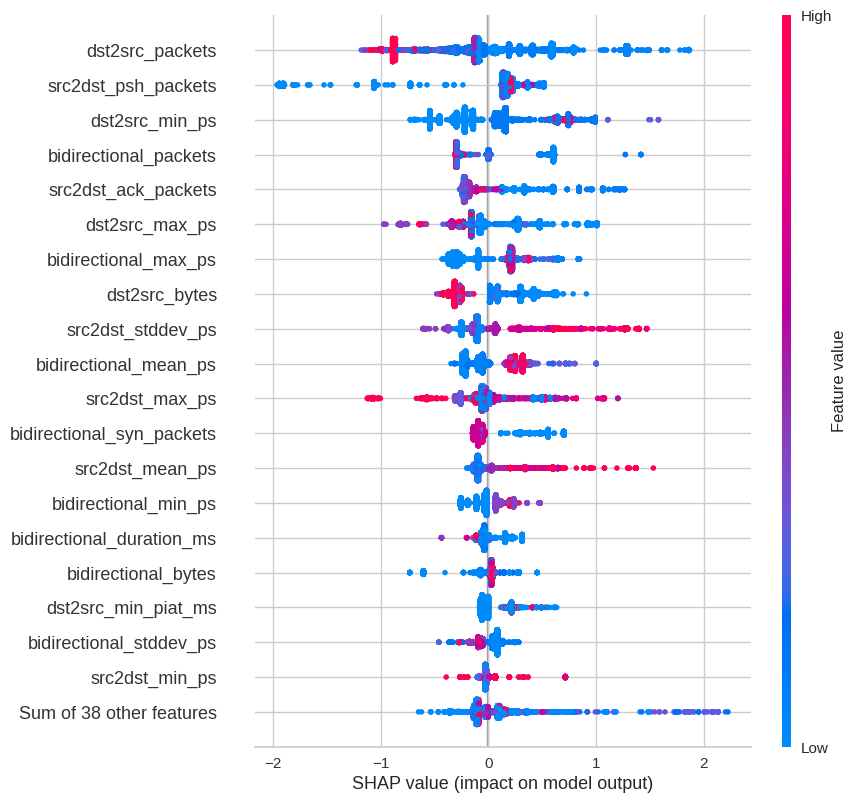

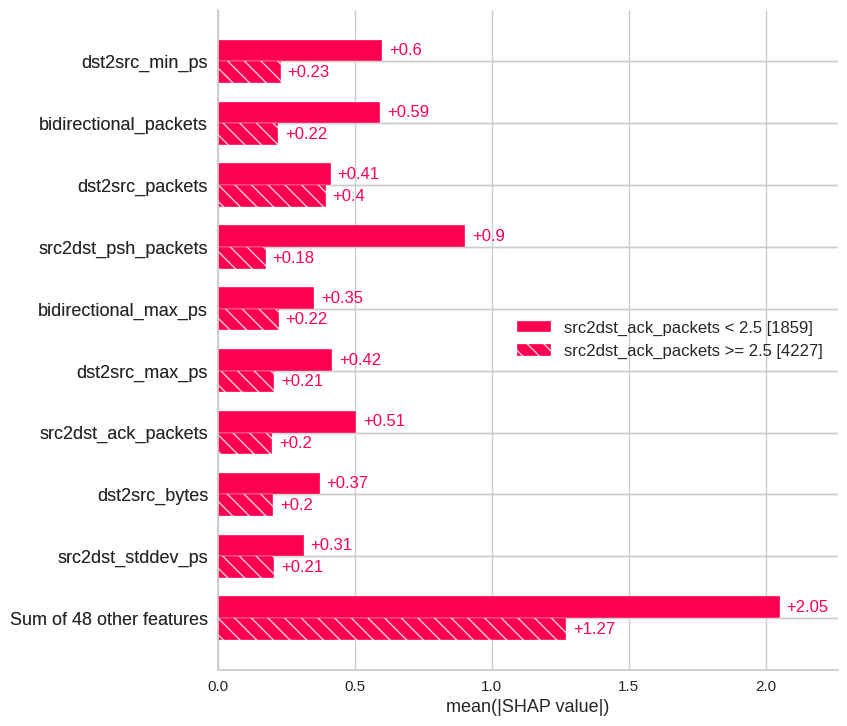

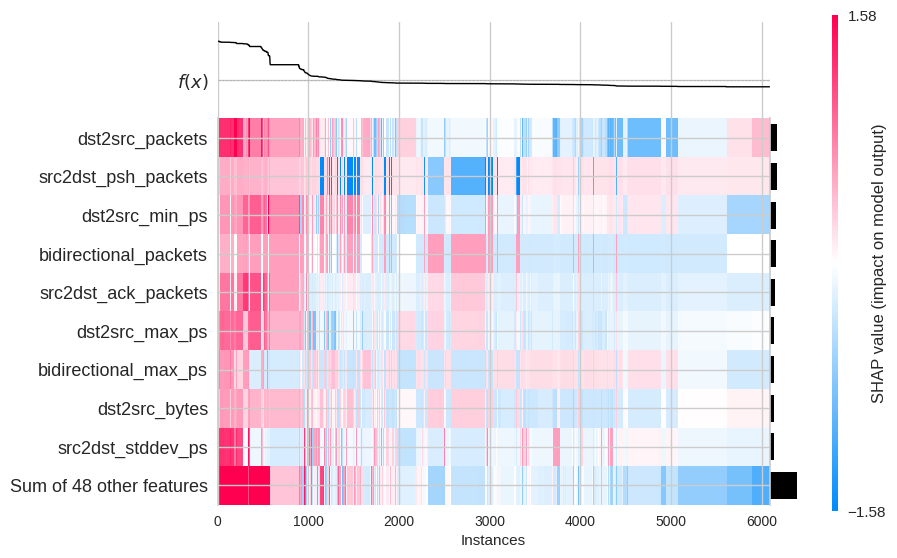

In [89]:
make_plot(5)

## DoS slowloris shap

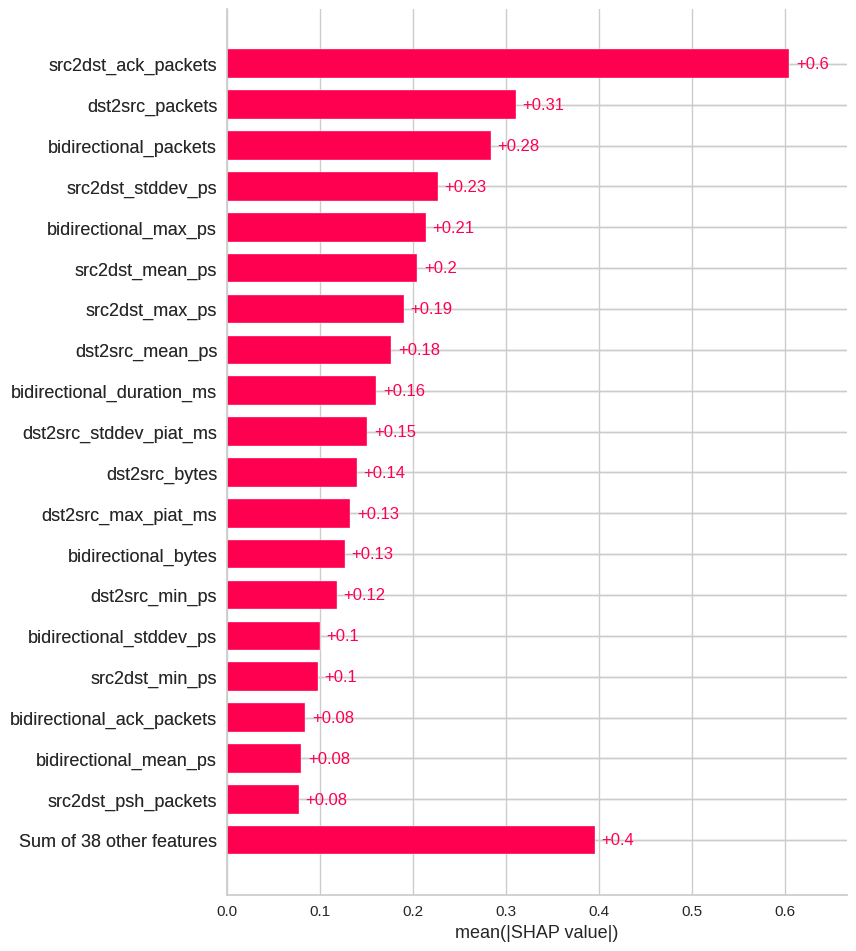

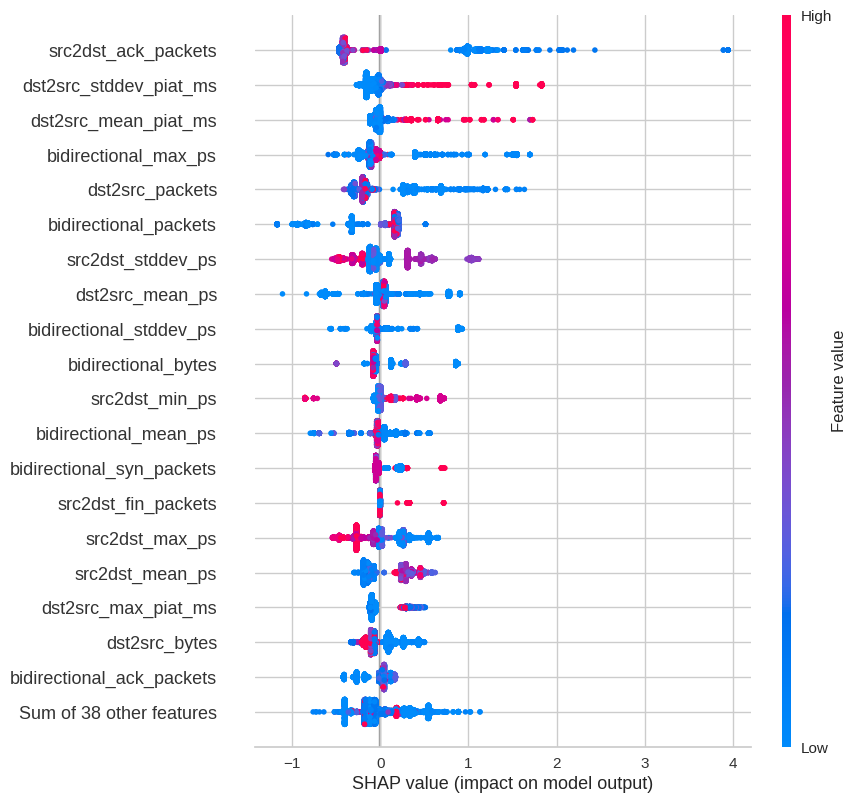

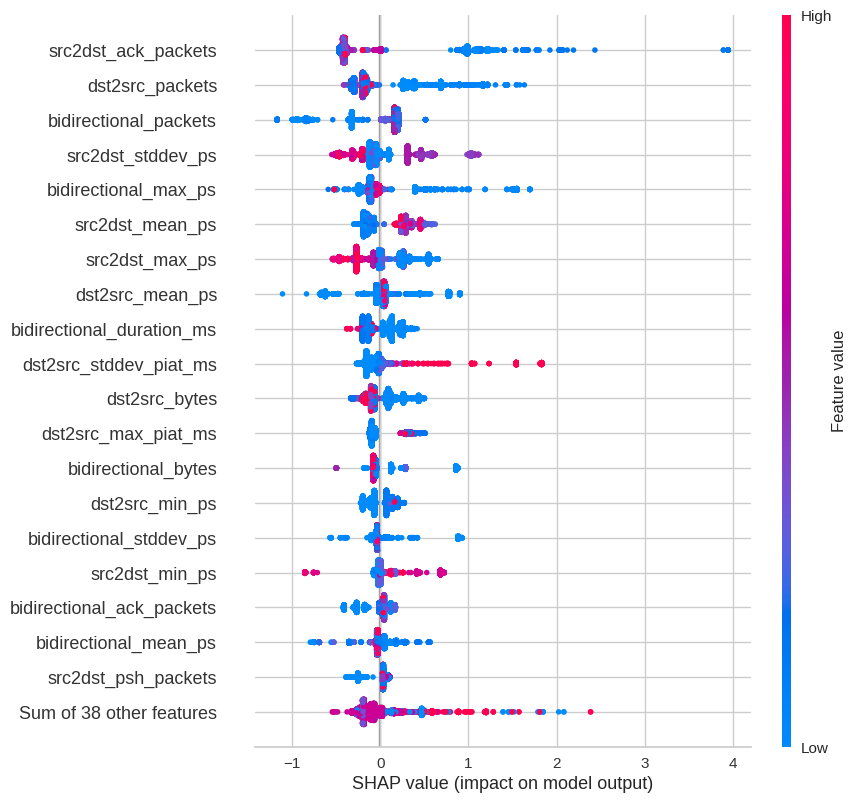

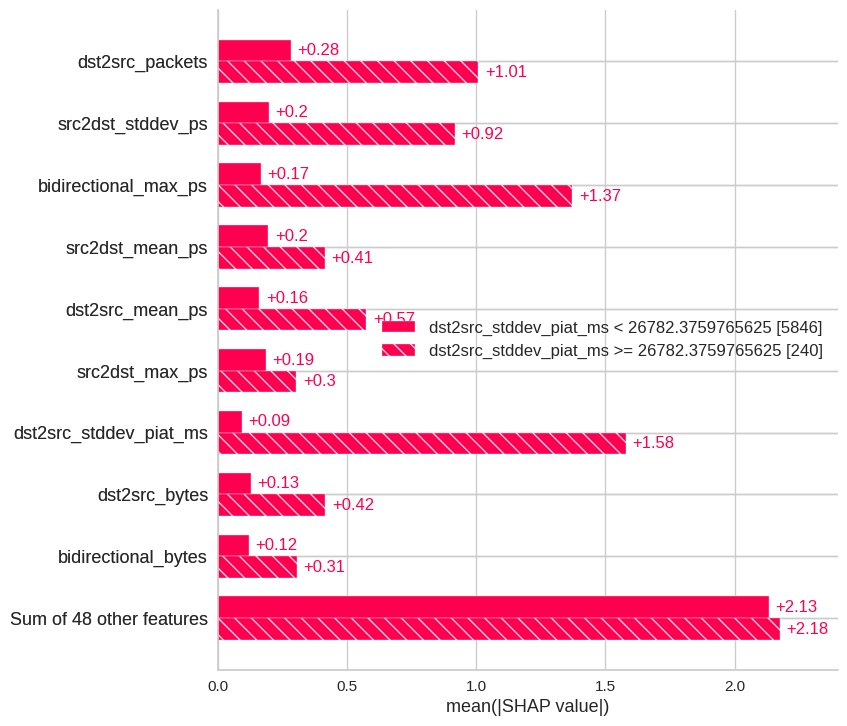

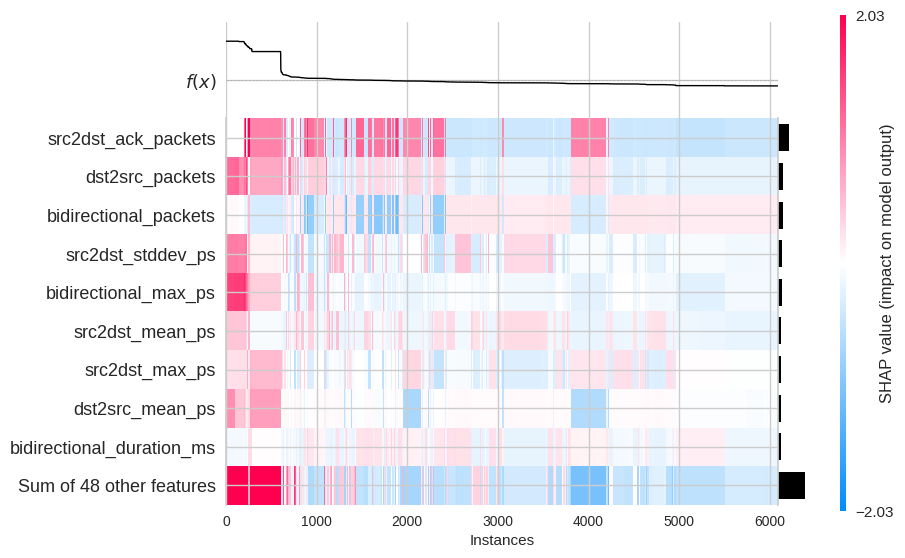

In [90]:
make_plot(6)

## FTP-Patator shap

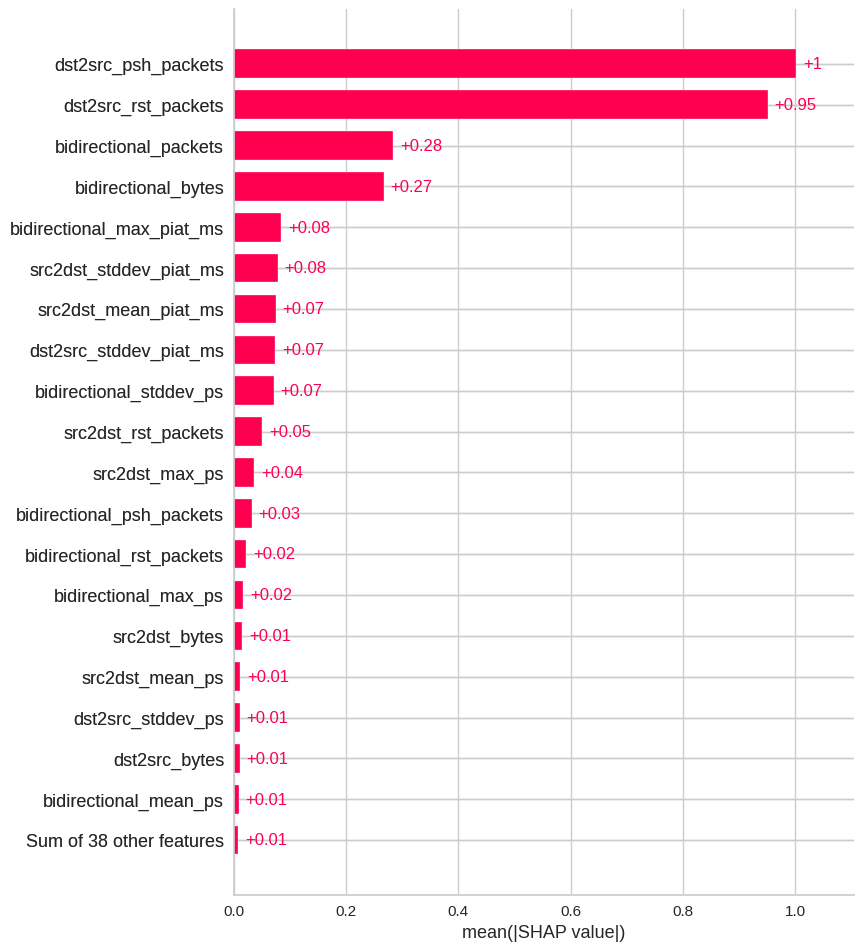

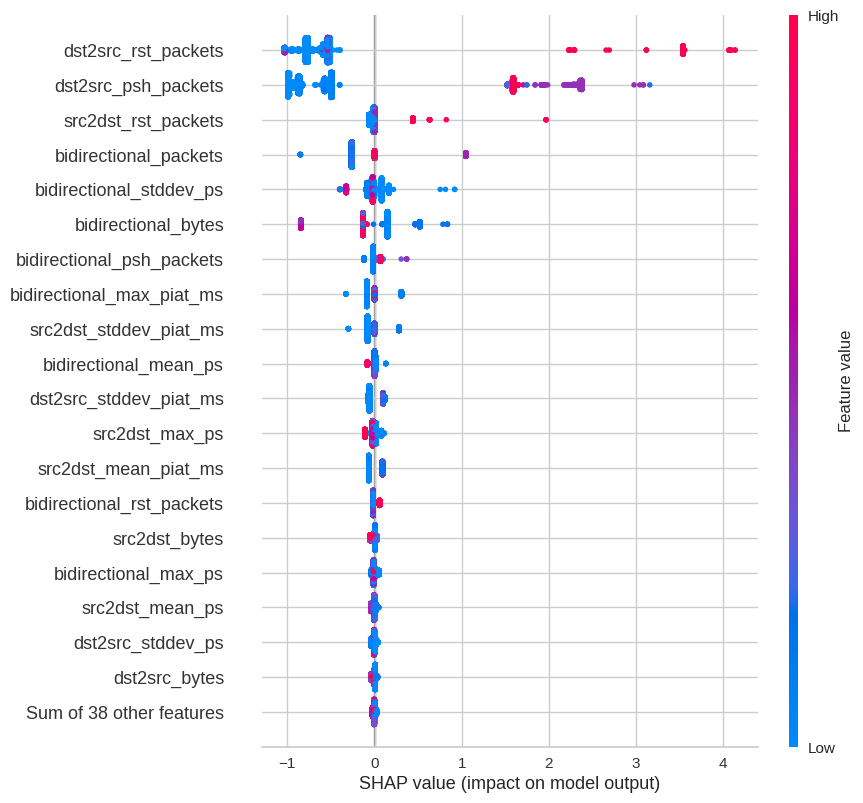

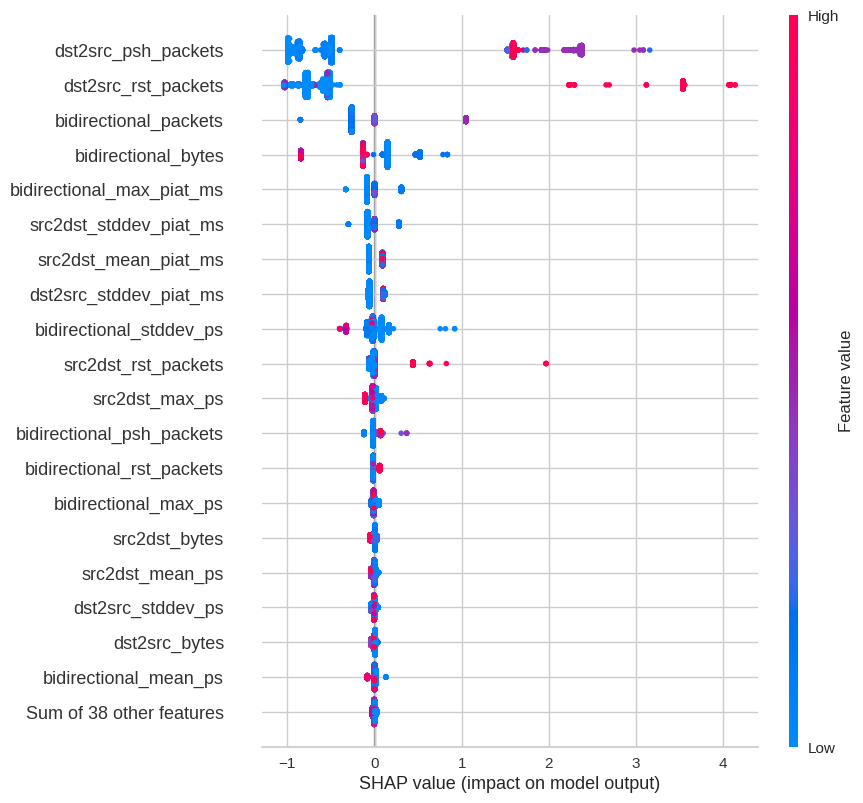

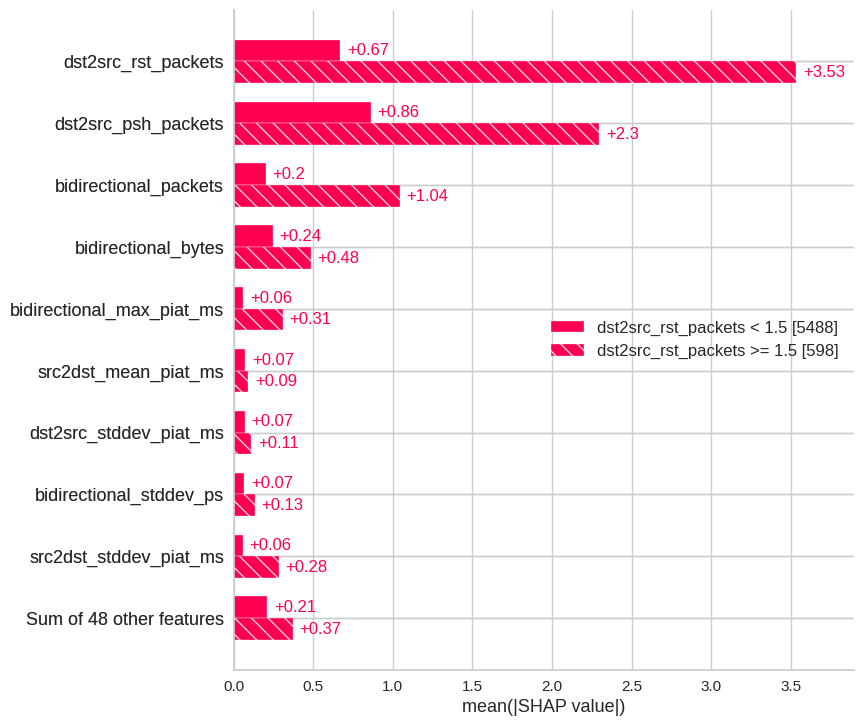

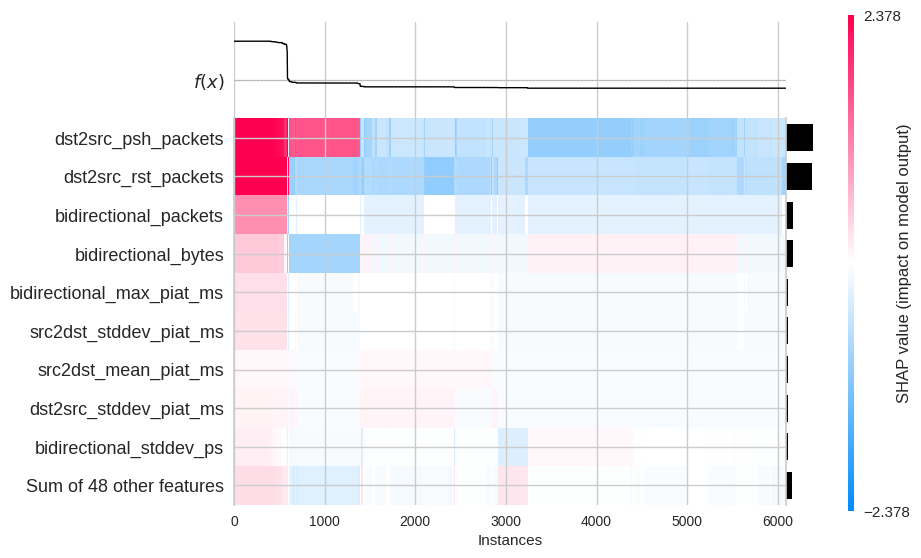

In [91]:
make_plot(7)

## Heartbleed shap

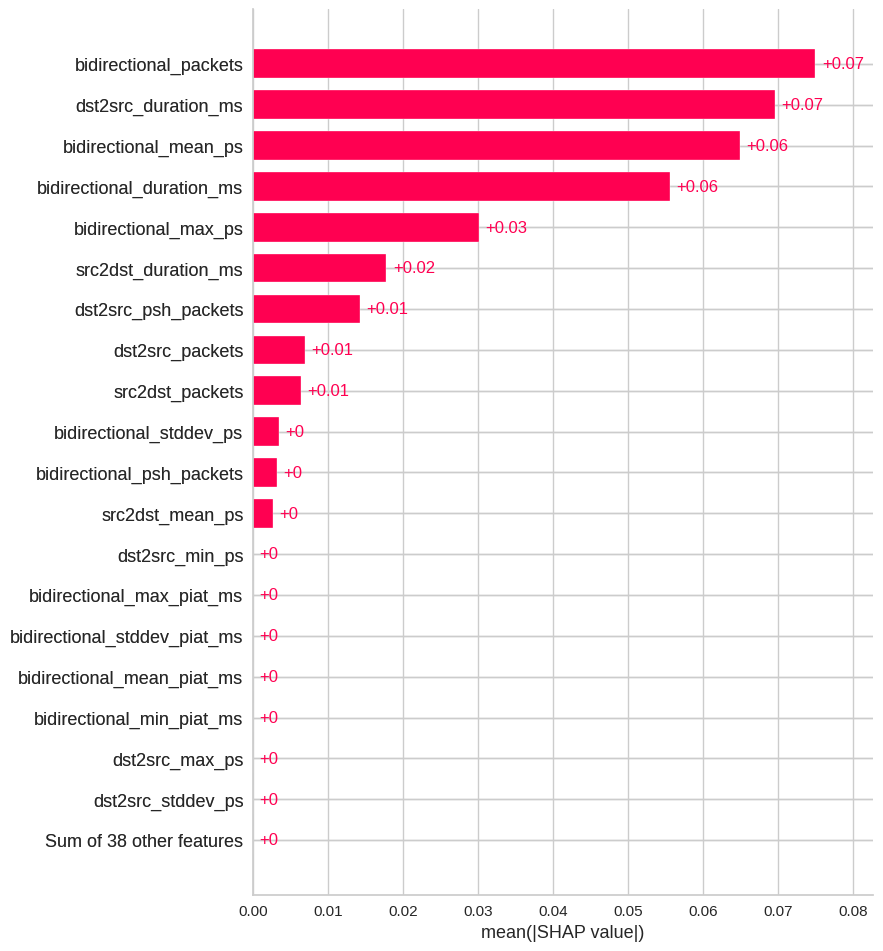

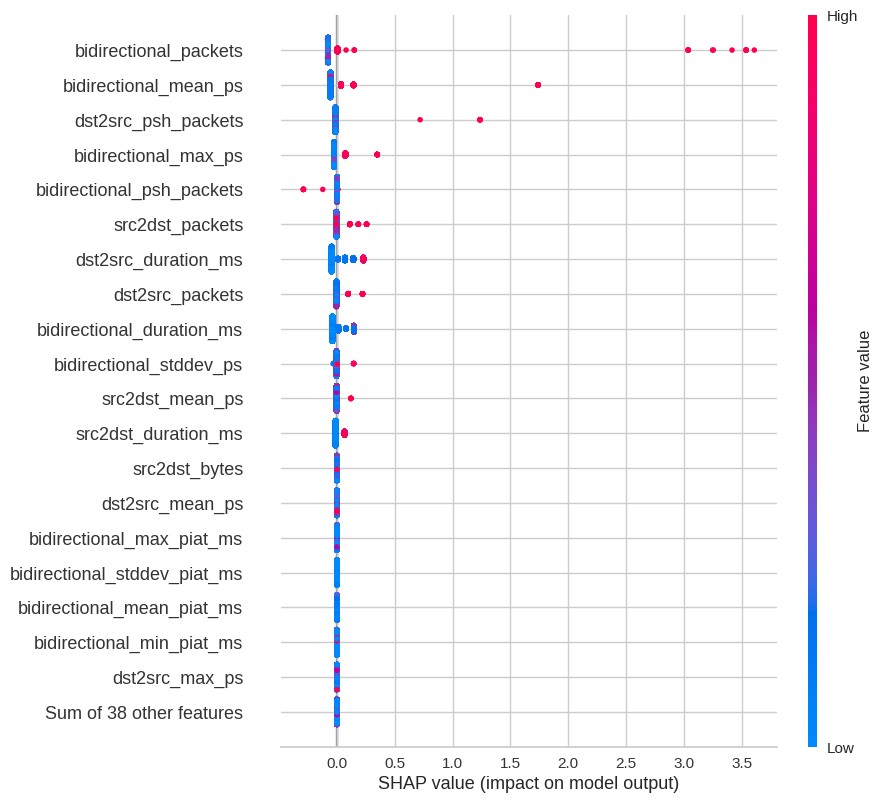

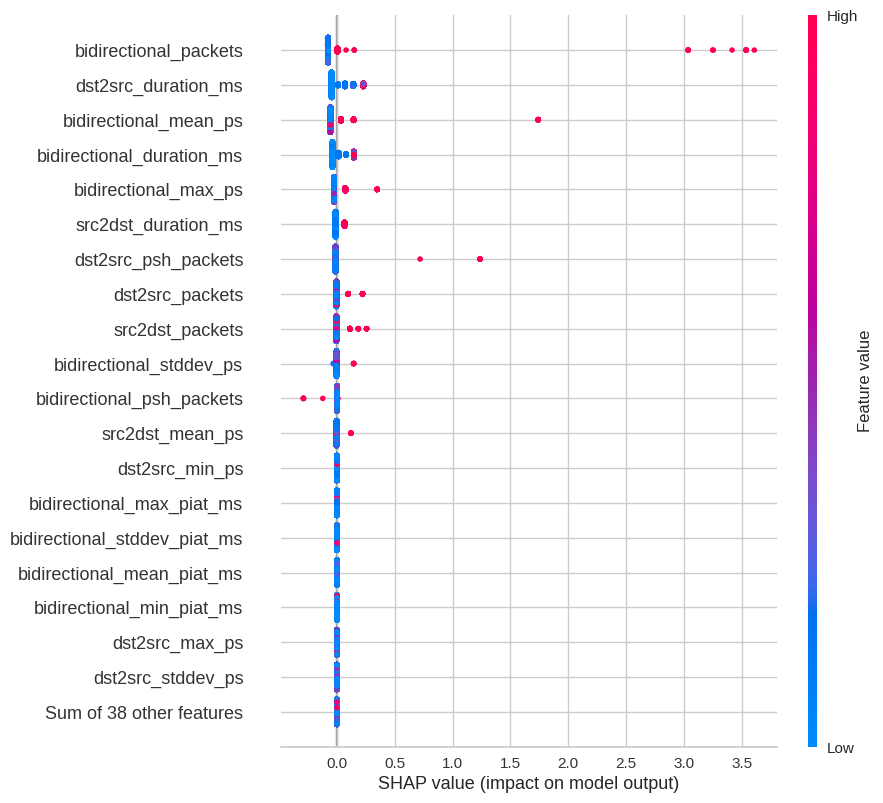

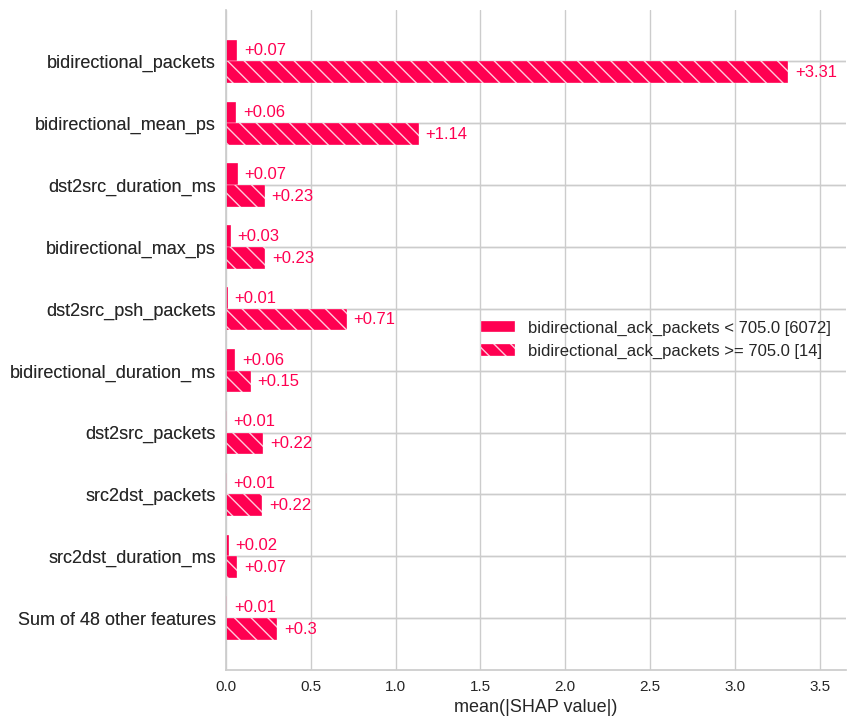

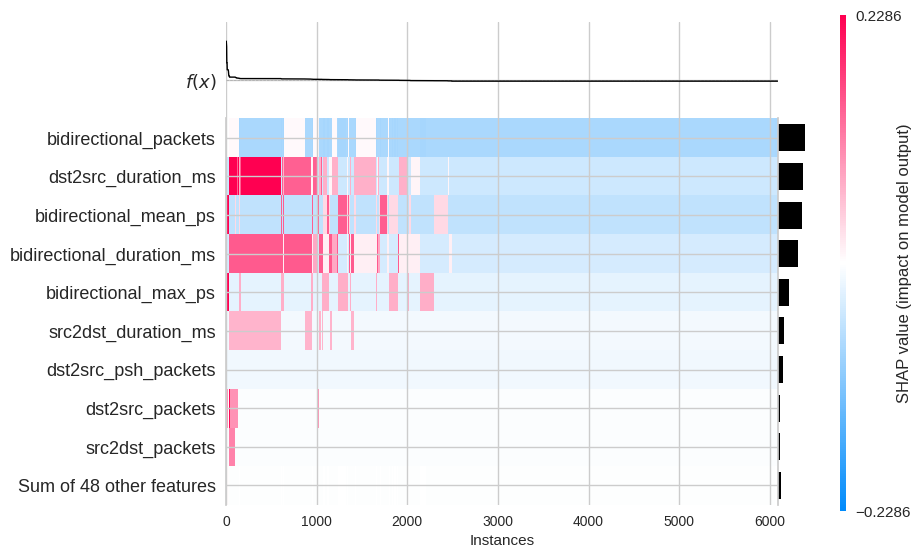

In [92]:
make_plot(8)

## Infiltration shap

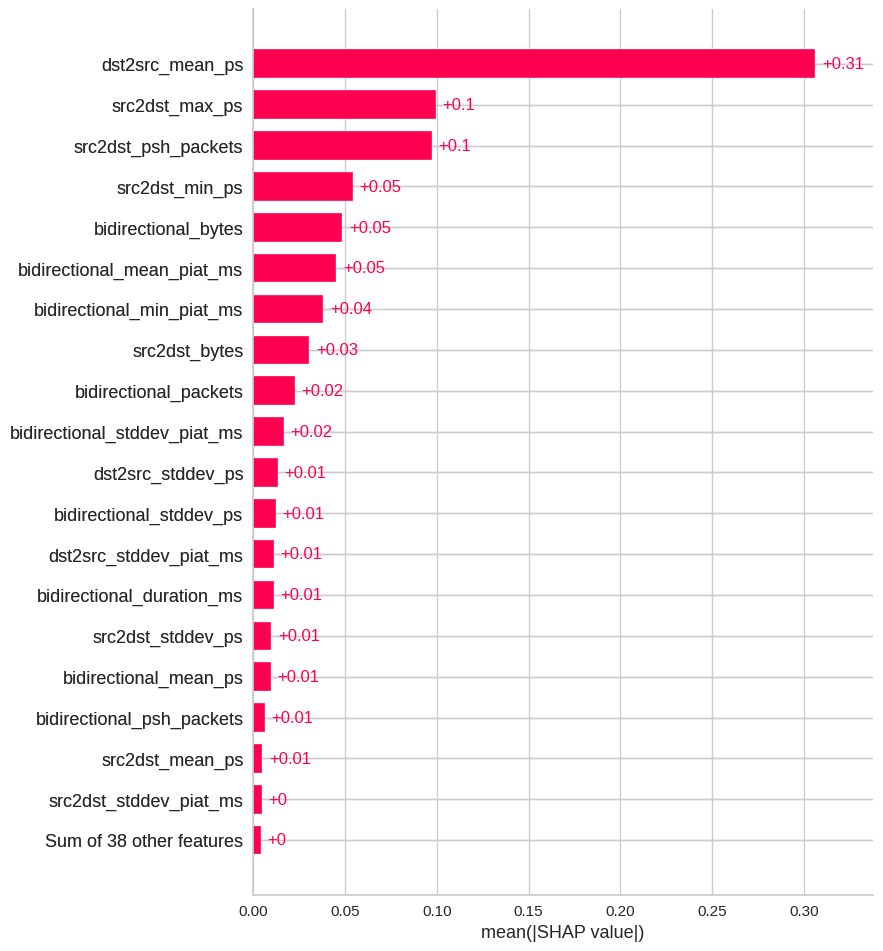

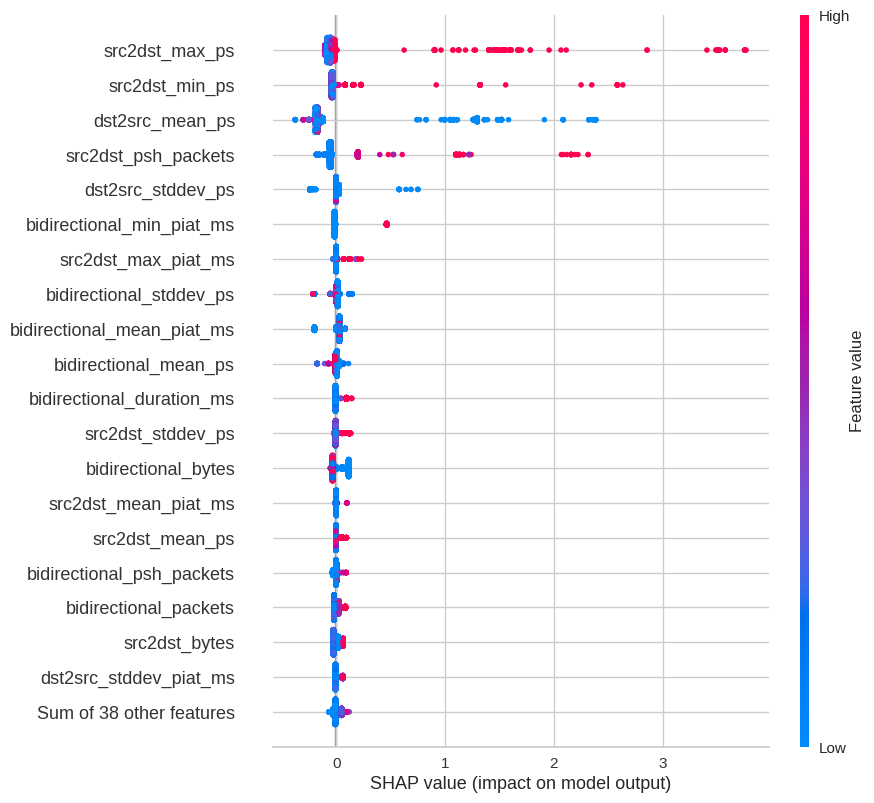

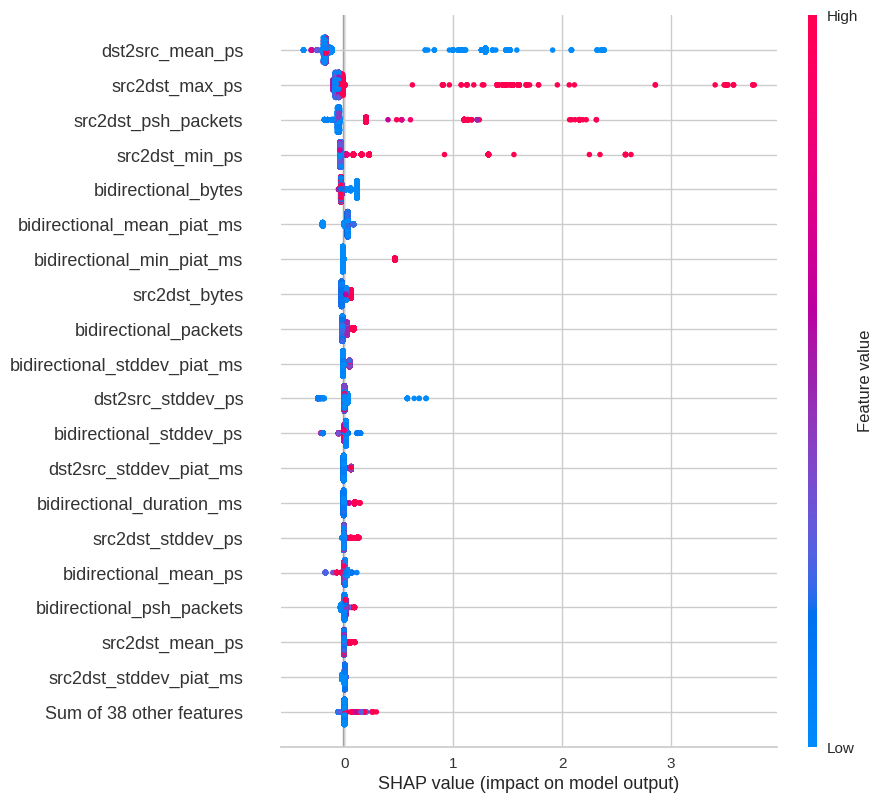

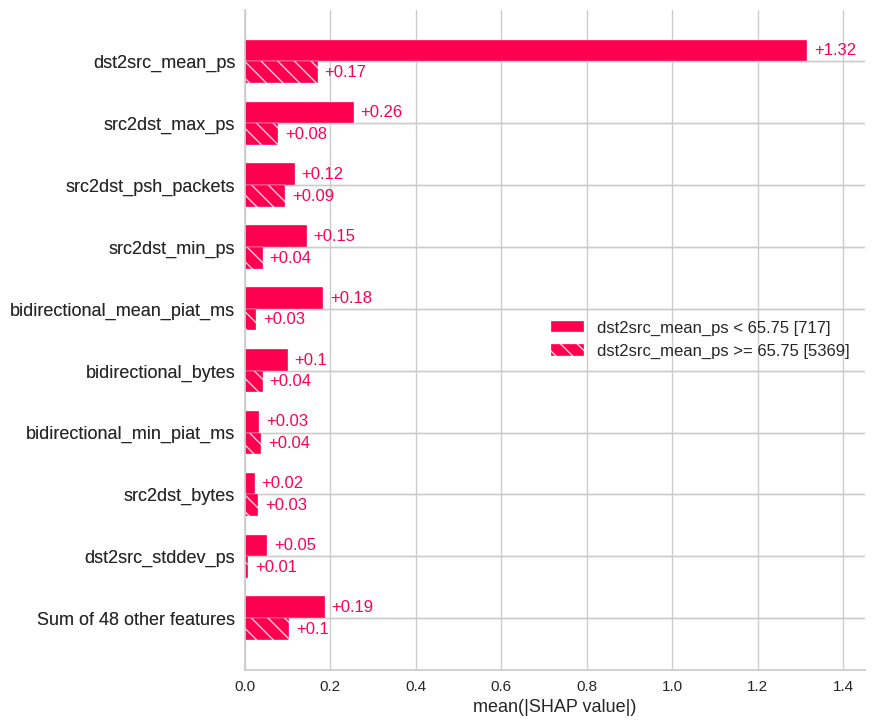

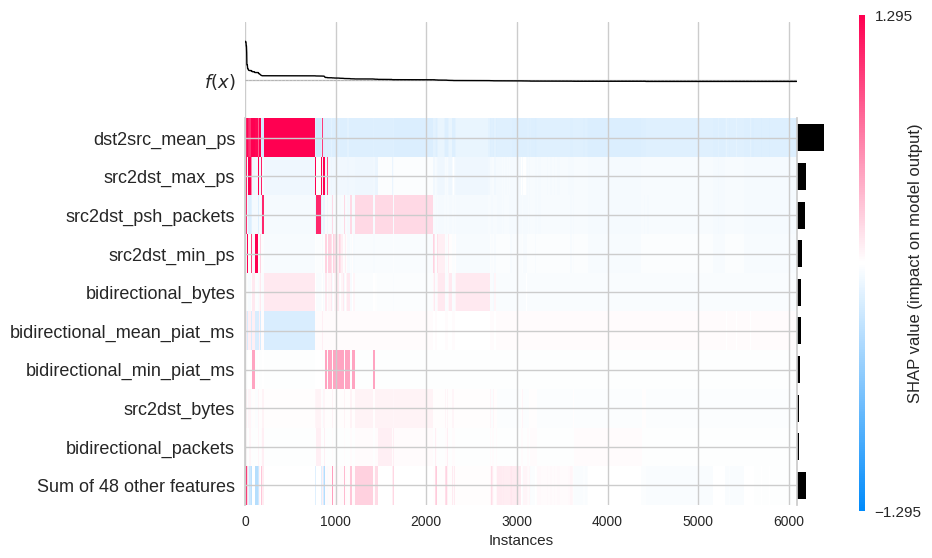

In [93]:
make_plot(9)

## PortScan shap

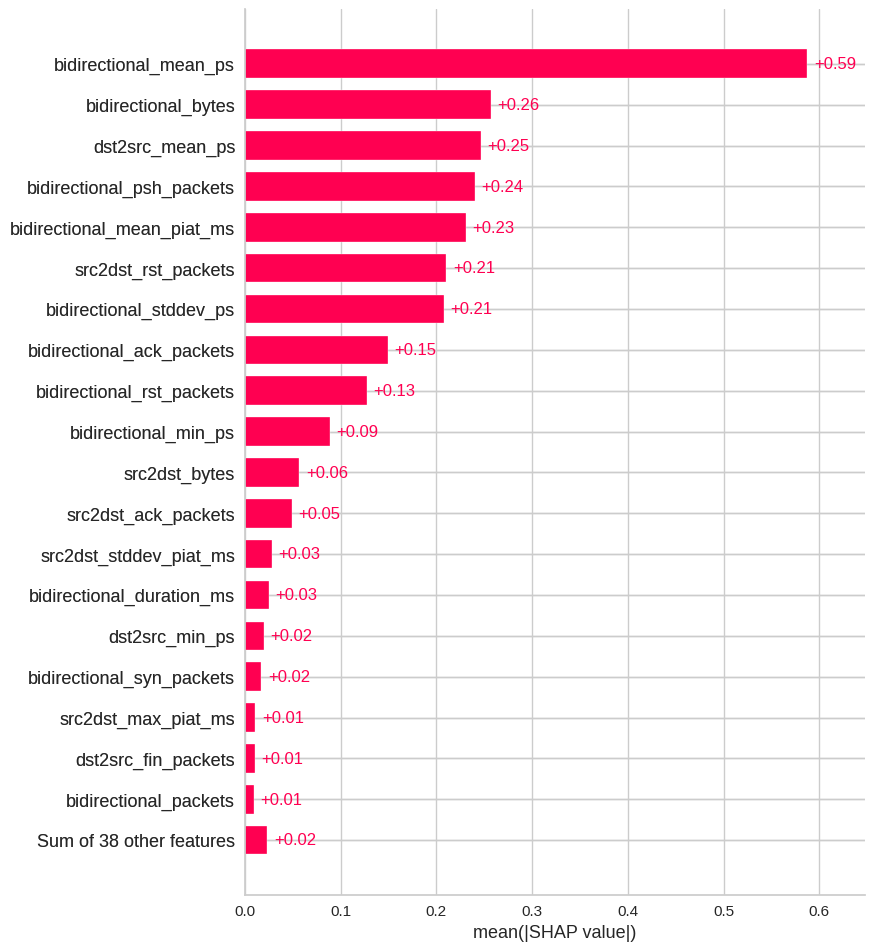

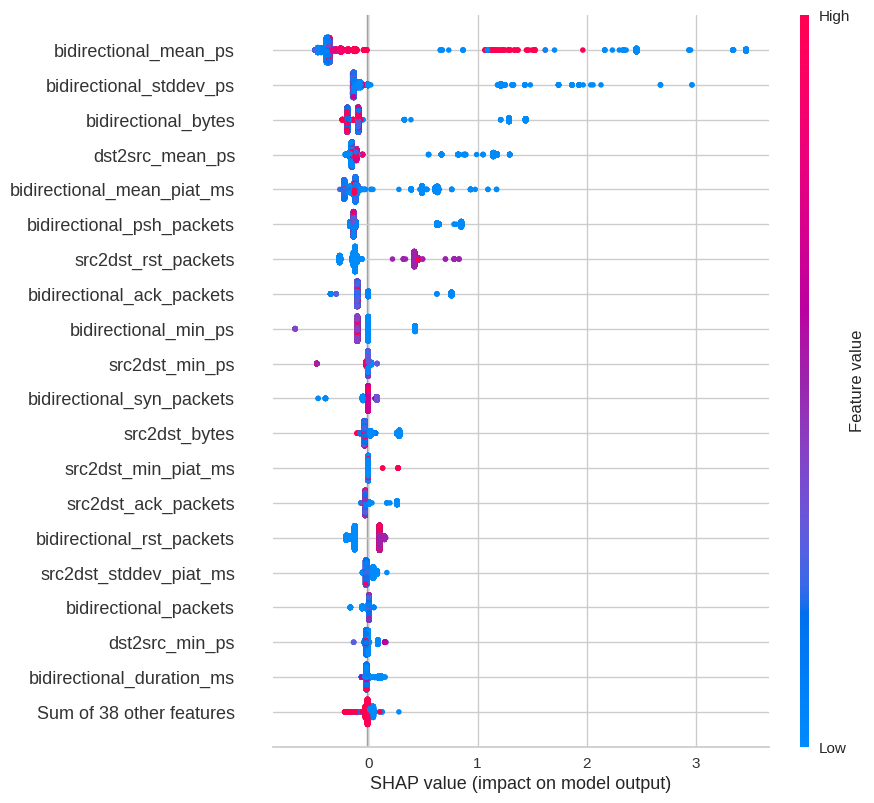

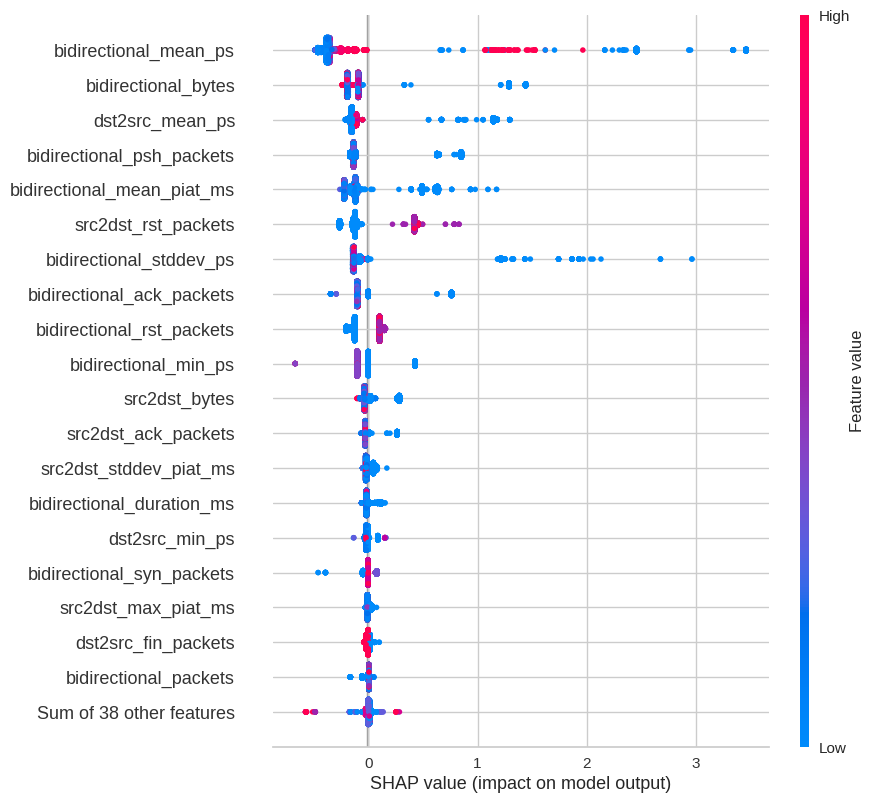

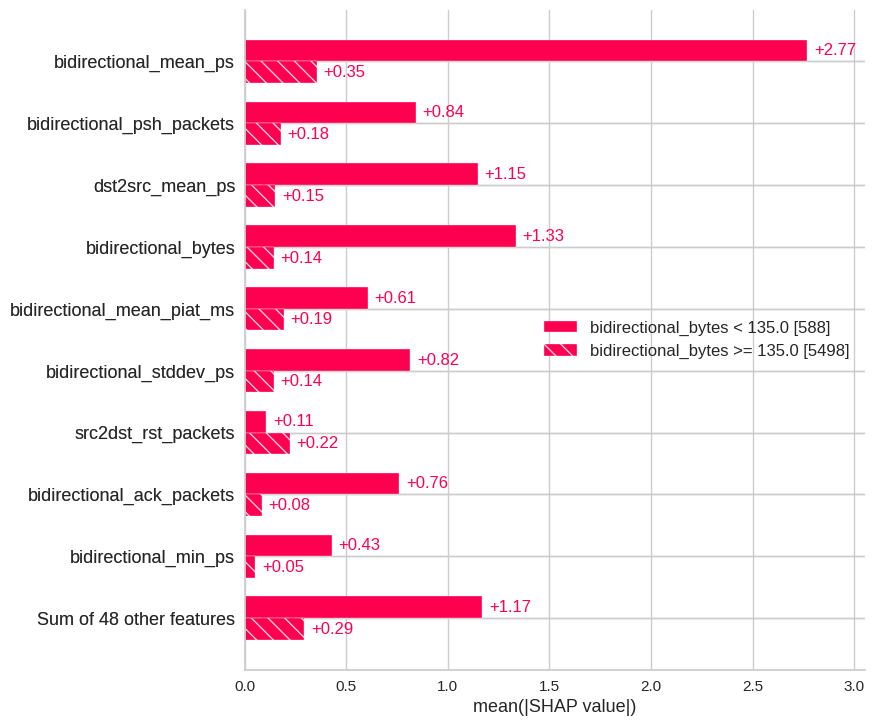

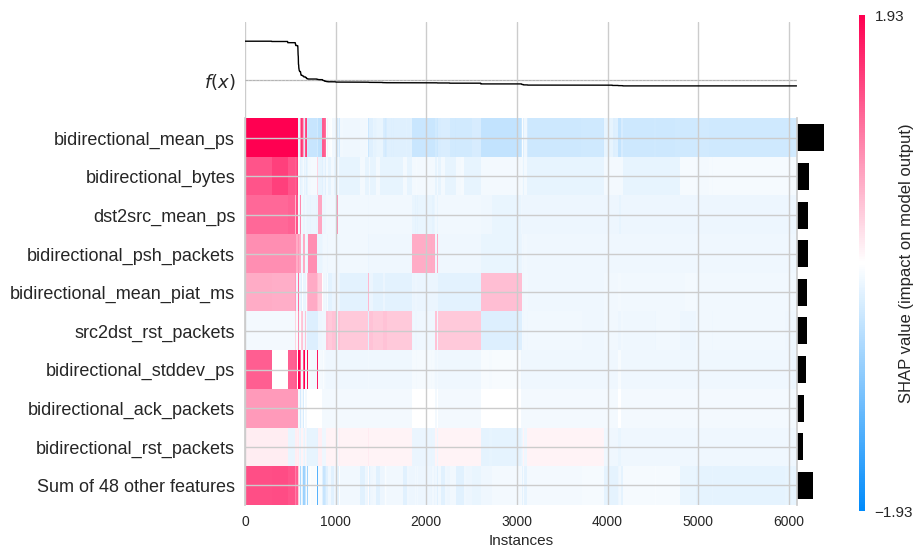

In [94]:
make_plot(10)

## SSH-Patator shap

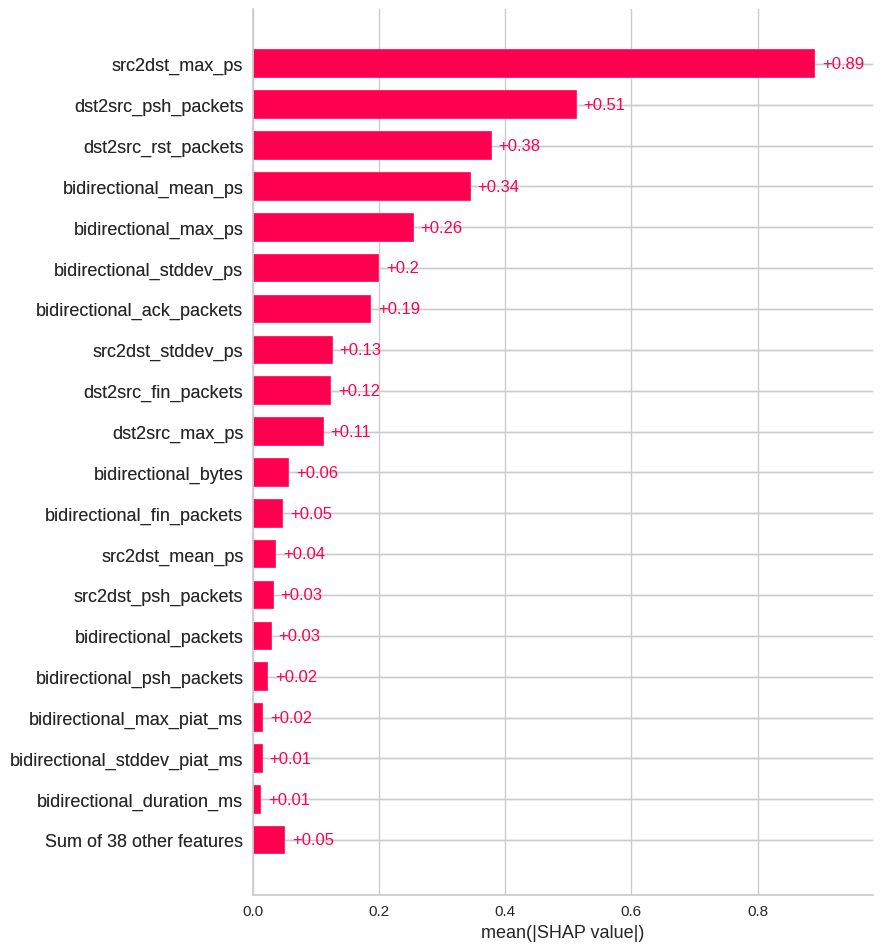

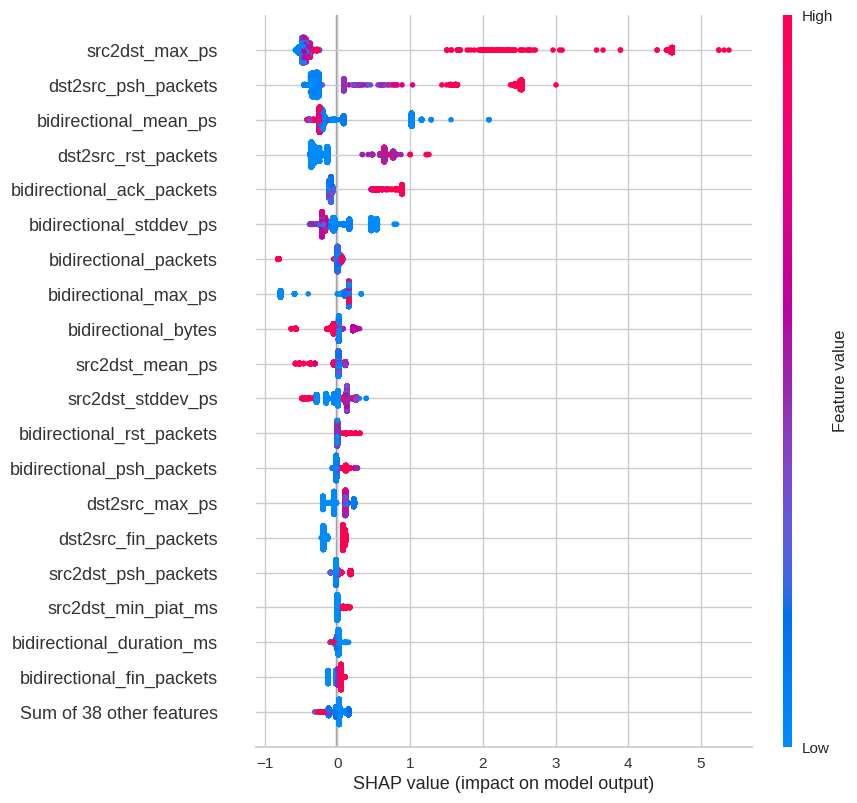

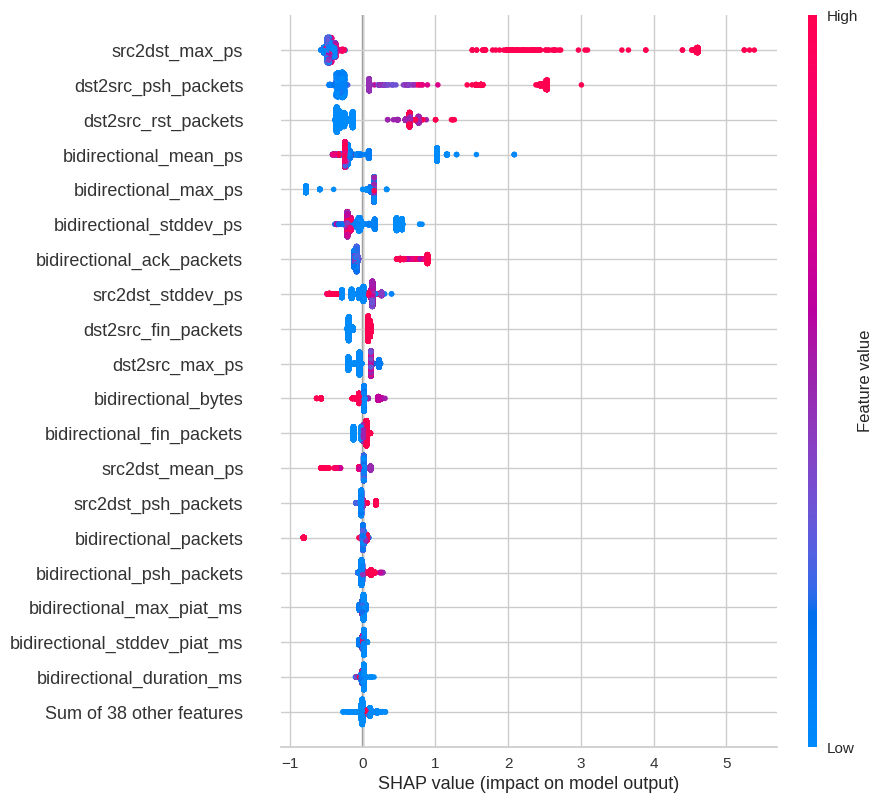

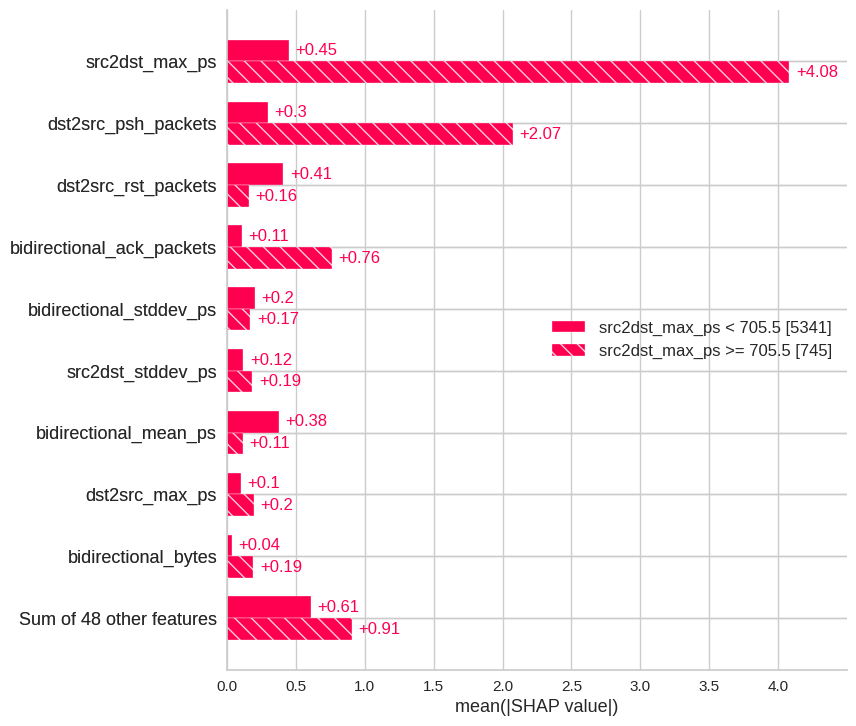

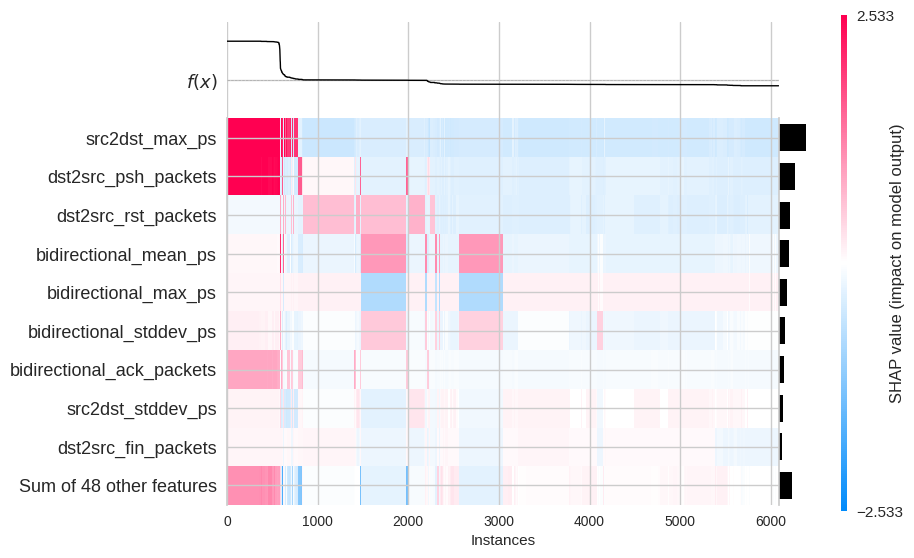

In [95]:
make_plot(11)

## Web Attack - Brute Force shap

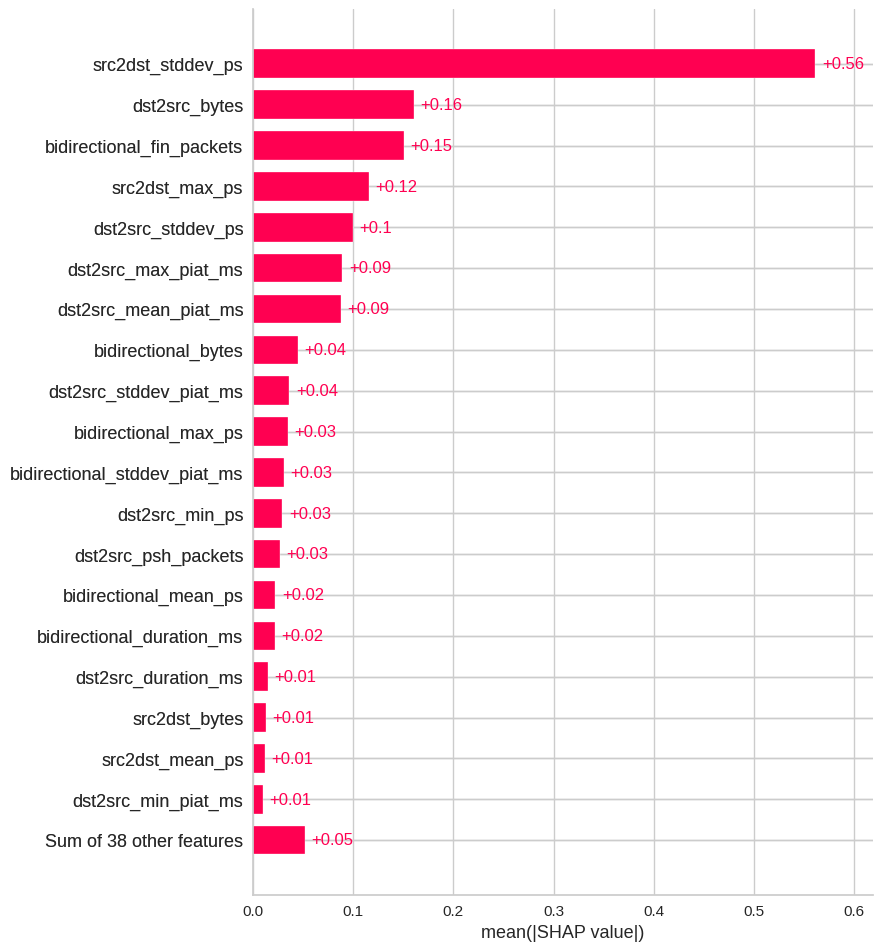

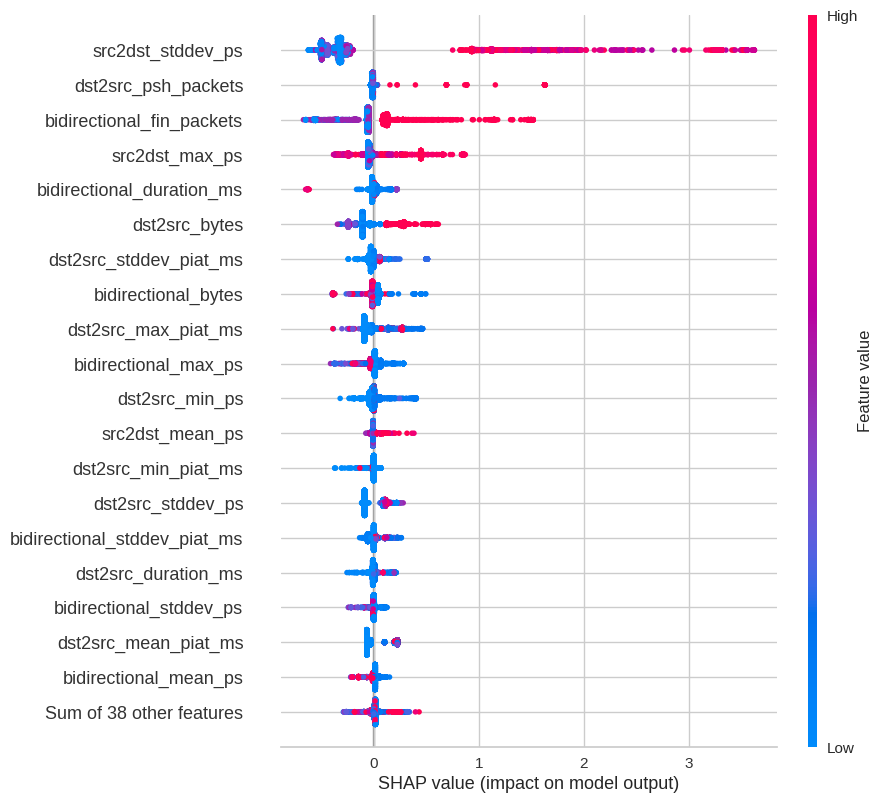

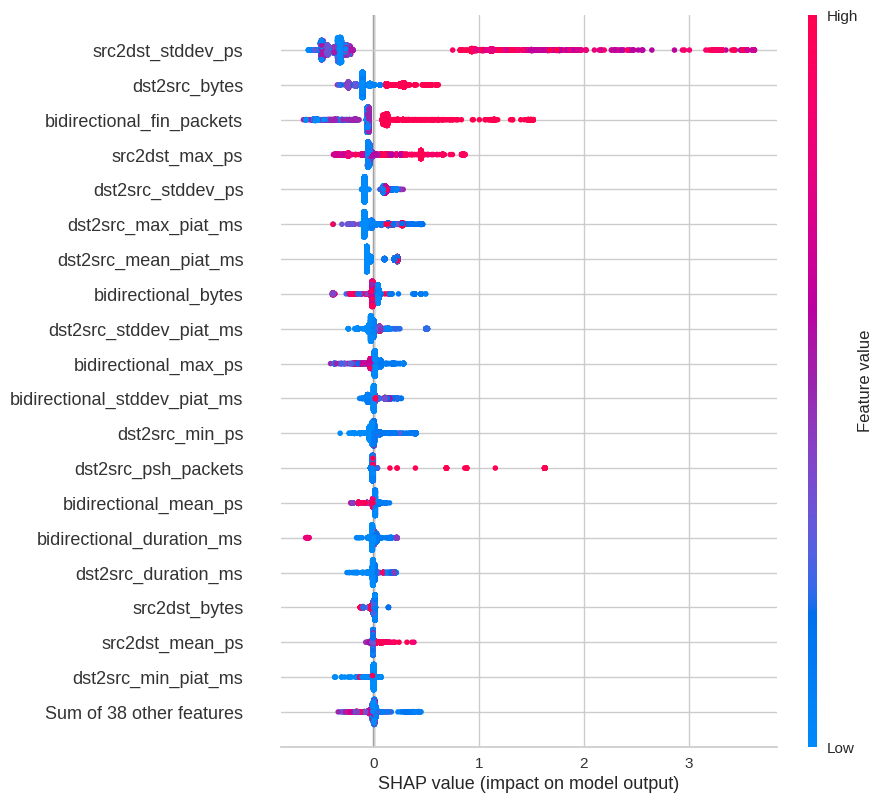

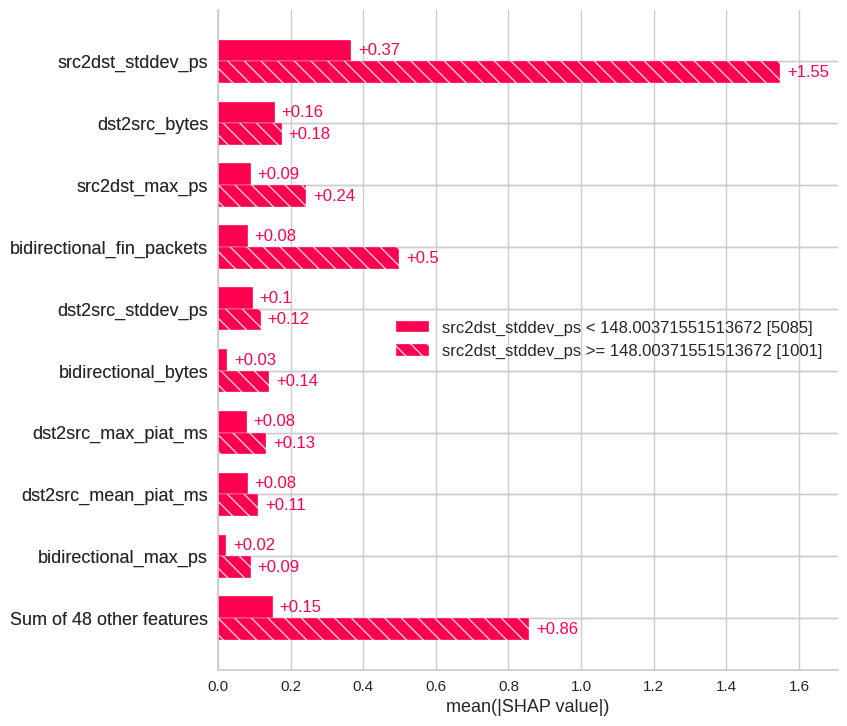

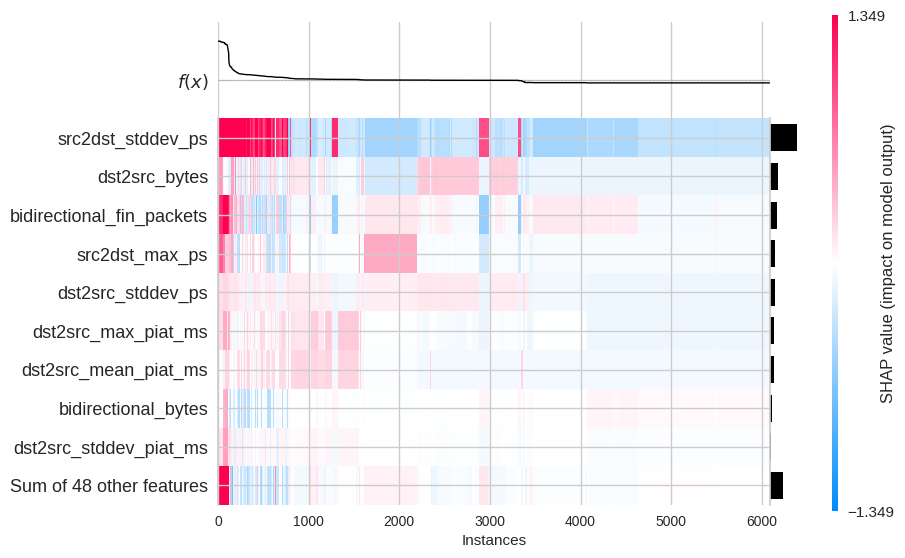

In [96]:
make_plot(12)

## Web Attack - Sql Injection shap

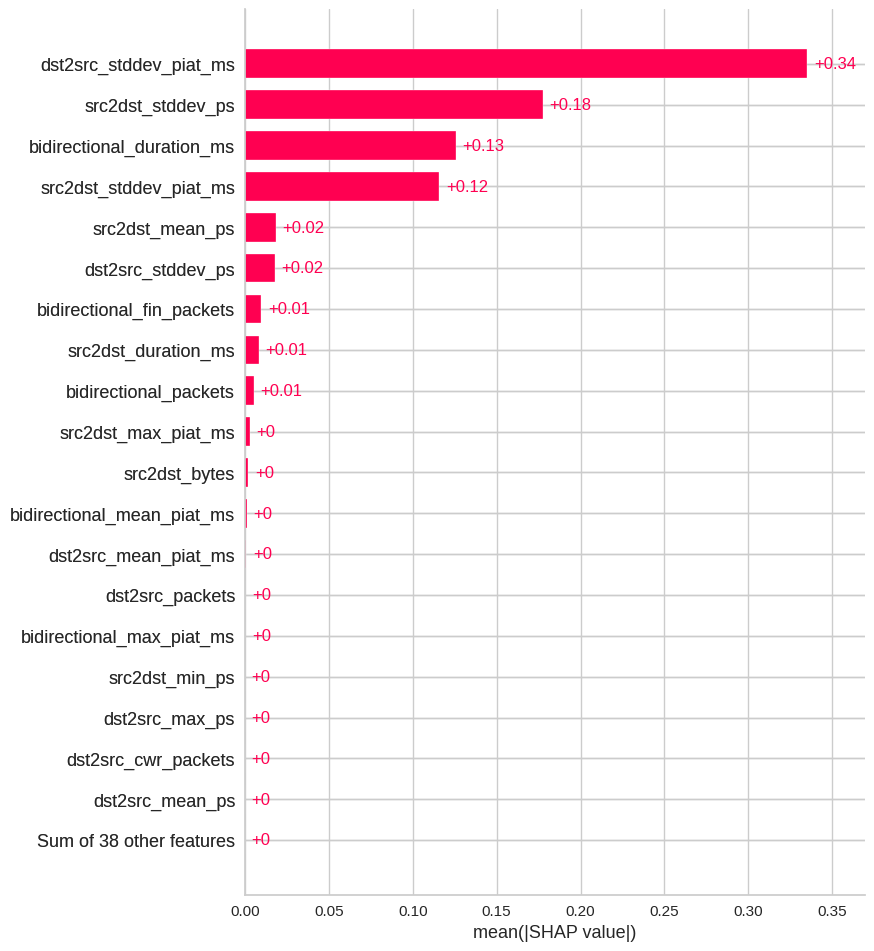

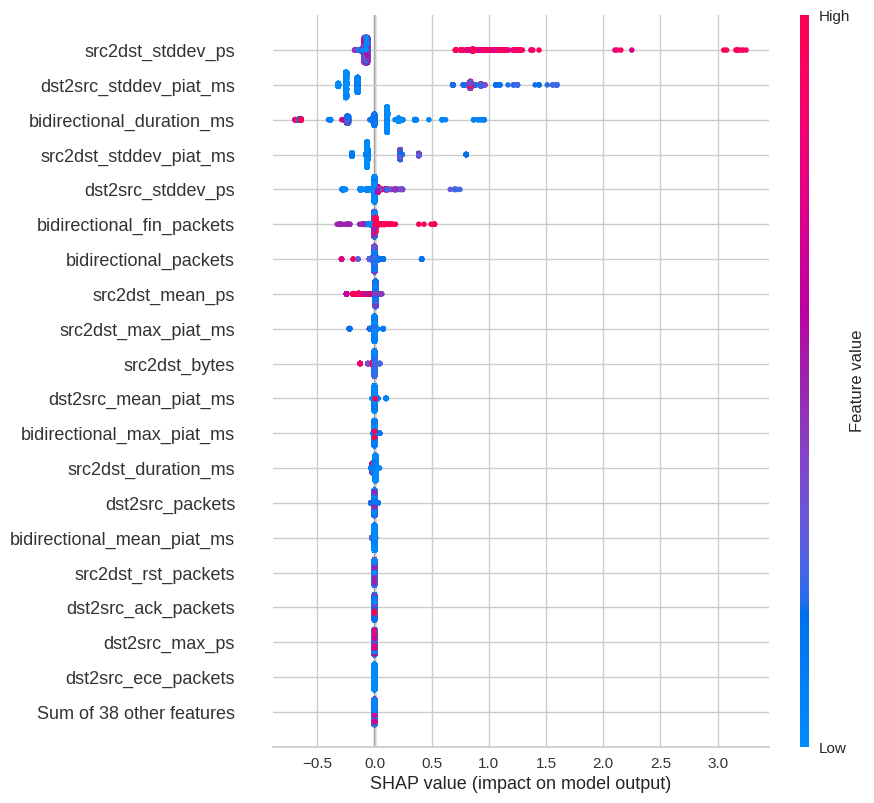

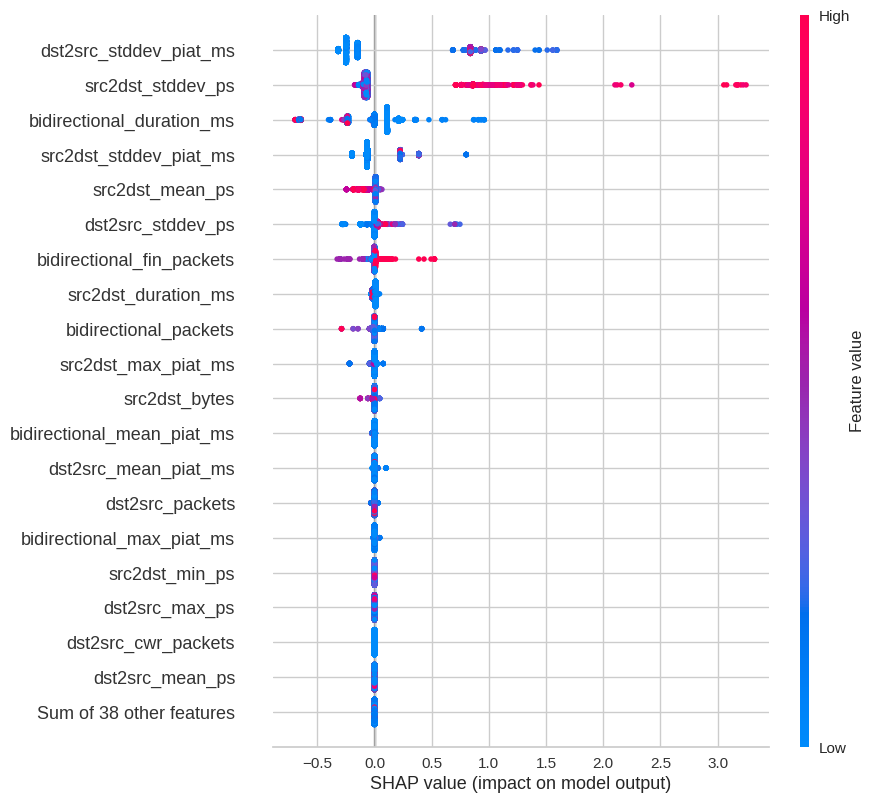

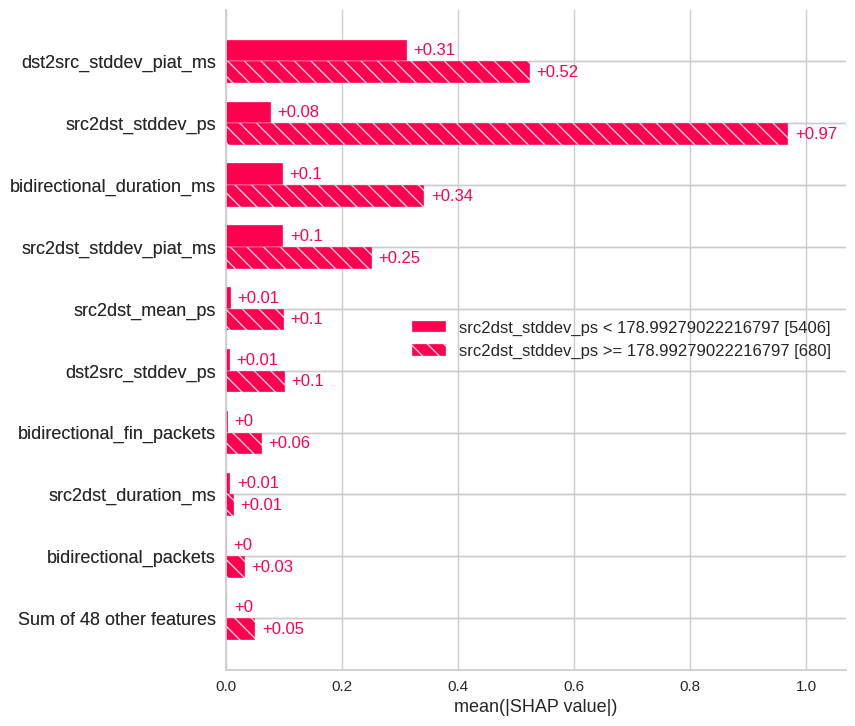

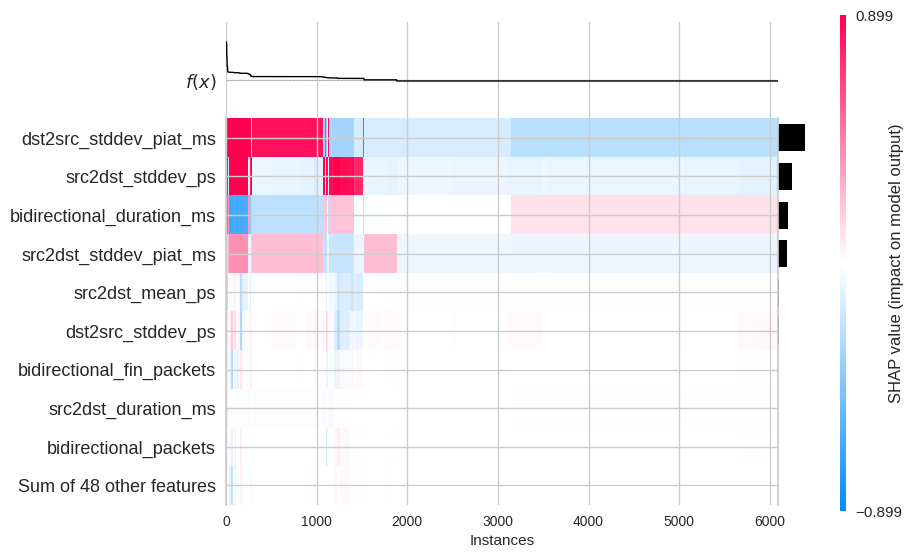

In [97]:
make_plot(13)

## Web Attack - XSS shap

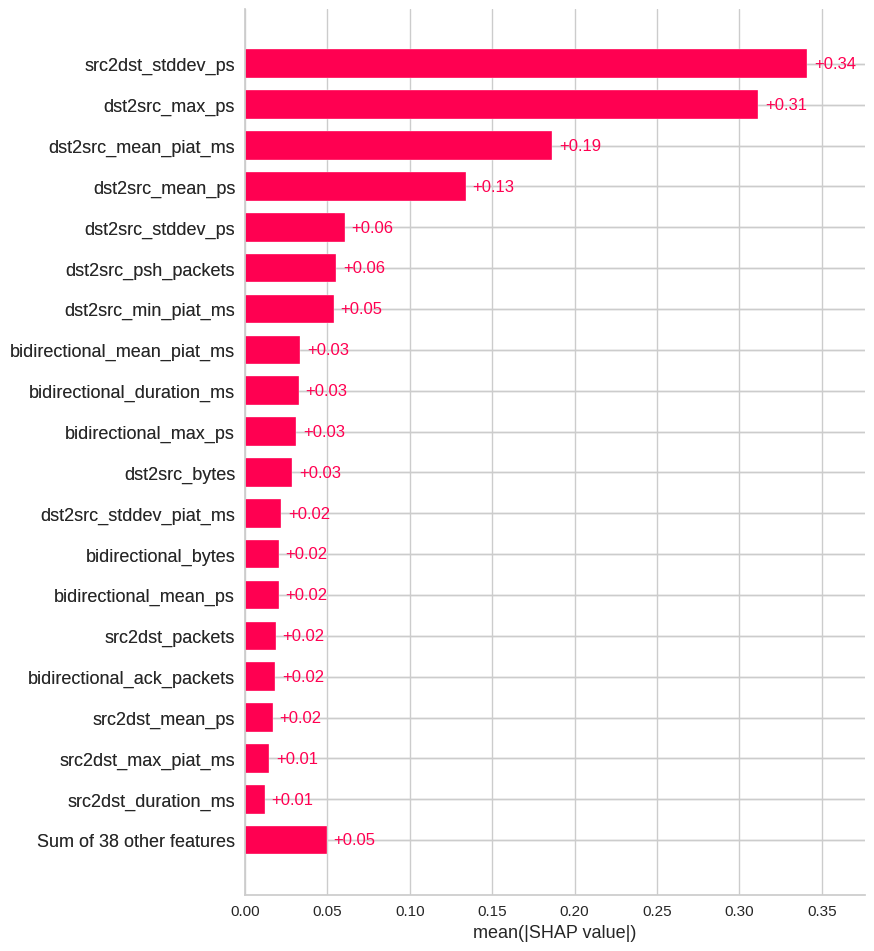

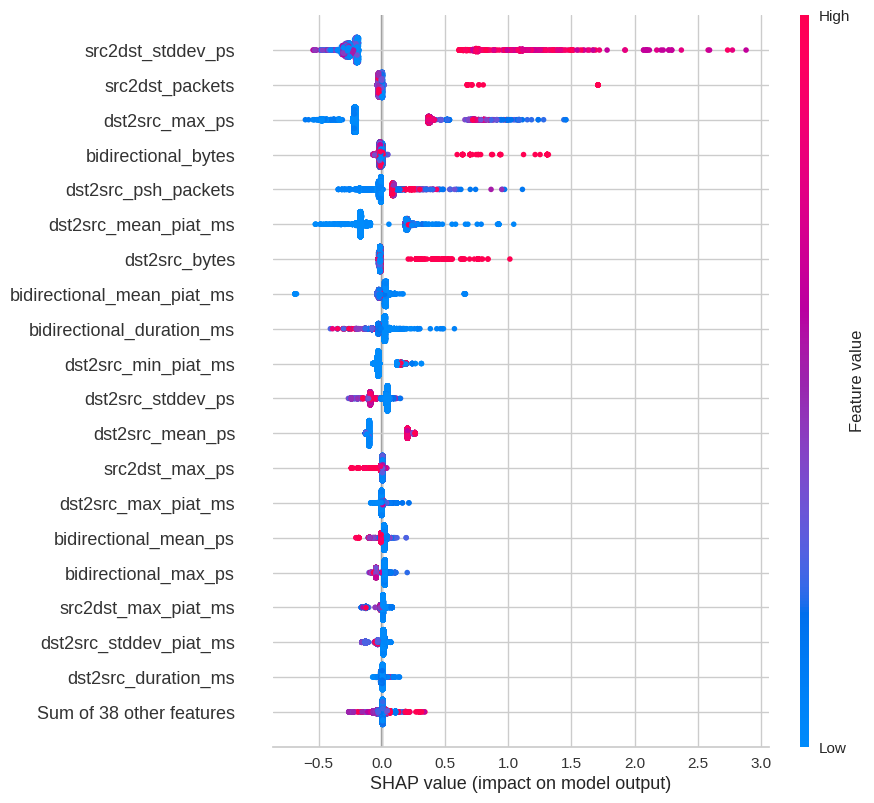

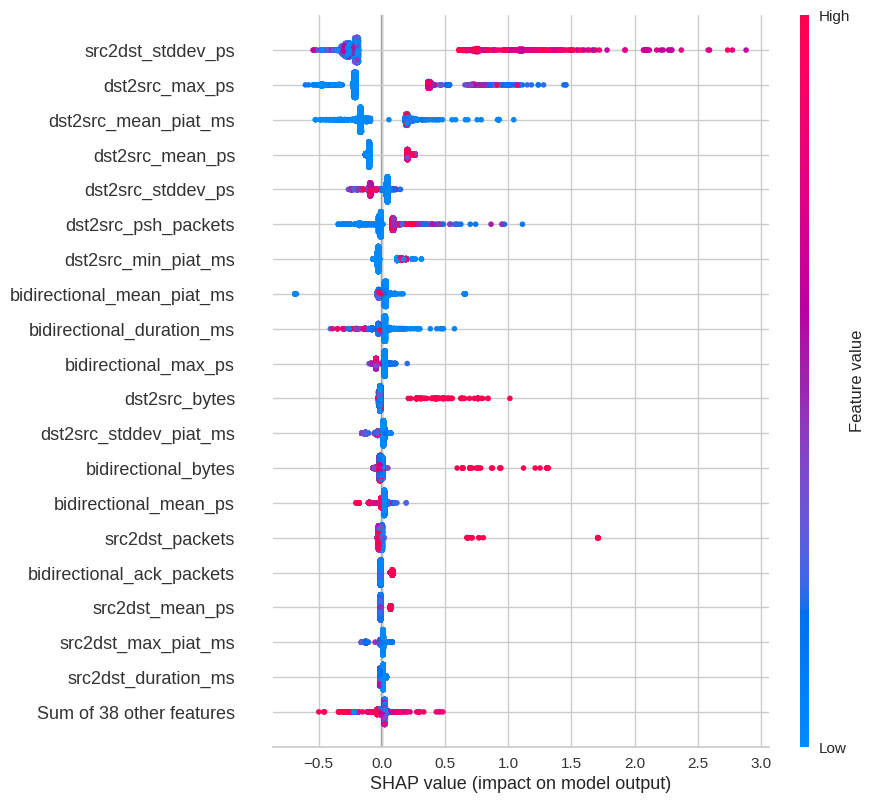

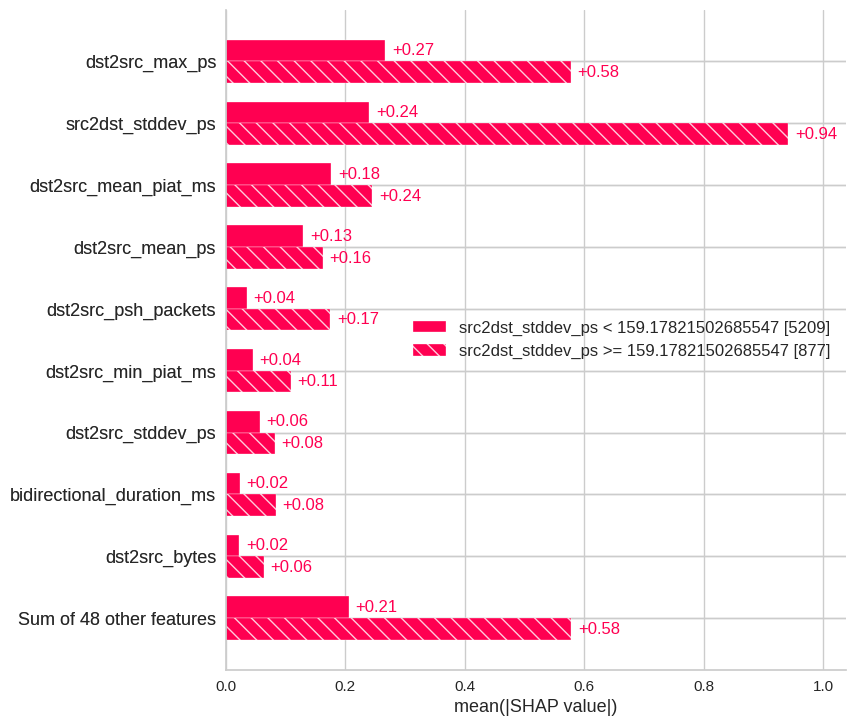

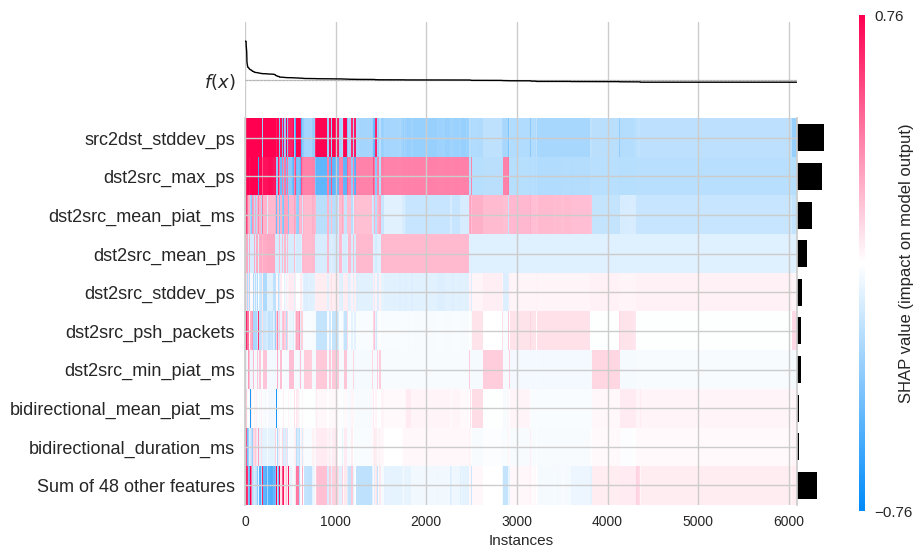

In [98]:
make_plot(14)

## Overall importance

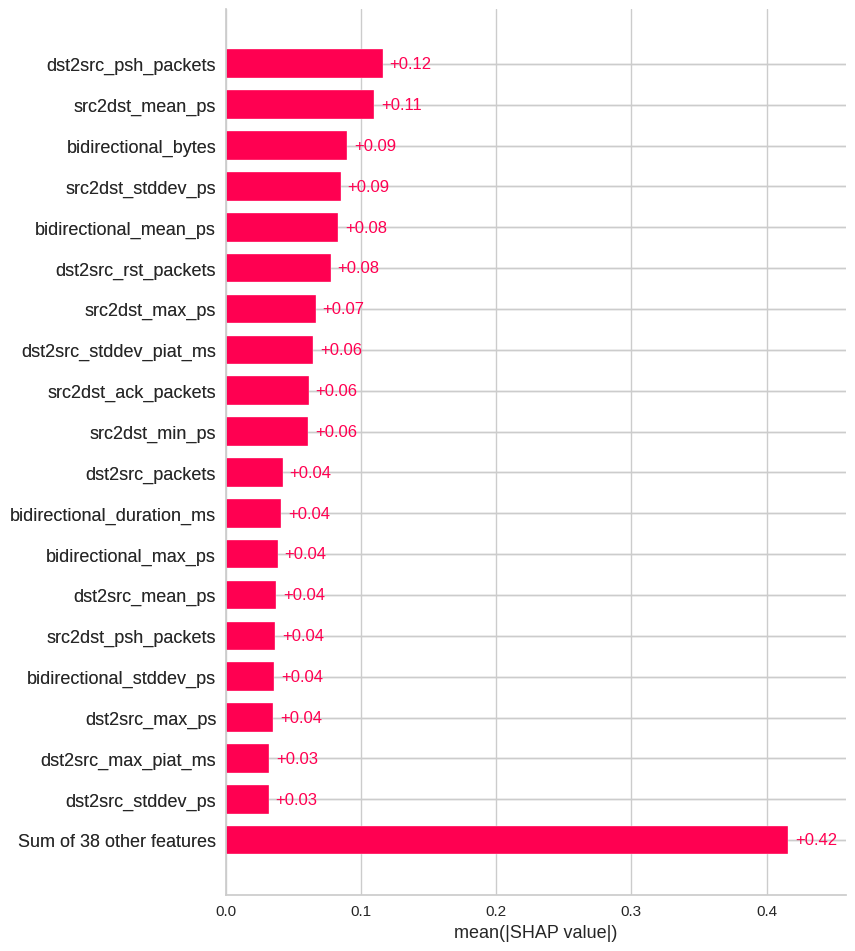

In [99]:
exp = Explanation(sv.values.mean(2), 
                  sv.base_values.mean(1), 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

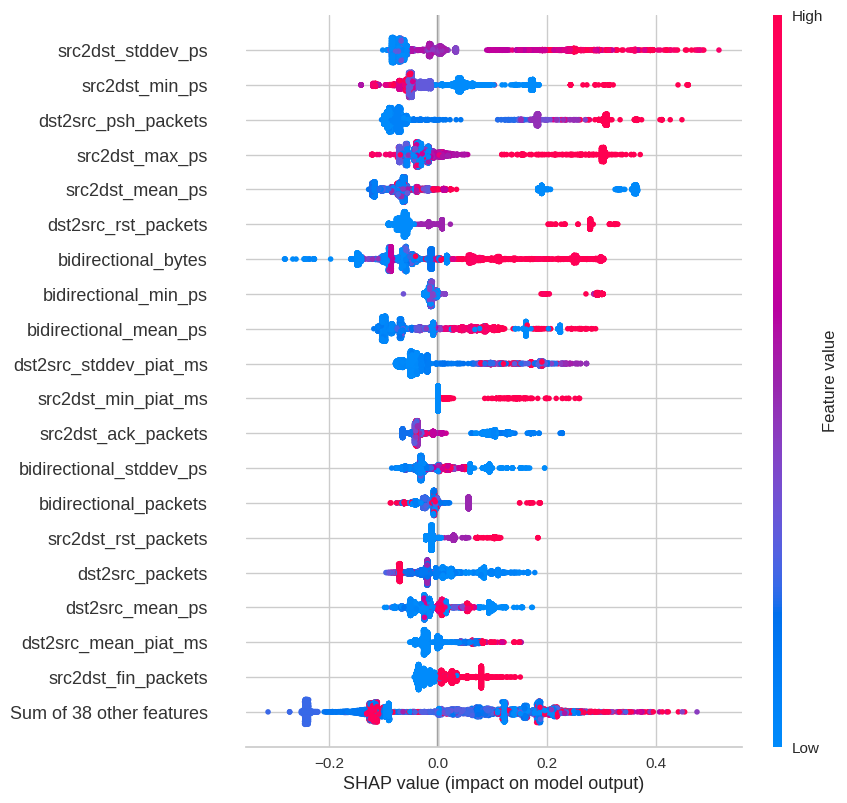

In [100]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

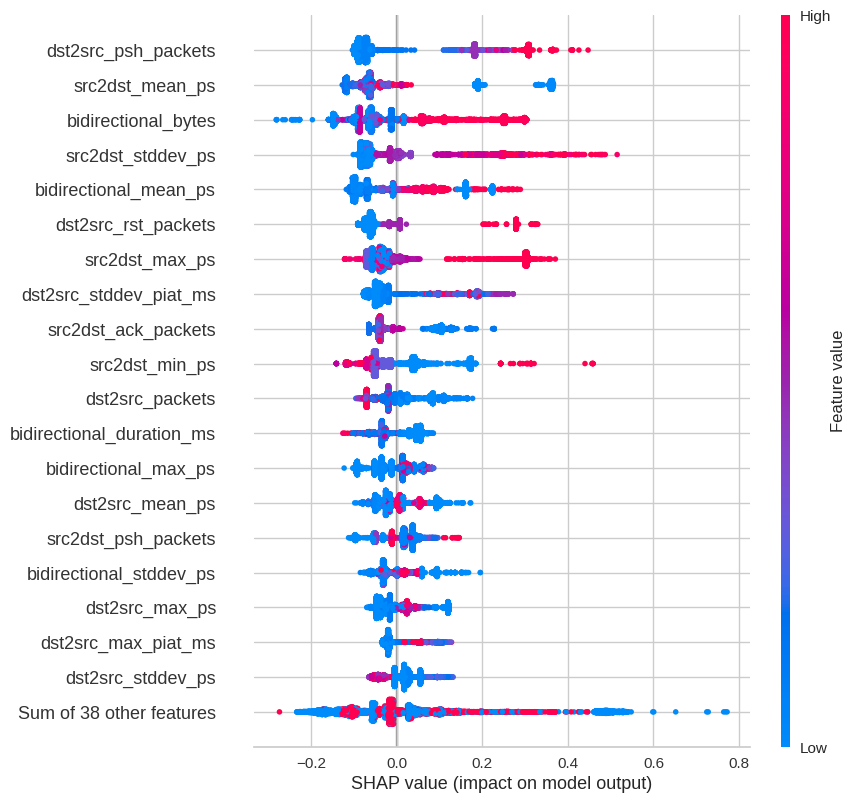

In [101]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Zero day test

In [102]:
classes = sorted(pd.unique(ds['label']).tolist())

In [103]:
removed_class = 1
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.996907,0.896189
1,PRECISION,0.996979,0.842354
2,RECALL,0.996907,0.896189
3,F1 SCORE,0.996906,0.861742


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


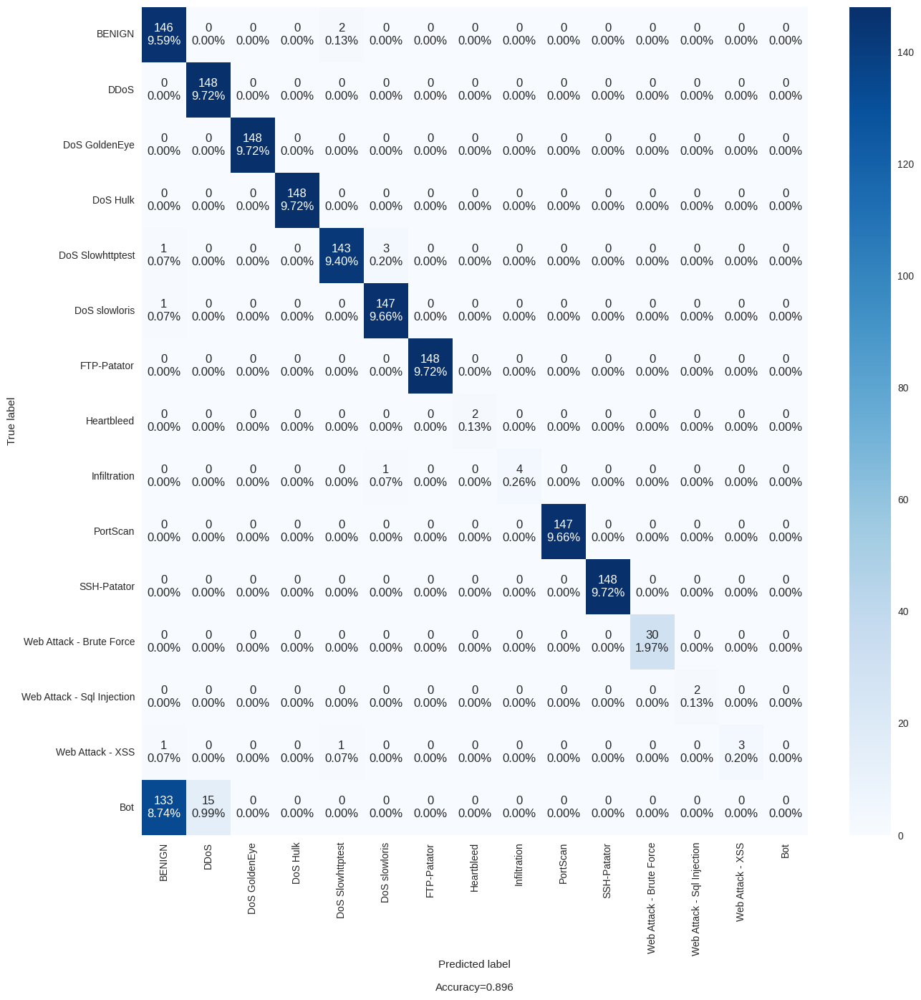

In [104]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'Bot'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [105]:
removed_class = 2
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.996907,0.896189
1,PRECISION,0.996979,0.835865
2,RECALL,0.996907,0.896189
3,F1 SCORE,0.996906,0.859071


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


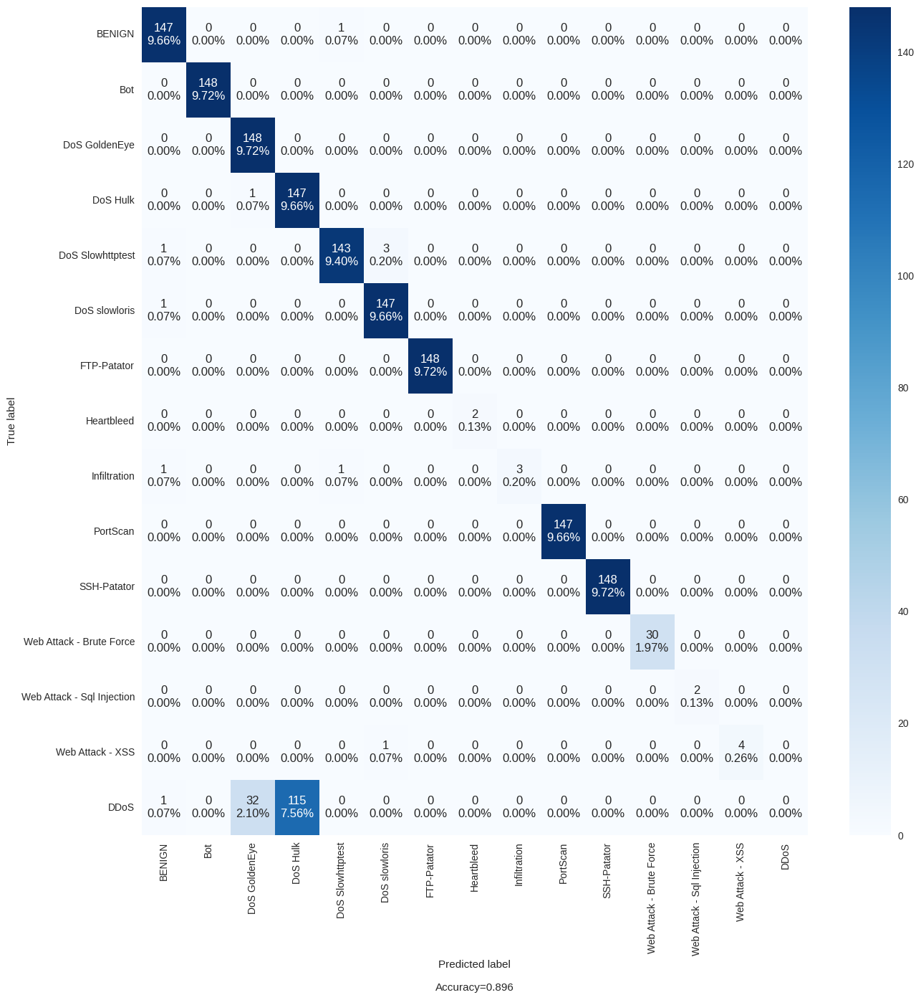

In [106]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'DDoS'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [107]:
removed_class = 3
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.996907,0.896846
1,PRECISION,0.996979,0.832261
2,RECALL,0.996907,0.896846
3,F1 SCORE,0.996906,0.858325


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


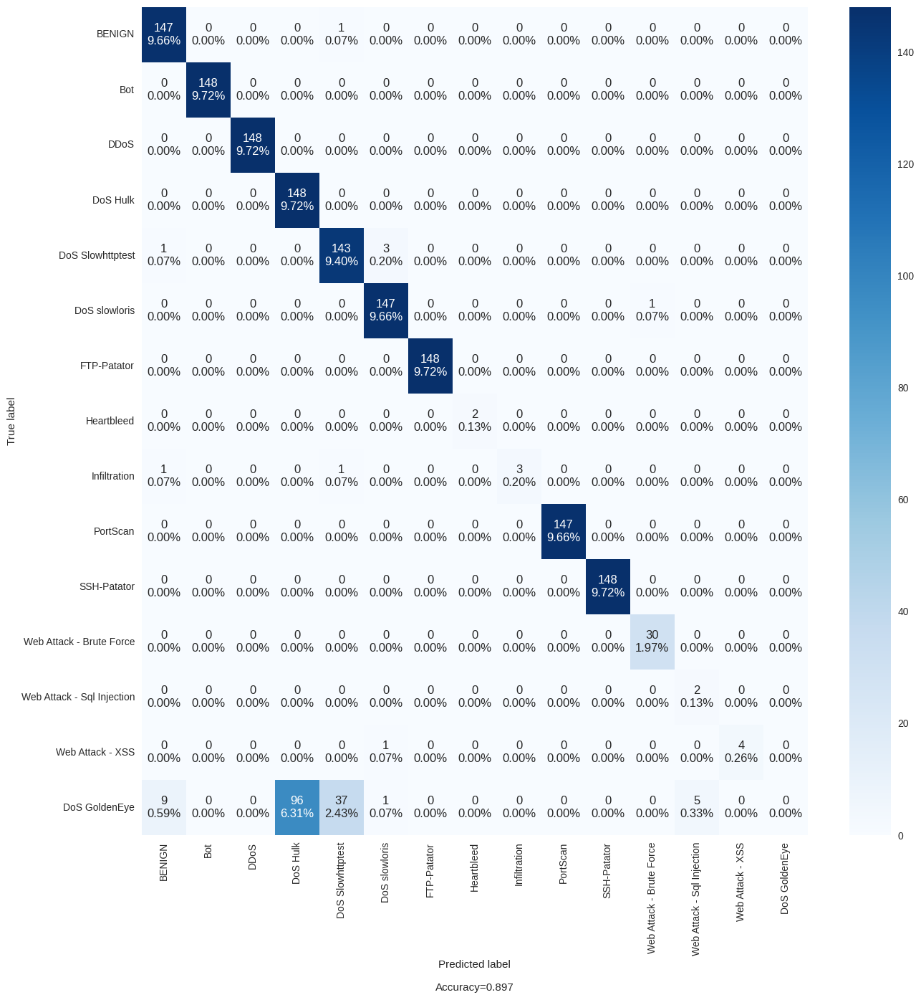

In [108]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'DoS GoldenEye'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [109]:
removed_class = 4
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.996907,0.897503
1,PRECISION,0.996979,0.831116
2,RECALL,0.996907,0.897503
3,F1 SCORE,0.996906,0.858043


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


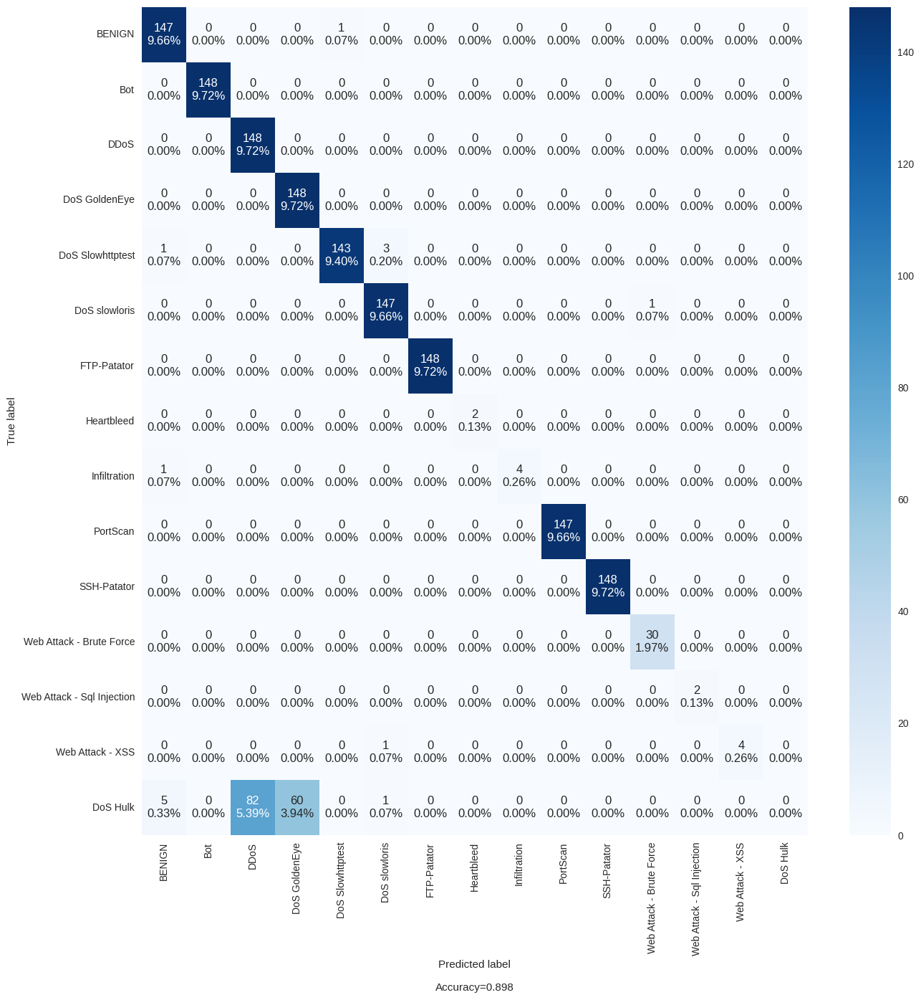

In [110]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'DoS Hulk'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [111]:
removed_class = 5
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,1.0,0.898817
1,PRECISION,1.0,0.847992
2,RECALL,1.0,0.898817
3,F1 SCORE,1.0,0.865558


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


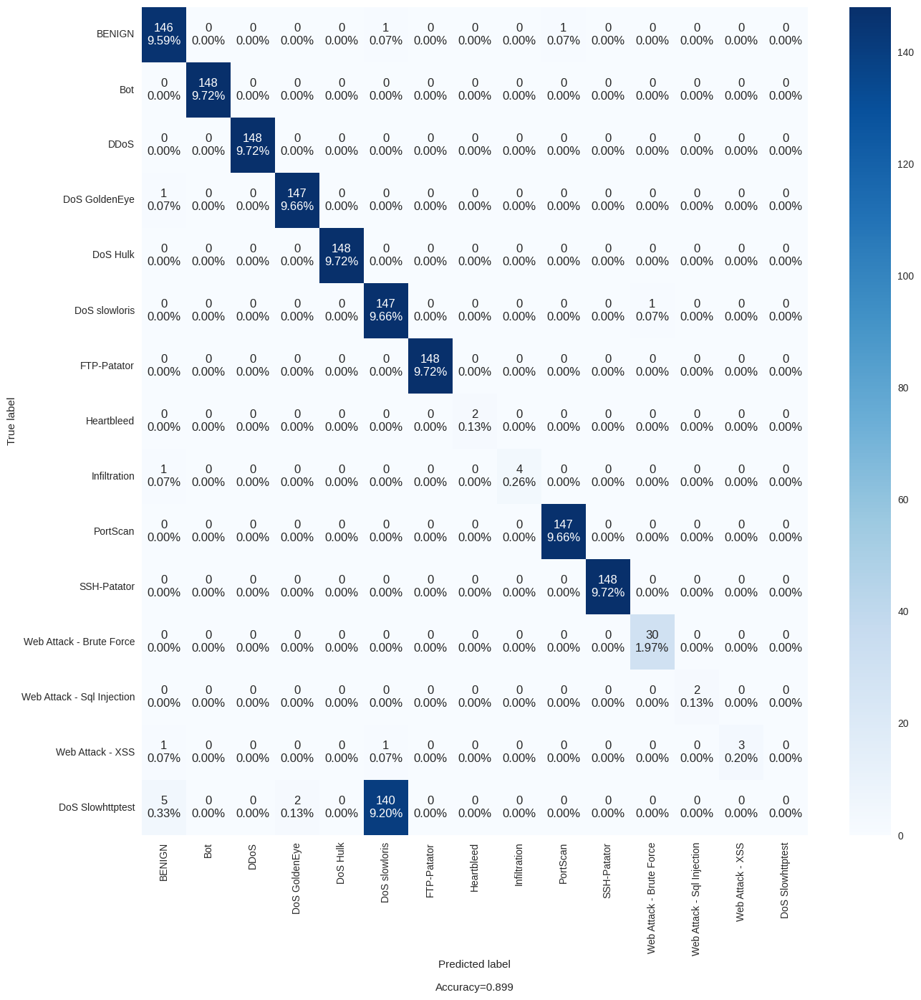

In [112]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'DoS Slowhttptest'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [113]:
removed_class = 6
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.999818,0.897503
1,PRECISION,0.999818,0.846410
2,RECALL,0.999818,0.897503
3,F1 SCORE,0.999818,0.863932


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


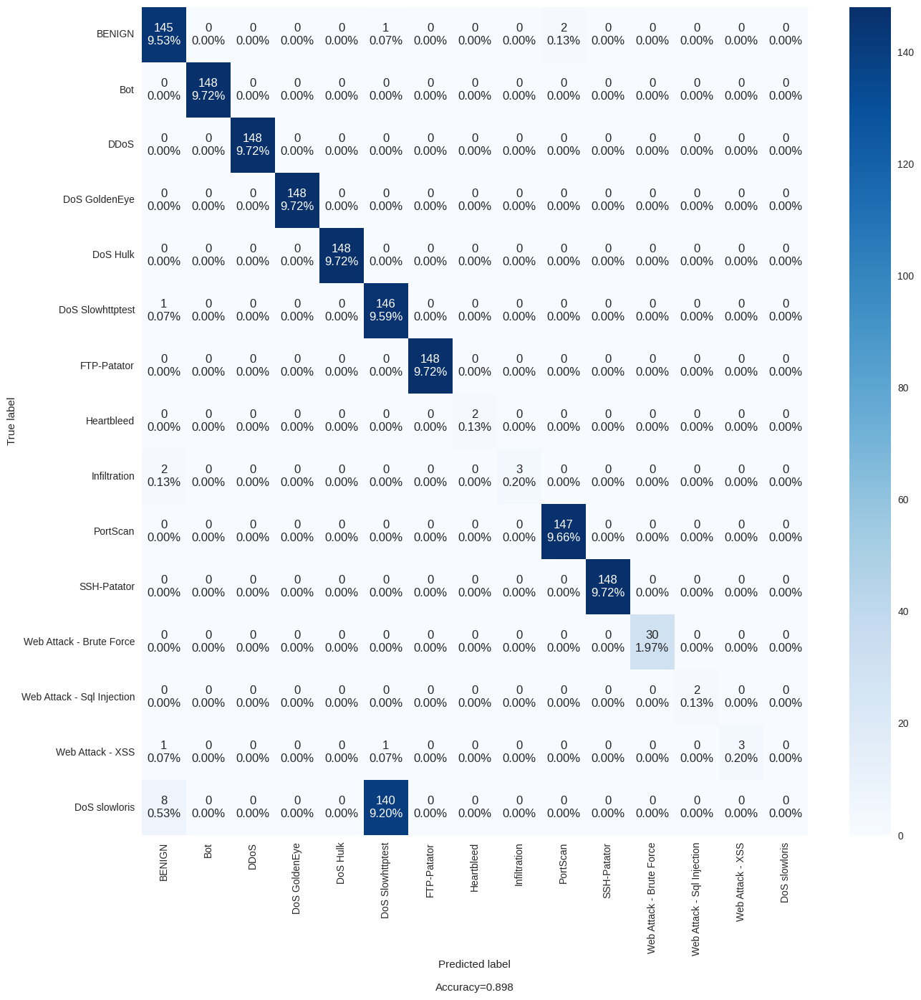

In [114]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'DoS slowloris'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [115]:
removed_class = 7
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.996907,0.89816
1,PRECISION,0.996979,0.85038
2,RECALL,0.996907,0.89816
3,F1 SCORE,0.996906,0.86608


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


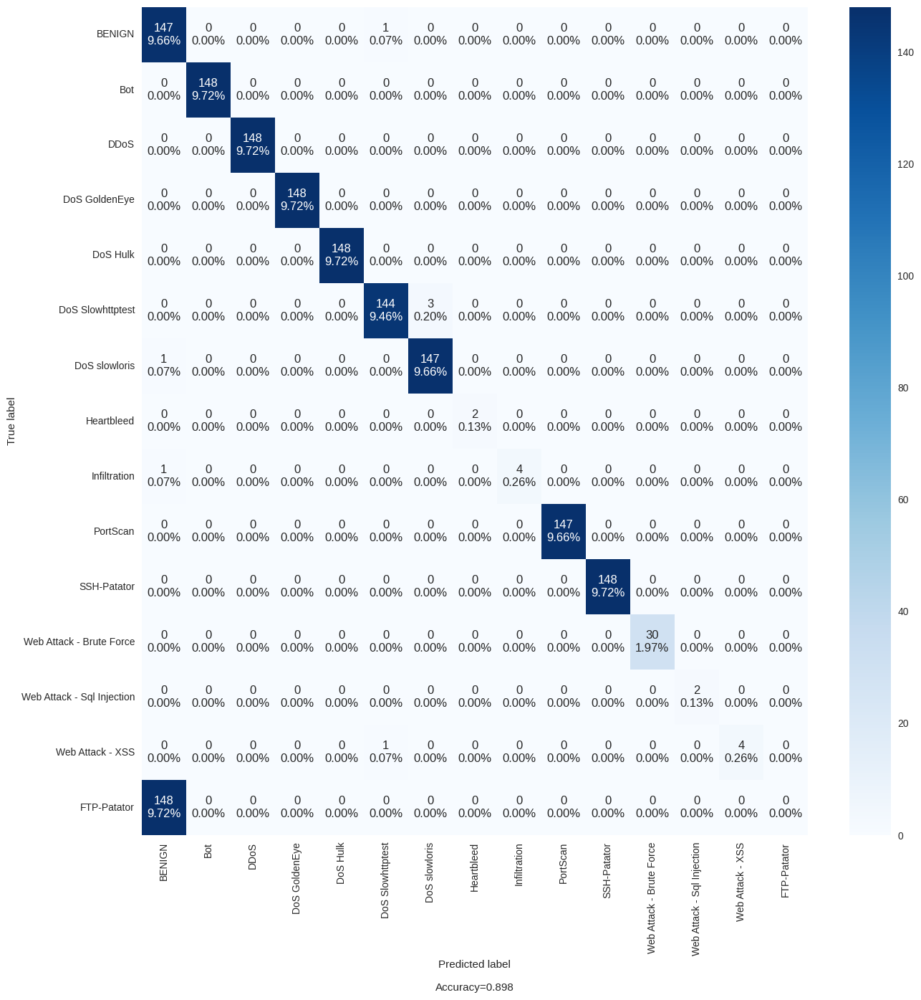

In [116]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'FTP-Patator'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [117]:
removed_class = 8
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.997203,0.992116
1,PRECISION,0.997268,0.990931
2,RECALL,0.997203,0.992116
3,F1 SCORE,0.997202,0.991188


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


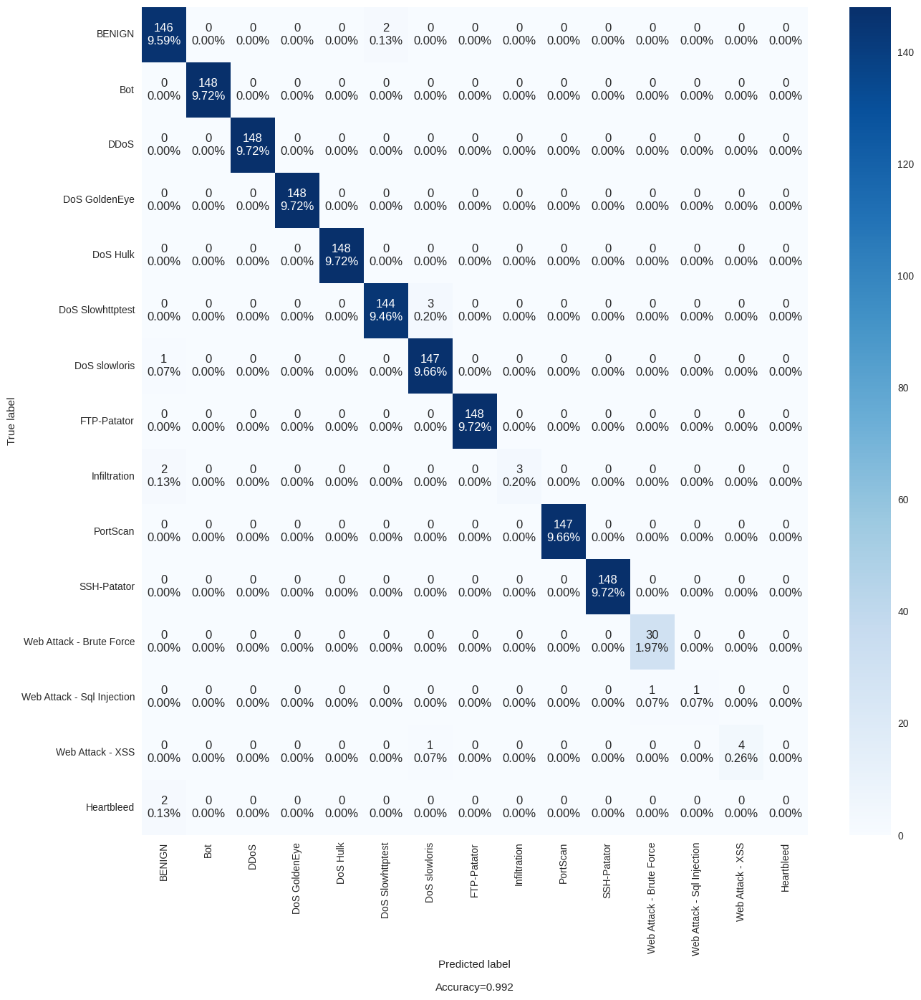

In [118]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'Heartbleed'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [119]:
removed_class = 9
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.997197,0.991459
1,PRECISION,0.997262,0.988366
2,RECALL,0.997197,0.991459
3,F1 SCORE,0.997196,0.989714


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


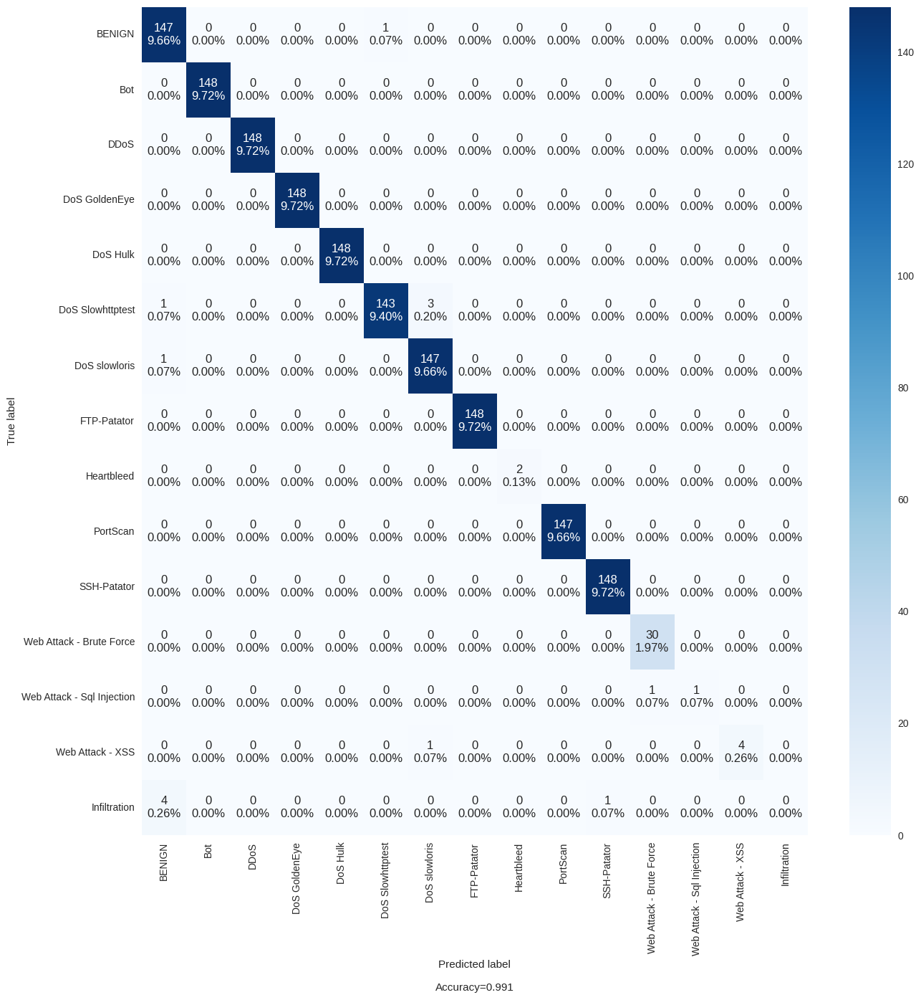

In [120]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'Infiltration'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [121]:
removed_class = 10
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.996906,0.898160
1,PRECISION,0.996978,0.851059
2,RECALL,0.996906,0.898160
3,F1 SCORE,0.996906,0.866405


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


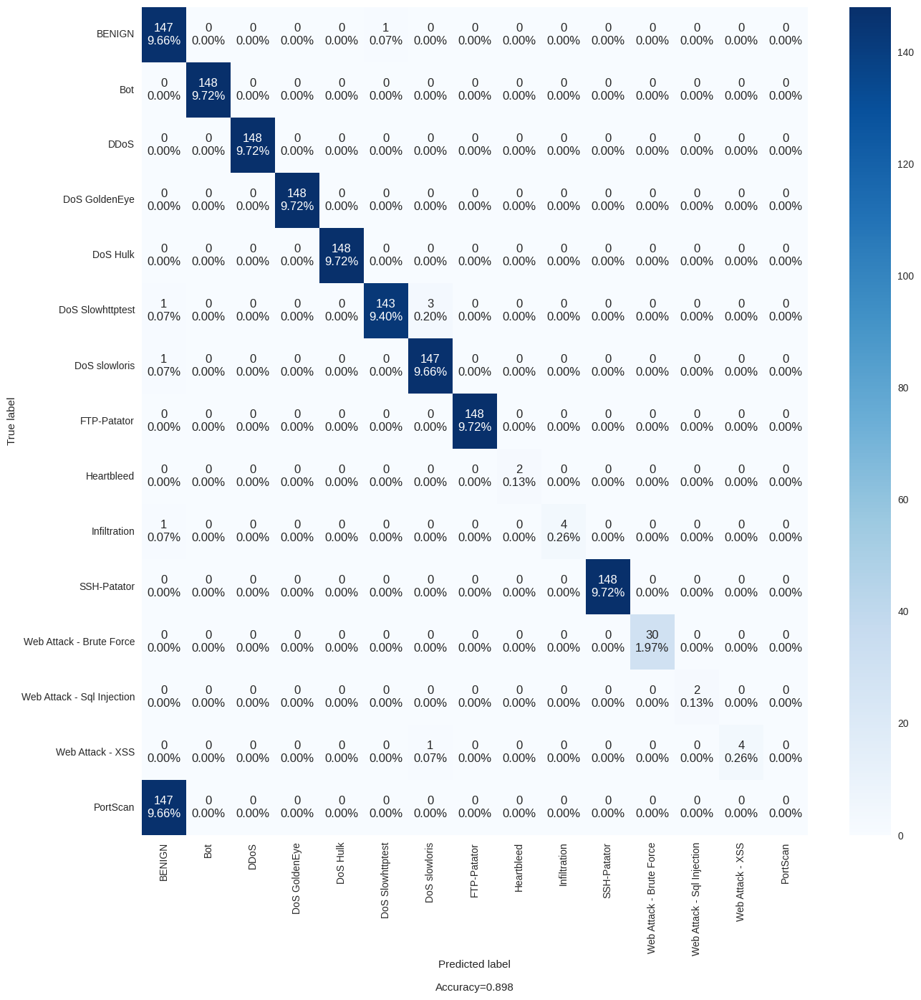

In [122]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'PortScan'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [123]:
removed_class = 11
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.996907,0.896846
1,PRECISION,0.996979,0.848024
2,RECALL,0.996907,0.896846
3,F1 SCORE,0.996906,0.864341


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


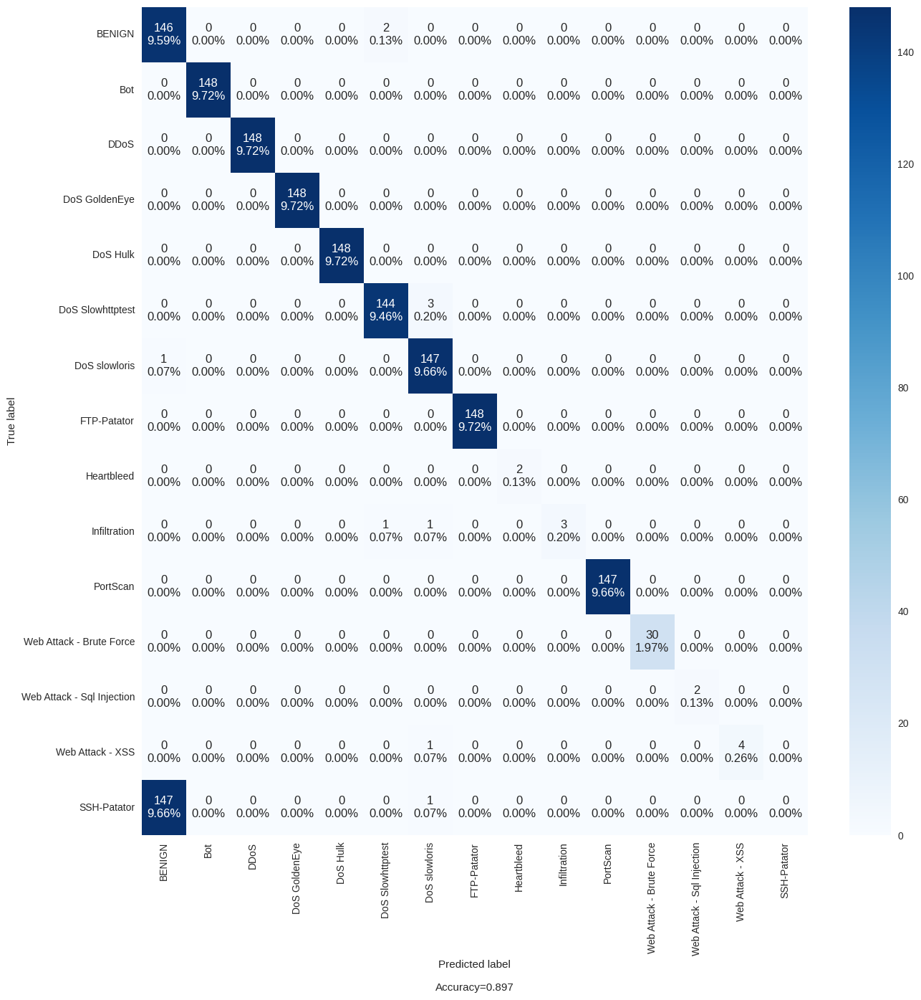

In [124]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'SSH-Patator'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [125]:
removed_class = 12
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.997150,0.973719
1,PRECISION,0.997216,0.965274
2,RECALL,0.997150,0.973719
3,F1 SCORE,0.997150,0.968368


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


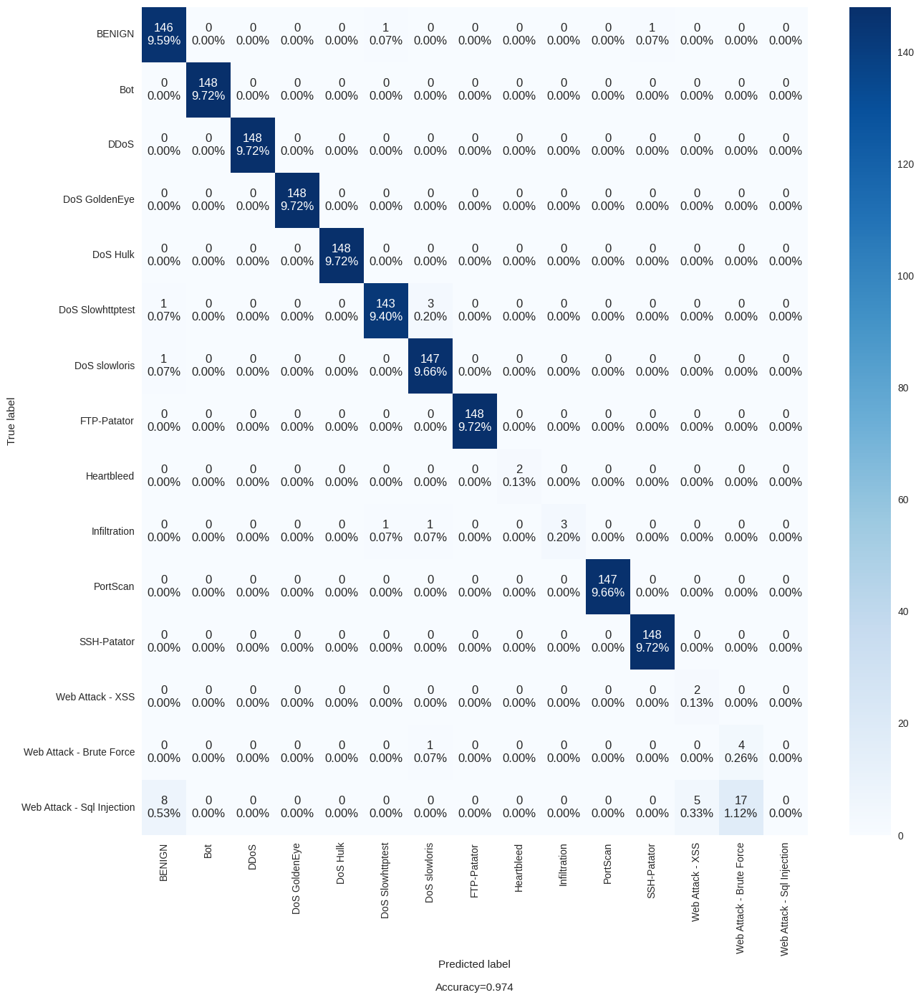

In [126]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - XSS',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [127]:
removed_class = 13
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.997202,0.992116
1,PRECISION,0.997267,0.990978
2,RECALL,0.997202,0.992116
3,F1 SCORE,0.997202,0.991173


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


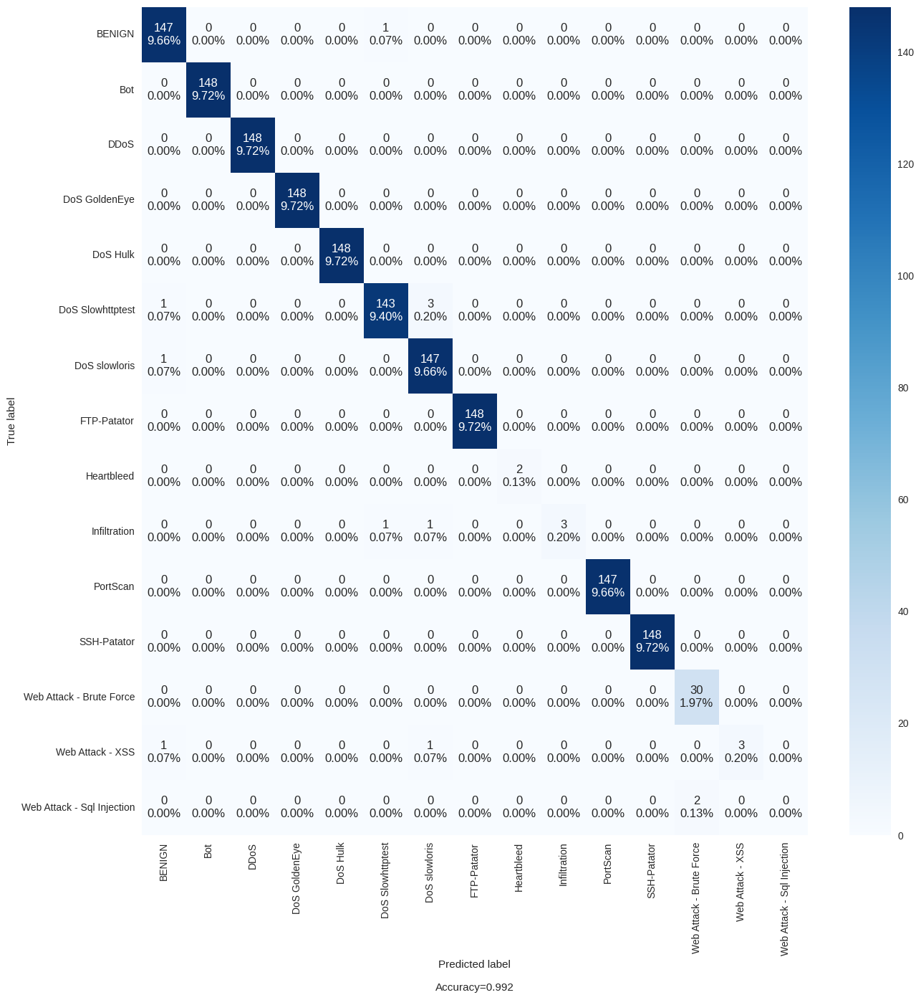

In [128]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - XSS',
 'Web Attack - Sql Injection',])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [129]:
removed_class = 14
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.997197,0.990802
1,PRECISION,0.997262,0.987907
2,RECALL,0.997197,0.990802
3,F1 SCORE,0.997196,0.988989


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


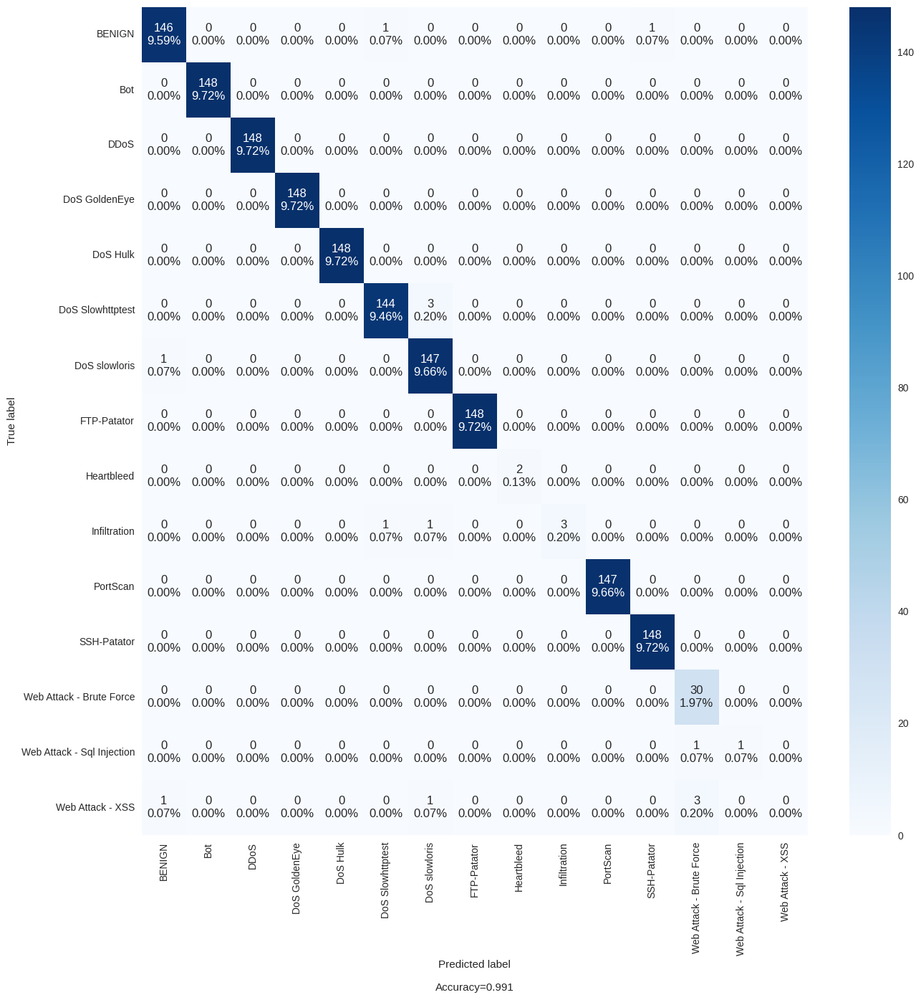

In [130]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))